In [308]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
from tabulate import tabulate
import seaborn as sns
import scikitplot as skplt
from numpy import percentile
import math
from numpy import arange
import IPython.display as ipd
import matplotlib.lines as mlines

#pandas
from pandas.plotting import parallel_coordinates
import datetime

#sklearn
from sklearn.preprocessing import PowerTransformer, QuantileTransformer
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler, RobustScaler, StandardScaler

from sklearn.decomposition import PCA
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import learning_curve

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix, roc_curve, auc
from sklearn.metrics import roc_auc_score, precision_score, recall_score, make_scorer
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline

#scikitplot
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_lift_curve
from scikitplot.metrics import plot_cumulative_gain

#tslearn
from tslearn.metrics import dtw, dtw_path, cdist_dtw, subsequence_cost_matrix

#mlxtend
from mlxtend.plotting import plot_decision_regions

#matplotlib
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from matplotlib import pyplot

#seaborn
import seaborn as sns

#scipy
import scipy.stats as stats
from scipy.stats import shapiro, mannwhitneyu, normaltest, kstest
from scipy.stats import boxcox, yeojohnson
from scipy.spatial.distance import euclidean, cityblock, cosine, minkowski
from scipy.spatial.distance import cdist

#matrixprofile
import matrixprofile
from matrixprofile import *
from matrixprofile.discords import discords

In [309]:
def plot_time_series_years(column, legend_item, color, together, df, columns, period_type):
    if not together and column != "" and legend_item != "" and color != "":
        fig, ax = plt.subplots(figsize=(8, 5))
        ts = df[column]
        plt.plot(ts, color = color)
        plt.grid()
        plt.legend([legend_item], title="Album type")
        plt.xticks(list(df.index))
        plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
        plt.ylabel("count")
        plt.title(column + " TS")
    else:
        fig, ax = plt.subplots(figsize=(8, 5))
        ts1 = df[columns[0]]  #Studio_Recording
        ts2 = df[columns[1]]  #Live_Recording
        plt.plot(ts1, color = '#ea0064')
        plt.plot(ts2, color = '#b329ff')
        plt.grid()
        plt.legend([columns[0].replace(("_"+period_type+"_freq"), "").replace("_", " "), 
                    columns[1].replace(("_"+period_type+"_freq"), "").replace("_", " ")],
                    title="Album type")
        plt.xticks(list(df.index))
        plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
        plt.ylabel("count")
        plt.title(columns[0] + " - " + columns[1] + " TSs")
    plt.show()

In [310]:
def plot_other_time_series(ts1, ts2, together, columns, period_type):
    
    if not together:
        time_series = [ts1, ts2]
        colors = ['#ea0064', '#b329ff']
        for ts, color, column in zip(time_series, colors, columns):
            fig, ax = plt.subplots(figsize=(8, 5))
            legend_item = column.replace(("_"+period_type+"_freq"), "").replace("_", " ")
            plt.plot(ts.values, color = color)
            plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
            plt.grid()
            plt.legend([legend_item], title="Album type")
            plt.ylabel("count")
            plt.title(column + " TS")
            
            if period_type == 'month':
                ax.xaxis.set_major_locator(MultipleLocator(20))
                ax.xaxis.set_minor_locator(MultipleLocator(10))
                ax.tick_params(which='major', length=9)
                ax.tick_params(which='minor', length=7, color='r')
                
            if period_type == 'week':
                ax.xaxis.set_major_locator(MultipleLocator(100))
                ax.xaxis.set_minor_locator(MultipleLocator(50))
                ax.tick_params(which='major', length=9)
                ax.tick_params(which='minor', length=7, color='r')
                
            plt.show()
        
    else:
        fig, ax = plt.subplots(figsize=(8, 5))
        ts1 = ts1  #Studio_Recording
        ts2 = ts2  #Live_Recording
        plt.plot(ts1.values, color = '#ea0064')
        plt.plot(ts2.values, color = '#b329ff')
        plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
        plt.grid()
        plt.legend([columns[0].replace(("_"+period_type+"_freq"), "").replace("_", " "), 
                    columns[1].replace(("_"+period_type+"_freq"), "").replace("_", " ")],
                    title="Album type")
        plt.ylabel("count")
        plt.title(columns[0] + " - " + columns[1] + " TSs")
        
        if period_type == 'month':
            ax.xaxis.set_major_locator(MultipleLocator(20))
            ax.xaxis.set_minor_locator(MultipleLocator(10))
            ax.tick_params(which='major', length=9)
            ax.tick_params(which='minor', length=7, color='r')
                
        if period_type == 'week':
            ax.xaxis.set_major_locator(MultipleLocator(100))
            ax.xaxis.set_minor_locator(MultipleLocator(50))
            ax.tick_params(which='major', length=9)
            ax.tick_params(which='minor', length=7, color='r')
   
        plt.show()

In [311]:
def plot_other_time_series2(ts, column, ts1, ts2, legend_item, color, together, columns, period_type):
    
    if not ts1 and not ts2 and not together and legend_item != "" and color != "":
        fig, ax = plt.subplots(figsize=(8, 5))
        plt.plot(ts.values, color = color)
        plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
        plt.grid()
        plt.legend([legend_item], title="Album type")
        plt.ylabel("count")
        plt.title(column + " TS")
    else:
        fig, ax = plt.subplots(figsize=(8, 5))
        ts1 = ts1  #Studio_Recording
        ts2 = ts2  #Live_Recording
        plt.plot(ts1.values, color = '#ea0064')
        plt.plot(ts2.values, color = '#b329ff')
        plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
        plt.grid()
        plt.legend([columns[0].replace(("_"+period_type+"_freq"), "").replace("_", " "), 
                    columns[1].replace(("_"+period_type+"_freq"), "").replace("_", " ")],
                    title="Album type")
        plt.ylabel("count")
        plt.title(columns[0] + " - " + columns[1] + " TSs")
    plt.show()

In [312]:
#Transformations
def offset_translation(ts):
    return ts - ts.mean()

def amplitude_scaling(ts):
    return (ts - ts.mean())/ts.std()

def noise(ts):
    return ((ts - ts.mean())/ts.std()).rolling(window=1).mean()

def trend_removal(ts):
    return ts - ts.rolling(window=2).mean()

#Get Transformations
def get_transformation(ts):
    transformations = list()
    
    t = offset_translation(ts)
    transformations.append(t)
    
    t = amplitude_scaling(ts)
    transformations.append(t)
    
    t = noise(ts)
    transformations.append(t)
    
    t = trend_removal(ts)
    transformations.append(t)

    return transformations

In [313]:
distances = [euclidean, cityblock, cosine, minkowski]
transformation_names = ['offset_translation', 'amplitude_scaling', 'noise', 'trend_removal']

In [314]:
indexes = [((i.__name__) + '_distance').title() for i in distances]

In [315]:
def plot_distances_dataframes_normal_global_constraints(ts1, ts2, columns, year_period):
    
    df_temp = pd.DataFrame(index = indexes)
    df_temp.index.name = (columns[0] + " - " + columns[1]).title()
    
    if not year_period:
        ts1 = pd.Series(ts1)
        ts2 = pd.Series(ts2)
    
    for i, distance in enumerate(distances):

        #key for each distance
        key = indexes[i]

        #dataset for each distance with initially only normal distance between ts1 and ts2
        df_temp.loc[key, 'No_transformation'] = distance(ts1, ts2)

        #applies transformation on ts1 and ts2 
        for transformation_ts1, transformation_ts2, transformation_name in \
        zip(get_transformation(ts1), get_transformation(ts2), transformation_names):
            ts1_temp = transformation_ts1
            ts2_temp = transformation_ts2

            #check for nonfinite values (e.g. NaN values) and deletes these from ts
            for ts in [ts1_temp, ts2_temp]:
                for i in ts.index:
                    if not (np.isfinite(ts.loc[i])):
                        ts.drop(labels=i, inplace = True)

            #calculates distance between ts1 and ts2
            df_temp.loc[key, transformation_name.title()] = distance(ts1_temp, ts2_temp)
            
    ipd.display(df_temp)

In [316]:
def plot_distances_dataframes_normal_global_constraints2(ts1, ts2, columns):
    for distance in distances:

        #key for each distance
        key = [(columns[0] + " - " + columns[1] + " " + (distance.__name__) + '_distance ').title()]

        #dataset for each distance with initially only normal distance between ts1 and ts2
        df_temp = pd.DataFrame({'No_transformation': distance(ts1, ts2)}, index = (key))

        #applies transformation on ts1 and ts2 
        for transformation_ts1, transformation_ts2, transformation_name in \
        zip(get_transformation(ts1), get_transformation(ts2), transformation_names):
            ts1_temp = transformation_ts1
            ts2_temp = transformation_ts2

            #check for nonfinite values (e.g. NaN values) and deletes these from ts
            for ts in [ts1_temp, ts2_temp]:
                for i in ts.index:
                    if not (np.isfinite(ts.loc[i])):
                        ts.drop(labels=i, inplace = True)

            #calculates distance between ts1 and ts2
            df_temp.loc[key, transformation_name.title()] = distance(ts1_temp, ts2_temp)
            df_temp.index.name = ((distance.__name__) + '_distance ').title()

        ipd.display(df_temp)

In [317]:
def plot_translation_plot(ts1, ts2, columns, year_period, period_type):
    
    if not year_period:
        ts1 = pd.Series(ts1.values)
        ts2 = pd.Series(ts2.values)
        
    ts_temps = []

    for i, transformation_ts1, transformation_ts2, transformation_name in \
        zip(range(0,4), get_transformation(ts1), get_transformation(ts2), transformation_names):
            ts1_temp = transformation_ts1
            ts2_temp = transformation_ts2
            ts_temps.append((ts1_temp, ts2_temp, transformation_name))

            
    for i, (a,b,c) in enumerate(ts_temps):
        
        fig, ax = plt.subplots(figsize=(8, 5))
        ax.plot(ts_temps[i][0], color = '#ea0064')
        ax.plot(ts_temps[i][1], color = '#b329ff')  
        
        if year_period:
            if c != 'trend_removal':
                ax.xaxis.set_major_locator(MultipleLocator(2))
                ax.xaxis.set_minor_locator(MultipleLocator(1))
                ax.tick_params(which='major', length=9)
                ax.tick_params(which='minor', length=7, color='r')
                
        if period_type == 'month':
            ax.xaxis.set_major_locator(MultipleLocator(20))
            ax.xaxis.set_minor_locator(MultipleLocator(10))
            ax.tick_params(which='major', length=9)
            ax.tick_params(which='minor', length=7, color='r')
                
        if period_type == 'week':
            ax.xaxis.set_major_locator(MultipleLocator(100))
            ax.xaxis.set_minor_locator(MultipleLocator(50))
            ax.tick_params(which='major', length=9)
            ax.tick_params(which='minor', length=7, color='r')

        plt.title(columns[0] + " - " + columns[1] + "\n" + ts_temps[i][2].title())
        plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
        plt.legend([columns[0].replace(("_"+period_type+"_freq"), "").replace("_", " "), 
                    columns[1].replace(("_"+period_type+"_freq"), "").replace("_", " ")],
                    title="Album type")
        plt.grid()
        plt.show()

In [318]:
def plot_translation_plot2(ts1, ts2, columns):
    ts_temps = []

    for i, transformation_ts1, transformation_ts2, transformation_name in \
        zip(range(0,4), get_transformation(ts1), get_transformation(ts2), transformation_names):
            ts1_temp = transformation_ts1
            ts2_temp = transformation_ts2
            ts_temps.append((ts1_temp, ts2_temp, transformation_name))

    for i, (a,b,c) in enumerate(ts_temps):
        plt.plot(ts_temps[i][0])
        plt.plot(ts_temps[i][1])    
        plt.title(columns[0] + " - " + columns[1] + " " + ts_temps[i][2].title())
        plt.grid()
        plt.show()

In [319]:
def plot_point_to_point_matrix(ts1, ts2, columns, year_period):
    
    if not year_period:
        ts1 = pd.Series(ts1)
        ts2 = pd.Series(ts2)
    
    mat = cdist(ts1.values.reshape(-1,1), ts2.values.reshape(-1,1)) 

    if year_period:
        fig, ax = plt.subplots(figsize=(8, 8))

        ax.imshow(mat, cmap = "RdPu")
        ax.axis("off")
        ax.autoscale(False)
        for i in range(mat.shape[0]):
            for j in range(mat.shape[1]):
                text = ax.text(j, i, '%.1f' % mat[i, j], ha="center", va="center", color="w")

        plt.title(columns[0] + " - " + columns[1] + "\n" + "Point to Point Matrix")        
        plt.show()
    
    return mat

In [320]:
def plot_cumulative_cost_matrix(ts1, ts2, columns, year_period):
    
    if not year_period:
        ts1 = pd.Series(ts1)
        ts2 = pd.Series(ts2)
        
    acc = subsequence_cost_matrix(ts1.values.reshape(-1,1), ts2.values.reshape(-1,1))

    fig, ax = plt.subplots(figsize=(8, 8))

    ax.imshow(acc, cmap = "RdPu")
    ax.axis("off")
    ax.autoscale(False)
    for i in range(acc.shape[0]):
        for j in range(acc.shape[1]):
            text = ax.text(j, i, '%.1f' % np.sqrt(acc[i, j]), ha="center", va="center", color="w")

    plt.title(columns[0] + " - " + columns[1] + "\n" + "Cumulative Cost Matrix")   
    plt.show()

In [321]:
#-------------------------------------------Calculates DTW path---------------------------------------------#
def calculate_dtw_path(ts1, ts2, flag):
    
    if flag == 'normal':
        path, dist = dtw_path(ts1, ts2)
    elif flag == 'sakoe_chiba':
        path, dist = dtw_path(ts1, ts2, global_constraint="sakoe_chiba", sakoe_chiba_radius=2)
    else:
        path, dist = dtw_path(ts1, ts2, global_constraint="itakura", itakura_max_slope=2.)
        
    return path, dist


#-------------------------------------------Plots optimal path---------------------------------------------#
def plot_optimal_path(mat, path, flag, columns):
    
    fig, ax = plt.subplots(figsize=(8, 8))
    
    ax.imshow(mat, cmap = "RdPu")
    ax.axis("off")
    ax.autoscale(False)
    ax.plot([j for (i, j) in path], [i for (i, j) in path], "w-", linewidth=3.)
    if flag == 'normal':
        title = columns[0] + " - " + columns[1] + "\n" + "Optimal Path"
    else:
        title = columns[0] + " - " + columns[1] + "\n" + flag.title() + " global constraint's Optimal Path"
    plt.title(title)
    plt.show()
    
    
#--------------------------------------Calculates and plots optimal path-----------------------------------#
def calculate_and_plot_optimal_paths(mat, ts1, ts2, columns, year_period):
    
    year_period = year_period
    
    if not year_period:
        ts1 = pd.Series(ts1)
        ts2 = pd.Series(ts2)
        
    flag_list = ['normal', 'sakoe_chiba', 'itakura']

    for i in flag_list:

        path, dist = calculate_dtw_path(ts1, ts2, i)

        print("%s Dist: %d" % (i.title(), dist))
        if year_period:
            print("%s Path:\n" %(i.title()), path)

        print()

        plot_optimal_path(mat, path, i, columns)
        print()


<h2>MatrixProfile</h2>

In [322]:
def matrixProfile_stomp(ts, w, column, color, legend_item, period_type):
    
    fig, ax = plt.subplots(figsize=(8, 5))
    
    mp, mpi = matrixProfile.stomp(ts.values, w)
    
    ax.plot(mp, color = color)
    plt.title(column + "'s Matrix Profile (w = %d)" % (w))
    plt.grid()
    plt.legend([legend_item], title="Album type")
    
    if period_type == 'month':
        ax.xaxis.set_major_locator(MultipleLocator(20))
        ax.xaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
                
    if period_type == 'week':
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(50))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
    
    plt.show()
    
    return mp, mpi

<h2>Motif Discovery</h2>

In [323]:
def plot_motifs(ts, mo, mod, max_motifs, column, w, color, legend_item, period_type):
    
    fig, ax = plt.subplots(figsize=(8, 5))
    
    #Total motifs
    li = ax.plot(ts.values, color = color)
    
    if period_type == 'month':
        ax.xaxis.set_major_locator(MultipleLocator(20))
        ax.xaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
                
    if period_type == 'week':
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(50))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
    
    colors = ['c', 'g', 'k', 'b', 'y'][:len(mo)]
    lista_generale2 = []
    legend = [legend_item]
    
    for n, m, d, c in zip(range(0, len(mo)), mo, mod, colors):
        
        lista_provvisoria2 = []
        
        for i in m:
            m_shape = ts.values[i:i+w]
            plt.plot(range(i,i+w), m_shape, color=c, lw=3)
            
            if i in li[0].get_data()[0]:
                lista_provvisoria2.append(ts.index[i])
            
        lista_generale2.append(lista_provvisoria2)
        legend.append(lista_provvisoria2)
        
        print ("- Motif "+str(n)+": ", *lista_provvisoria2, sep = " | ")
        print()
    
    
    bbox_to_anchor = ""
    if period_type == 'week' or period_type == 'weekday' or period_type == 'daymoment':
        bbox_to_anchor = (0.0,-0.1)
    else:
        bbox_to_anchor = (1.05, 1)
    
    plt.legend(legend, title="Album type - Motifs", bbox_to_anchor=bbox_to_anchor, loc='upper left')
    leg = ax.get_legend()
    for num, motif, color in zip(range(1, len(mo)+1), mo, colors):
        leg.legendHandles[num].set_color(color)
        
    
    #print("---------------------------------------------------------------------------------------------")
    print()
    #print("Motifs translated: ", lista_generale2)
    #print()
            

    plt.title(column + "\ntop %d Motifs (w = %d)" %(max_motifs, w))
    plt.grid()    
    plt.ylabel("count")
    plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
    plt.show()

<h2>Anomaly Discovery</h2>

In [324]:
def plot_anomalies(ts, w, anoms, column, color, legend_item, period_type):
    
    fig, ax = plt.subplots(figsize=(8, 5))
    
    #Time series
    li = ax.plot(ts.values, color = color)
    
    if period_type == 'month':
        ax.xaxis.set_major_locator(MultipleLocator(20))
        ax.xaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
                
    if period_type == 'week':
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(50))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
    
    plt.grid()
    plt.ylabel("count")
    plt.title(column + " TS's Anomalies (w = %d)" %(w))
    plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation

    #Anomalies
    colors = ['c', 'g', 'k', 'b', 'y'][:len(anoms)]
    
    for a, c in zip(anoms, colors):
        
        a_shape = ts.values[a:a+w]
        plt.plot(range(a, a+w), a_shape, color=c, lw=3)
        
    
    lista_generale2 = []
    
    for n, i in enumerate(anoms):
        if i in li[0].get_data()[0]:       
            lista_generale2.append(ts.index[i])
       
    print ("- Anomalies: ", *lista_generale2, sep = " | ")
    print()
   
    #print("---------------------------------------------------------------------------------------------")
    print()
    #print("Anomalies translated: ", lista_generale2)
    #print()
    
    legend = [legend_item]
    for i in lista_generale2:
        legend.append(i)

    plt.legend(legend, title="Album type - Anomalies", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()

<h2>Matrix Profile - Motifs - Discords</h2>

In [325]:
def matrixProfile_with_discords(anoms, mp, w, column, columns, color, period_type):
        
    fig, ax = plt.subplots(figsize=(8, 5))
    Discords = ""
    li = ax.plot(mp, color = color)
    
    if period_type == 'month':
        ax.xaxis.set_major_locator(MultipleLocator(20))
        ax.xaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
                
    if period_type == 'week':
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(50))
        ax.tick_params(which='major', length=9)
        ax.tick_params(which='minor', length=7, color='r')
        
    star = ""
    color_star = ""
    
    if column == columns[0]:
        color_star = '#206bff'
    else:
        color_star = '#fb7300'
        
    star = mlines.Line2D([], [], color=color_star, marker='*', markersize=10, label='Discords')
        
    for a, b in zip(li[0].get_data()[0], li[0].get_data()[1]):
        if a in anoms:
            Discords, = plt.plot(a, b, marker='*', c=color_star, markersize = 10)

    plt.title(column + "'s Matrix Profile with discords (w = %d)" % (w))
    plt.grid()
    plt.legend(handles=[star])
    plt.show()

In [326]:
def plot_matrixProfile_motifs_discords(windows, columns, tss_list, period_type):
    
    #windows = [2, 3, 4, 5]
    colors = ['#ea0064', '#b329ff']
    
    for column, ts, color in zip(columns, tss_list, colors):
        
        legend_item = column.replace("_"+period_type+"_freq", "").replace("_", " ")
        
        if period_type != 'year':
            ts = pd.Series(ts)
            
        for w in windows:
            
            #Matrix Profile
            mp, mpi = matrixProfile_stomp(ts, w, column, color, legend_item, period_type)

            #Motifs
            mo, mod = motifs.motifs(ts.values, (mp, mpi), max_motifs=5)
            print("Motifs ({}): {}".format(len(mo), mo))
            print()
            plot_motifs(ts, mo, mod, 5, column, w, color, legend_item, period_type)
            print()
            print()

            #Anomalies
            anoms = discords(mp, ex_zone=3, k=5)
            print("Anomalies ({}): {}".format(len(anoms), anoms))
            print()
            
            plot_anomalies(ts, w, anoms, column, color, legend_item, period_type)
            print()
            
            #Matrix Profile with discords
            print("Anomalies:", anoms)
            
            if anoms.size != 0:
                matrixProfile_with_discords(anoms, mp, w, column, columns, color, period_type)
            
            print()
            print("---------------------------------------------------------------------------------------------")
        
        print("'''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''''")

<h3>Old functions</h3>

In [327]:
def plot_motifs_no(ts, mo, mod, max_motifs, column, w, color, legend_item):
    
    fig, ax = plt.subplots(figsize=(8, 5))
    
    #Total motifs
    plt.plot(ts.values, color = color)
    colors = ['r', 'g', 'k', 'b', 'y'][:len(mo)]
    for m, d, c in zip(mo, mod, colors):
        for i in m:
            m_shape = ts.values[i:i+w]
            plt.plot(range(i,i+w), m_shape, color=c, lw=3)

    plt.title(column + "\ntop %d Motifs (w = %d)" %(max_motifs, w))
    plt.grid()
    plt.legend([legend_item], title="Album type")
    plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation
    plt.show()
    
    #fig, ax = plt.subplots(figsize=(8, 5))
    
    #Single motifs
    #for m, d, c in zip(mo, mod, colors):
    #    for i in m:
    #        m_shape = ts.values[i:i+w]
    #        plt.plot(range(i,i+w), m_shape, color=c, lw=3)
    #        plt.title(column + "\nSingle Motif (w = %d)" %(w))
    #    plt.grid()
    #    plt.show()

In [328]:
def plot_anomalies_no(ts, mo, w, anoms, column, color, legend_item):
    
    fig, ax = plt.subplots(figsize=(8, 5))
    
    #Time series
    plt.plot(ts, color = color)
    plt.grid()
    plt.legend([legend_item], title="Album type")
    plt.ylabel("count")
    plt.title(column + " TS's Anomalies (w = %d)" %(w))
    plt.ticklabel_format(axis='y', useOffset=False, style='plain')  # prevent scientific notation

    #Anomalies
    colors = ['r', 'g', 'k', 'b', 'y'][:len(mo)]
    for a, c in zip(anoms, colors):
        a_shape = ts.values[a:a+w]
        plt.plot(range(a, a+w), a_shape, color=c, lw=3)

    plt.show()

In [329]:
def plot_matrixProfile_motifs_discords_no(windows, columns, tss_list, period_type):
    
    #windows = [2, 3, 4, 5]
    colors = ['#ea0064', '#b329ff']
    
    for column, ts, color in zip(columns, tss_list, colors):
        
        legend_item = column.replace("_"+period_type+"_freq", "").replace("_", " ")
        
        if period_type != 'year':
            ts = pd.Series(ts)
            
        for w in windows:
            
            #Matrix Profile
            mp, mpi = matrixProfile_stomp(ts, w, column, color, legend_item)

            #Motifs
            mo, mod = motifs.motifs(ts, (mp, mpi), max_motifs=5)
            print("Motifs: ", mo)
            plot_motifs(ts, mo, mod, 5, column, w, color, legend_item)

            #Anomalies
            anoms = discords(mp, ex_zone=3, k=5)
            plot_anomalies(ts, mo, w, anoms, column, color, legend_item)
            print("Anomalies:", anoms)
            
            #Matrix Profile with discords
            if anoms.size != 0:
                matrixProfile_with_discords(anoms, mp, w, column, columns, color, legend_item)
        print("------------------------------------------------------------")

In [330]:
def get_Studio_and_Live_Recording_cols(df):
    
    col_studio = [col for col in df if 'Studio_Recording' in col]
    col_live = [col for col in df if 'Live_Recording' in col]
    
    dataset_studio = df[col_studio]
    dataset_live = df[col_live]
    
    return dataset_studio, dataset_live

In [331]:
def get_time_series_month(df1, df2):
    
    ts_month_studio = []
    ts_month_live = []
    TSs_list = []

    for dataset, ts in zip([df1, df2], [ts_month_studio, ts_month_live]):
        for ind in dataset.index:
            row = []
            for col in dataset.columns:
                row.append(dataset[col][ind])
            ts.append(row)

        ts = [j for i in ts for j in i]
        ts = [i for i in ts if i != 0]
        ts.append(0)
        TSs_list.append(ts)
        
    ts_month_studio = TSs_list[0]
    ts_month_live = TSs_list[1]
        
    return ts_month_studio, ts_month_live

In [332]:
def get_time_series_other_types(df1, df2):
    
    ts_studio = []
    ts_live = []
    TSs_list = []

    for dataset, ts in zip([df1, df2], [ts_studio, ts_live]):
        for ind in dataset.index:
            row = []
            for col in dataset.columns:
                row.append(dataset[col][ind])
            ts.append(row)

        ts = [j for i in ts for j in i]
        #ts = [i for i in ts if i != 0]
        #ts.append(0)
        TSs_list.append(ts)
        
    ts_studio = TSs_list[0]
    ts_live = TSs_list[1]
        
    return ts_studio, ts_live

In [333]:
def get_cols_period_type(df):
    
    cols = []
    for string in df.columns.tolist():
        for char in string:
            if char.isdigit():
                string = string.replace(char, "")

        cols.append(string[0:len(string)-1] + "_freq")

    cols = sorted(list(set(cols)), reverse = True)
    
    return cols

<h1>Inizio file<h1>

In [334]:
from tslearn.utils import to_time_series_dataset
from tslearn.clustering import silhouette_score as sil_ts
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, silhouette_samples, davies_bouldin_score
from sklearn.cluster import KMeans, DBSCAN
from scipy.spatial.distance import pdist, squareform
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
import zlib
import string
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from tslearn.piecewise import PiecewiseAggregateApproximation
from tslearn.piecewise import SymbolicAggregateApproximation
from tslearn.piecewise import OneD_SymbolicAggregateApproximation
import numpy as np
import scipy.stats as stats
import collections
import math

In [335]:
def find_optimal_k_kmeans(max_k, metric, X, other_measures, album_type):
    
    max_k = max_k
    
    sse_list = list()
    silhouette = list()
    
    if other_measures:
        calinski = list()
        bouldin = list()
        fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (18, 10))
        
    else:
        fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 7))

    for k in range(2, max_k + 1):
        
        kmeans = ""
        
        if not other_measures:
            kmeans = TimeSeriesKMeans(n_clusters = k, max_iter = 300, n_init = 10, metric = metric, random_state = 0)
            
        else:
            kmeans = KMeans(n_clusters = k, n_init = 10, max_iter = 300, algorithm='full', random_state = 0)
            
        kmeans.fit(X)

        sse = kmeans.inertia_
        sse_list.append(sse)
        
        if not other_measures:
            sil = sil_ts(X, kmeans.labels_, metric = metric) #silhouette score di TimeSeriesKMeans
            
        else:
            sil = silhouette_score(X, kmeans.labels_)        #silhouette score di sklearn
            
        silhouette.append(sil)
        
        if other_measures:
            cal = calinski_harabasz_score(X, kmeans.labels_)
            calinski.append(cal)

            boul = davies_bouldin_score(X, kmeans.labels_)
            bouldin.append(boul)

        print("k: ", k, "SSE: ", sse, "Silhouette Score: ", sil)
        
        if other_measures:
            print("Calinski-Harabaz: ", cal, "Davies-Bouldin: ", boul)
            
        print()
    
    index = [i for i in range(2, max_k + 1)]
    
    if other_measures:
        ax[0, 0].plot(index, sse_list)
        ax[0, 0].set_ylabel('SSE', fontsize = 15)
        ax[0, 0].set_xlabel('K', fontsize = 15)
        ax[0, 0].set_title(album_type + ' SSE', fontsize = 18)

        ax[0, 1].plot(index, silhouette)
        ax[0, 1].set_ylabel('SIL', fontsize = 15)
        ax[0, 1].set_xlabel('K', fontsize = 15)
        ax[0, 1].set_title(album_type + '\nSilhouette Score', fontsize = 18)
        
        ax[1, 0].plot(index, calinski)
        ax[1, 0].set_ylabel('CAL', fontsize = 15)
        ax[1, 0].set_xlabel('K', fontsize = 15)
        ax[1, 0].set_title(album_type + '\nCalinski-Harabaz Score', fontsize = 18)

        ax[1, 1].plot(index, bouldin)
        ax[1, 1].set_ylabel('BOUL', fontsize = 15)
        ax[1, 1].set_xlabel('K', fontsize = 15)
        ax[1, 1].set_title(album_type + '\nDavies-Bouldin Score', fontsize = 18)
        
        plt.subplots_adjust(hspace=0.5)
        
    else:
        ax1.plot(index, sse_list)
        ax1.set_ylabel('SSE', fontsize = 15)
        ax1.set_xlabel('K', fontsize = 15)
        ax1.set_title(album_type + ' SSE', fontsize = 18)

        ax2.plot(index, silhouette)
        ax2.set_ylabel('SIL', fontsize = 15)
        ax2.set_xlabel('K', fontsize = 15)
        ax2.set_title(album_type + '\nSilhouette Score', fontsize = 18)
    
    #if ticks:
    #    for axis in ax.flat:
    #        axis.xaxis.set_major_locator(MultipleLocator(2))
    #        axis.xaxis.set_minor_locator(MultipleLocator(1))
    #        axis.tick_params(which='major', length=9)
    #        axis.tick_params(which='minor', length=7, color='r')

    plt.show()
    fig.tight_layout()

In [336]:
def run_kmeans(n_clusters, max_iter, n_init, metric, X, other_measures):
    
    kmeans = ""
    if not other_measures:
        kmeans = TimeSeriesKMeans(n_clusters=n_clusters, max_iter = max_iter, n_init = n_init, metric = metric, random_state = 0)
        
    else:
        kmeans = KMeans(n_clusters = n_clusters, n_init = n_init, max_iter = max_iter, algorithm='full', random_state = 0)
        
    kmeans.fit(X)
    
    hist, bins = np.histogram(kmeans.labels_, bins=range(0, len(set(kmeans.labels_)) + 1))
    print ('cluster_centers_shape', kmeans.cluster_centers_.shape)
    print()
    
    print ('Labels: ', dict(zip(bins, hist)))
    print()
    
    print ('SSE: ', kmeans.inertia_)
    
    if not other_measures:
        print ('Silhouette Score: ', sil_ts(X, kmeans.labels_, metric = metric))  #silhouette score di TimeSeriesKMeans
        
    if other_measures:
        print ('Silhouette Score: ', silhouette_score(X, kmeans.labels_))  #silhouette score di sklearn
        print ("Calinski - Harabaz Score: ", calinski_harabasz_score(X, kmeans.labels_))
        print ("Davies - Bouldin Score: ", davies_bouldin_score(X, kmeans.labels_))
    
    return kmeans.cluster_centers_, dict(zip(bins, hist)), kmeans.labels_

In [337]:
def plot_kmeans_centroids(centers, album_type):
    
    fig, ax = plt.subplots()
    plt.plot(np.squeeze(centers).T)
    plt.title(album_type + ' centroids')
    
    plt.show()

In [338]:
def cluster_insight(df_to_copy, labels):
    
    df = df_to_copy.copy()
    df['Labels'] = labels
    
    ipd.display(df)
    
    for i in np.unique(df['Labels']):
        print("Cluster {}\n".format(i), list(df[df['Labels'] == i].index))
        print()

In [339]:
def cluster_insight_studio_live(df_to_copy, labels):

    df = df_to_copy.copy()
    df['Labels'] = labels
    
    print("Dataset con le labels associate")
    ipd.display(df)
    
    cluster_dict = pd.DataFrame(columns = ["Studio_Recording", "Live_Recording"], \
                                index = ["Cluster {}".format(str(i)) for i in np.unique(df['Labels'])])
    
    tot_entropies = []
    dim_clusters = []
    max_cluster = 0
    
    for i in np.unique(df['Labels']):
        
        cluster_list = list(df[df['Labels'] == i].index)
                            
        print("Cluster {}\n".format(i), cluster_list)
        
        raw_elements = [elem.split("_")[1] for elem in cluster_list]
        counter = collections.Counter(raw_elements)
        
        cluster_dict.loc["Cluster {}".format(str(i)), 'Studio_Recording'] = counter['studio']
        cluster_dict.loc["Cluster {}".format(str(i)), 'Live_Recording'] = counter['live']
        
        cluster_dict.loc["Cluster {}".format(str(i)), 'Tot_Cluster'] = cluster_dict.loc["Cluster {}".format(str(i)), ['Studio_Recording', 'Live_Recording']].sum()
        
        lista = cluster_dict.loc['Cluster {}'.format(str(i)), ['Studio_Recording', 'Live_Recording']].values.tolist()
        tot = sum(lista)
        dim_clusters.append(tot)
        
        '''
        Entropia singola: -(sommatoria di (pij log2 pij) per tutte le classi all'interno di un cluster.
        --> pij = mij/mj dove mj è il numero di valori nel cluster j e mij è il numero di valori della classe i
        nel cluster j.
        '''
        entropy_single = -sum([(x/tot)*math.log2(x/tot) for x in lista if x != 0])
        cluster_dict.loc["Cluster {}".format(str(i)), 'Entropy'] = "%.4f" %(entropy_single)
        tot_entropies.append(entropy_single)
        
        
        '''
        Purity singola: etichetta della classe più frequente/numero di valori nel cluster
        '''
        purity_single = max(lista)/tot
        cluster_dict.loc["Cluster {}".format(str(i)), 'Purity'] = "%.4f" %(purity_single)

        max_cluster += max(lista)
        
        print()
        
    
    new_row = pd.Series(cluster_dict[['Studio_Recording', 'Live_Recording', 'Tot_Cluster']].sum(axis=0).astype(int), name = "Total")
    cluster_dict = cluster_dict.append(new_row, ignore_index=False)
    
    '''
    Entropia complessiva: sommatoria delle entropie di ogni cluster pesate per la dimensione di ogni cluster.
    --> (mj/m) * ej --> dove mj è la dimensione del cluster j e m è il numero totale di punti 
    (nel nostro caso 16). 
    '''
    
    last_tot = 16
    tot_entropy = 0

    for entropy, dim in zip(tot_entropies, dim_clusters):
        tot_entropy+=(entropy*(dim/last_tot))
        
    cluster_dict.loc["Total", 'Entropy'] = "%.4f" %(tot_entropy)
    
    '''
    Purity complessiva: sommatoria delle classi "corrette" (il valore più alto) di ogni cluster, divisa per il
    numero totale di valori (nel nostro caso 16).
    '''
    
    tot_purity = max_cluster/last_tot
    cluster_dict.loc["Total", 'Purity'] = "%.4f" %(tot_purity)
    
    
    
    cluster_dict['Tot_Cluster'] = cluster_dict['Tot_Cluster'].astype(int)
    
    
    ipd.display(cluster_dict)

In [340]:
def analyze_clusters(labels, X, df_to_copy, album_type, clustering_type, together):
    
    if together:
        plt.figure(figsize=(7,18))
    else:
        plt.figure(figsize=(8,7))
        
    df = df_to_copy.copy()
    df['Labels'] = labels
    
    colors = ['#CC0066', '#FF9124', '#CCCC00', '#FFFF24', '#CC6600', 
          '#FF61B0', '#B061FF', '#CC6699', '#336600', '#52A300', '#70E000', '#99CC00']

    for i in range(len(np.unique(labels))):
        
        plt.subplot(len(np.unique(labels)), 1, i + 1)
        
        for x, y, color in zip(X[labels == i], df[df['Labels'] == i].index, colors):
            plt.plot(x, color = color, linewidth=0.9, label = y)
        
        plt.title(album_type + " - " + clustering_type + ': Cluster {}'.format(i), fontsize=13)
        
        plt.legend(title="Time Series", bbox_to_anchor = (1.03, 1), loc='upper left', \
                   frameon = True, shadow = True)
        
    plt.tight_layout()
    
    if together:
        plt.subplots_adjust(hspace=0.4)
    else:
        plt.subplots_adjust(hspace=0.7)
    plt.show()

In [415]:
def analyze_approximated_clusters(labels, X, df, album_type, clustering_type, together):
    
    if together:
        plt.figure(figsize=(7,18))
    else:
        plt.figure(figsize=(8,7))
        
    df = pd.DataFrame(np.squeeze(X), index = df.index)
    
    if together:
        
        cluster_insight_studio_live(df, labels)

        df['Labels'] = labels
    
    else:
        df['Labels'] = labels
        
        ipd.display(df)
        print()

        for i in np.unique(df['Labels']):
            print("Cluster {}\n".format(i), list(df[df['Labels'] == i].index))
            print()
            
    
    print()
    
    colors = ['#CC0066', '#FF9124', '#CCCC00', '#FFFF24', '#CC6600', 
          '#FF61B0', '#B061FF', '#CC6699', '#336600', '#52A300', '#70E000', '#99CC00']

    for i in range(len(np.unique(labels))):
        
        plt.subplot(len(np.unique(labels)), 1, i + 1)
        
        for x, y, color in zip(X[labels == i], df[df['Labels'] == i].index, colors):
            plt.plot(x, color = color, linewidth=0.9, label = y)
        
        plt.title(album_type + " - " + clustering_type + ': Cluster {}'.format(i), fontsize=13)
        plt.legend(title="Time Series", bbox_to_anchor = (1.03, 1), loc='upper left', \
                   frameon = True, shadow = True)
        
    plt.tight_layout()
    
    if together:
        plt.subplots_adjust(hspace=0.9)
    else:
        plt.subplots_adjust(hspace=1.3)
    plt.show()

In [342]:
def analyze_clusters_fb(labels, X, album_type, clustering_type, together):
    
    if together:
        plt.figure(figsize=(7,18))
    else:
        plt.figure(figsize=(8,7))
        
    colors = ['#CC0066', '#FF9124', '#CCCC00', '#FFFF24', '#CC6600', 
          '#FF61B0', '#B061FF', '#CC6699', '#336600', '#52A300', '#70E000', '#99CC00']

    for i in range(len(np.unique(labels))):
        
        plt.subplot(len(np.unique(labels)), 1, i + 1)
        
        for x, color in zip(X[labels == i], colors):
            plt.plot(x, color = color, linewidth=0.9)
        plt.title(album_type + " - " + clustering_type + ': Cluster {}'.format(i), fontsize=13)
        
    plt.tight_layout()
    
    if together:
        plt.subplots_adjust(hspace=0.4)
    else:
        plt.subplots_adjust(hspace=0.7)
    plt.show()

In [343]:
def calculate_features(values):
    features = {
        'avg': np.mean(values),
        'std': np.std(values),
        'var': np.var(values),
        #'med': np.median(values),
        #'10p': np.percentile(values, 10),
        #'25p': np.percentile(values, 25),
        #'50p': np.percentile(values, 50),
        #'75p': np.percentile(values, 75),
        #'90p': np.percentile(values, 90),
        #'iqr': np.percentile(values, 75) - np.percentile(values, 25),
        #'cov': 1.0 * np.mean(values) / np.std(values),
        'skw': stats.skew(values),
        'kur': stats.kurtosis(values)
    }
    
    return features

In [344]:
def plot_mean_values(labels, X, album_type):
    
    for i in range(0, len(np.unique(labels))):
        plt.plot(np.mean(X[np.where(labels == i)[0]], axis=0))
        plt.title("Mean values plot of {} \nFeatures-based Clustering".format(album_type))
    
    plt.show()

In [345]:
def cdm_dist(x, y):
    x_str = (' '.join([str(v) for v in x.ravel()])).encode('utf-8')
    y_str = (' '.join([str(v) for v in y.ravel()])).encode('utf-8')
    return len(zlib.compress(x_str + y_str)) / (len(zlib.compress(x_str)) + len(zlib.compress(y_str)))

In [346]:
def plot_centroids_approximated(centers, X, album_type, approximation_type):
    plt.plot(centers.reshape(X.shape[1], centers.shape[0]))
    plt.title(album_type + " - " + approximation_type + " centroids\nApproximated Clustering")
    plt.show()

In [347]:
def plot_mean_values_approximated(labels, X, album_type, approximation_type):
    
    for i in range(0, len(np.unique(labels))):
        plt.plot(np.mean(X[np.where(labels == i)[0]], axis=0))
        plt.title("Mean values plot of {} \n{} - Approximated Clustering".format(album_type, \
                                                            approximation_type))
    
    plt.show()

<h2>Datasets Days</h2>

In [349]:
df_studio = pd.read_csv('df_day_studio.csv', index_col = 0)
df_live = pd.read_csv('df_day_live.csv', index_col = 0)
df_studio_live = pd.read_csv('df_day_studio_live.csv', index_col = 0)

<h1>Studio_Recording</h1>

In [350]:
album_type = "Studio_Recording_day"

<h2>Shape based clustering</h2>

<h3>TimeSeriesKMeans</h3>

In [351]:
df_studio

,1,2,3,4,5,6,7,8,9,10,...,357,358,359,360,361,362,363,364,365,366
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,0,2,0,0,0,1,0,0,33,0,...,8,0,20,5,2,78,25,3,3,0
2010_studio,10,21,13,13,4,19,41,34,62,10,...,55,63,1,23,1,26,51,65,3,0
2011_studio,12,23,85,77,51,29,58,10,35,54,...,110,21,0,2,9,27,38,20,2,0
2012_studio,9,67,50,46,14,0,5,9,29,77,...,47,10,20,40,22,55,42,15,41,21
2013_studio,28,33,188,61,6,10,117,85,91,89,...,16,9,0,6,6,7,0,80,42,0
2014_studio,9,41,57,17,35,40,46,31,13,63,...,11,25,12,0,17,23,12,17,24,0
2015_studio,50,38,29,33,21,7,32,4,36,22,...,30,12,8,2,1,15,10,30,44,0
2016_studio,41,6,22,68,99,48,41,73,81,24,...,53,48,11,47,4,42,31,21,86,176


In [352]:
df_studio.shape

(8, 366)

In [353]:
tss_studio = to_time_series_dataset(df_studio.values)
tss_studio

array([[[  0.],
        [  2.],
        [  0.],
        ...,
        [  3.],
        [  3.],
        [  0.]],

       [[ 10.],
        [ 21.],
        [ 13.],
        ...,
        [ 65.],
        [  3.],
        [  0.]],

       [[ 12.],
        [ 23.],
        [ 85.],
        ...,
        [ 20.],
        [  2.],
        [  0.]],

       ...,

       [[  9.],
        [ 41.],
        [ 57.],
        ...,
        [ 17.],
        [ 24.],
        [  0.]],

       [[ 50.],
        [ 38.],
        [ 29.],
        ...,
        [ 30.],
        [ 44.],
        [  0.]],

       [[ 41.],
        [  6.],
        [ 22.],
        ...,
        [ 21.],
        [ 86.],
        [176.]]])

In [354]:
tss_studio.shape

(8, 366, 1)

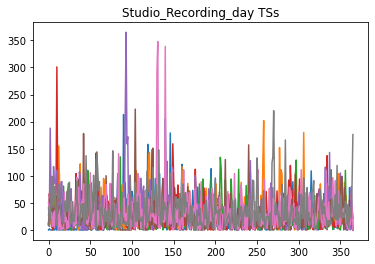

In [355]:
plt.plot(np.squeeze(tss_studio).T)
plt.title(album_type + " TSs")
plt.show()

In [356]:
tss_studio_scaled = TimeSeriesScalerMeanVariance().fit_transform(tss_studio)
tss_studio_scaled

array([[[-0.73249705],
        [-0.66763038],
        [-0.73249705],
        ...,
        [-0.63519705],
        [-0.63519705],
        [-0.73249705]],

       [[-0.693914  ],
        [-0.3371199 ],
        [-0.59660652],
        ...,
        [ 1.09005647],
        [-0.92096479],
        [-1.01827227]],

       [[-0.54969667],
        [-0.1182973 ],
        [ 2.31322646],
        ...,
        [-0.23595167],
        [-0.94187792],
        [-1.02031417]],

       ...,

       [[-0.5712111 ],
        [ 0.56712894],
        [ 1.13629895],
        ...,
        [-0.28662609],
        [-0.03761421],
        [-0.89136923]],

       [[ 0.46456258],
        [ 0.14460667],
        [-0.09536027],
        ...,
        [-0.06869727],
        [ 0.30458462],
        [-0.86858705]],

       [[ 0.12379596],
        [-0.97442167],
        [-0.47237932],
        ...,
        [-0.50375697],
        [ 1.53579005],
        [ 4.35977823]]])

In [357]:
tss_studio_scaled.shape

(8, 366, 1)

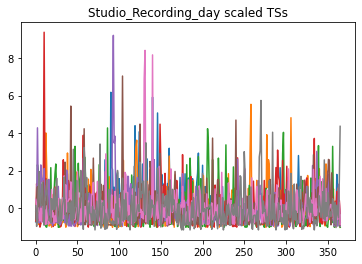

In [358]:
plt.plot(np.squeeze(tss_studio_scaled).T)
plt.title(album_type + " scaled TSs")
plt.show()

**I convert scaled time series dataset to normal dataset**

In [359]:
df_tss_studio_scaled = pd.DataFrame(np.squeeze(tss_studio_scaled), columns = df_studio.columns, \
                                    index = df_studio.index)
df_tss_studio_scaled

,1,2,3,4,5,6,7,8,9,10,...,357,358,359,360,361,362,363,364,365,366
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.473030,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,0.765698,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,3.293680,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,0.609011,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.511510,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.500065,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.068697,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.500328,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778


<h3>Euclidean Distance</h3>

k:  2 SSE:  260.76348968968773 Silhouette Score:  0.03464035609293068

k:  3 SSE:  209.72035631810874 Silhouette Score:  0.04464080780969702

k:  4 SSE:  161.3967004415848 Silhouette Score:  0.05079251525167995

k:  5 SSE:  117.35164081047262 Silhouette Score:  0.04405357045425893

k:  6 SSE:  75.4314880240628 Silhouette Score:  0.03787919332569477

k:  7 SSE:  35.54923440168812 Silhouette Score:  0.020826416930751785



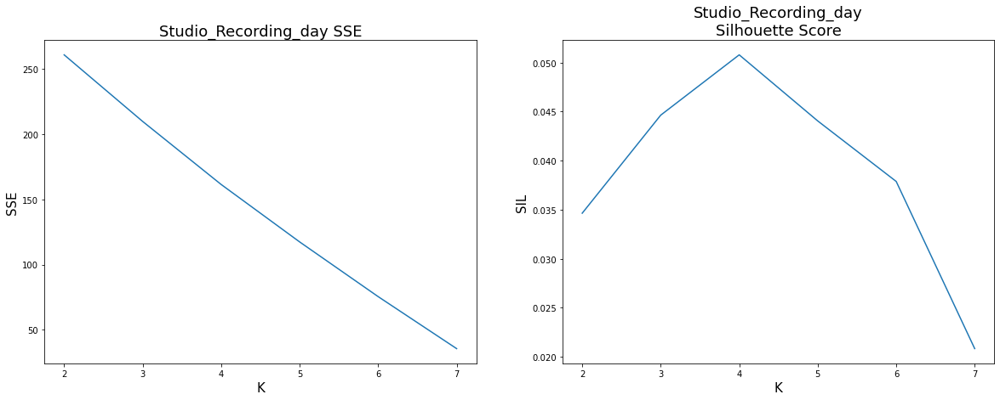

In [360]:
find_optimal_k_kmeans(7, 'euclidean', tss_studio_scaled, False, album_type)

**We can see that best k is 4**

In [361]:
cluster_centers_studio_eu, dict_label_studio_eu, labels_studio_eu = run_kmeans(4, 300, 10, 'euclidean', tss_studio_scaled,\
                                                                      False)

cluster_centers_shape (4, 366, 1)

Labels:  {0: 2, 1: 2, 2: 2, 3: 2}

SSE:  161.3967004415848
Silhouette Score:  0.05079251525167995


In [362]:
cluster_insight(df_tss_studio_scaled, labels_studio_eu)

,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497,3
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272,2
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314,1
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518,0
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255,0
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369,1
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587,3
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778,2


Cluster 0
 ['2012_studio', '2013_studio']

Cluster 1
 ['2011_studio', '2014_studio']

Cluster 2
 ['2010_studio', '2016_studio']

Cluster 3
 ['2009_studio', '2015_studio']



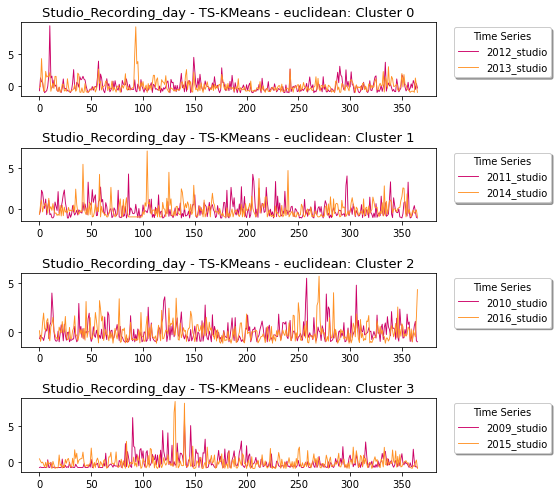

In [363]:
analyze_clusters(labels_studio_eu, tss_studio_scaled, df_tss_studio_scaled, album_type, 'TS-KMeans - euclidean', False)

**Centroids**

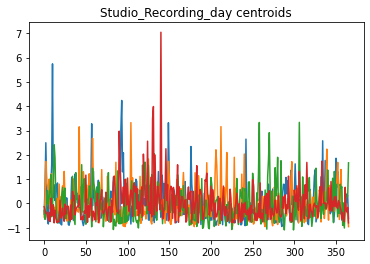

In [364]:
plot_kmeans_centroids(cluster_centers_studio_eu, album_type)

<h3>DTW distance</h3>

k:  2 SSE:  73.05055457829974 Silhouette Score:  0.07047888590635057

k:  3 SSE:  56.90079930108415 Silhouette Score:  0.061009153719676

k:  4 SSE:  41.566021936204024 Silhouette Score:  0.03989686910084711

k:  5 SSE:  30.530300601733288 Silhouette Score:  0.026705324059993978

k:  6 SSE:  19.678769582445426 Silhouette Score:  0.03037152960161859

k:  7 SSE:  8.924531044112392 Silhouette Score:  0.005426324857264457



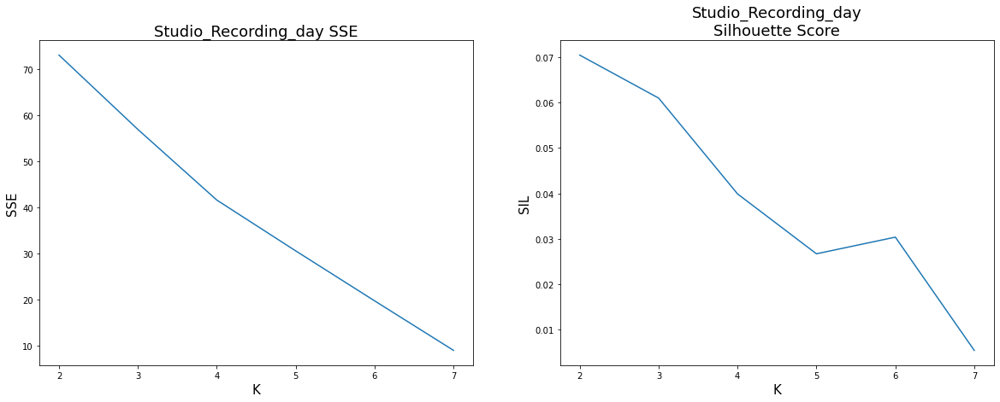

In [365]:
find_optimal_k_kmeans(7, 'dtw', tss_studio_scaled, False, album_type)

**We can see that best k is 3**

In [366]:
cluster_centers_studio_dtw, dict_label_studio_dtw, labels_studio_dtw = run_kmeans(3, 300, 10, 'dtw', tss_studio_scaled,\
                                                                      False)

cluster_centers_shape (3, 366, 1)

Labels:  {0: 2, 1: 3, 2: 3}

SSE:  56.90079930108415
Silhouette Score:  0.061009153719676


In [367]:
cluster_insight(df_tss_studio_scaled, labels_studio_dtw)

,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497,1
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272,2
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314,2
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518,0
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255,0
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369,1
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587,1
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778,2


Cluster 0
 ['2012_studio', '2013_studio']

Cluster 1
 ['2009_studio', '2014_studio', '2015_studio']

Cluster 2
 ['2010_studio', '2011_studio', '2016_studio']



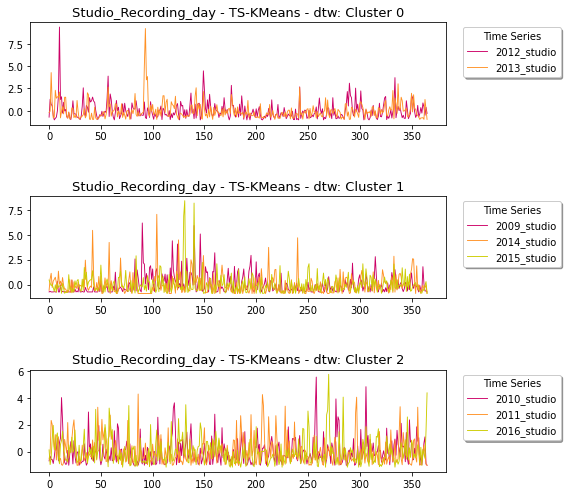

In [368]:
analyze_clusters(labels_studio_dtw, tss_studio_scaled, df_tss_studio_scaled, album_type, 'TS-KMeans - dtw', False)

**Centroids**

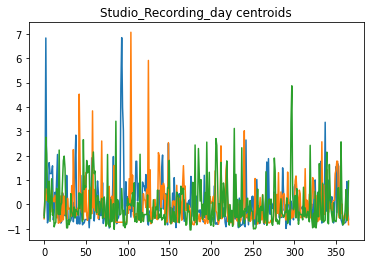

In [369]:
plot_kmeans_centroids(cluster_centers_studio_dtw, album_type)

<h3>KMeans sklearn</h3>

k:  2 SSE:  2086.107917517502 Silhouette Score:  0.03464035609293082
Calinski-Harabaz:  1.2908344111897192 Davies-Bouldin:  2.1550967701103

k:  3 SSE:  1677.7628505448693 Silhouette Score:  0.04464080780969719
Calinski-Harabaz:  1.2772192162399736 Davies-Bouldin:  1.6151880089330308

k:  4 SSE:  1291.1736035326778 Silhouette Score:  0.050792515251680145
Calinski-Harabaz:  1.2843484664526226 Davies-Bouldin:  1.3035676687249738

k:  5 SSE:  938.8131264837801 Silhouette Score:  0.044053570454259124
Calinski-Harabaz:  1.2750925026284627 Davies-Bouldin:  0.966276616467608

k:  6 SSE:  603.451904192502 Silhouette Score:  0.03787919332569484
Calinski-Harabaz:  1.2802739135545176 Davies-Bouldin:  0.742259061775108

k:  7 SSE:  284.3938752135046 Silhouette Score:  0.020826416930751837
Calinski-Harabaz:  1.3188969903363805 Davies-Bouldin:  0.49109641132507714



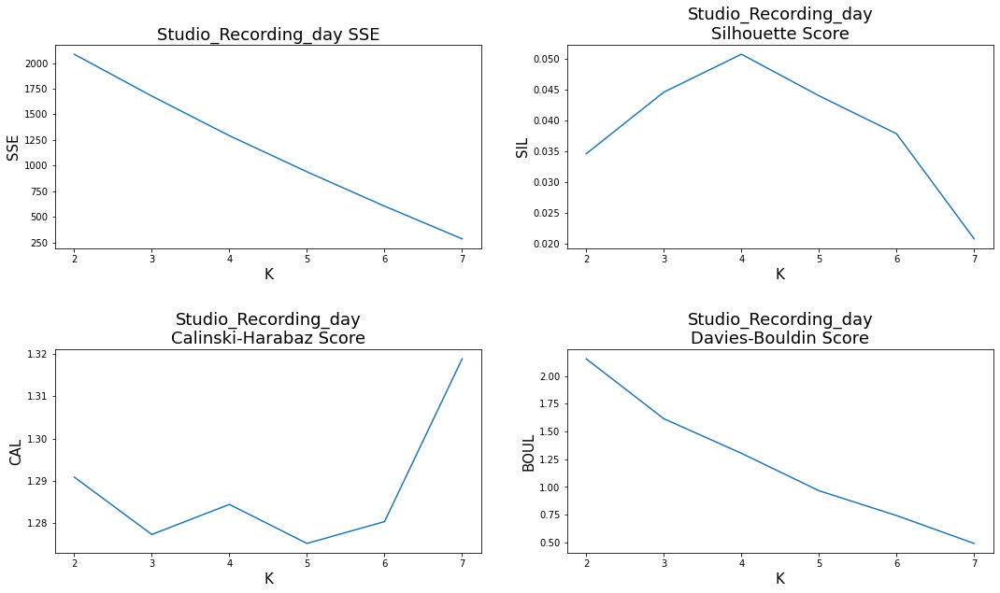

In [370]:
find_optimal_k_kmeans(7, "", df_tss_studio_scaled, True, album_type)

In [371]:
cluster_centers_studio_2, dict_label_studio_2, labels_studio_2 = run_kmeans(4, 300, 10, '', df_tss_studio_scaled,\
                                                                      True)

cluster_centers_shape (4, 366)

Labels:  {0: 2, 1: 2, 2: 2, 3: 2}

SSE:  1291.1736035326778
Silhouette Score:  0.050792515251680145
Calinski - Harabaz Score:  1.2843484664526226
Davies - Bouldin Score:  1.3035676687249738


In [372]:
cluster_insight(df_tss_studio_scaled, labels_studio_2)

,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497,3
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272,2
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314,1
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518,0
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255,0
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369,1
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587,3
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778,2


Cluster 0
 ['2012_studio', '2013_studio']

Cluster 1
 ['2011_studio', '2014_studio']

Cluster 2
 ['2010_studio', '2016_studio']

Cluster 3
 ['2009_studio', '2015_studio']



<h2>Feature based Clustering</h2>

<h3>KMeans</h3>

In [373]:
F = [list(calculate_features(x).values())for x in tss_studio_scaled]

<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead

k:  2 SSE:  94.0985226031484 Silhouette Score:  0.7278608726442664
Calinski-Harabaz:  38.06897047151652 Davies-Bouldin:  0.36989164893848975

k:  3 SSE:  47.17546236109316 Silhouette Score:  0.7166935961609876
Calinski-Harabaz:  34.125899765703466 Davies-Bouldin:  0.29679195398636127

k:  4 SSE:  3.4993137198608184 Silhouette Score:  0.7285397978271415
Calinski-Harabaz:  262.00877987879124 Davies-Bouldin:  0.16136926583596653

k:  5 SSE:  1.4696200172805067 Silhouette Score:  0.6439957071543454
Calinski-Harabaz:  351.9623478561714 Davies-Bouldin:  0.1137221706183058

k:  6 SSE:  0.03176308992505185 Silhouette Score:  0.47041223748579397
Calinski-Harabaz:  8703.255771098471 Davies-Bouldin:  0.02465228280803863

k:  7 SSE:  0.01363032324014006 Silhouette Score:  0.22629392516936025
Calinski-Harabaz:  8450.812939107976 Davies-Bouldin:  0.019620477274244687



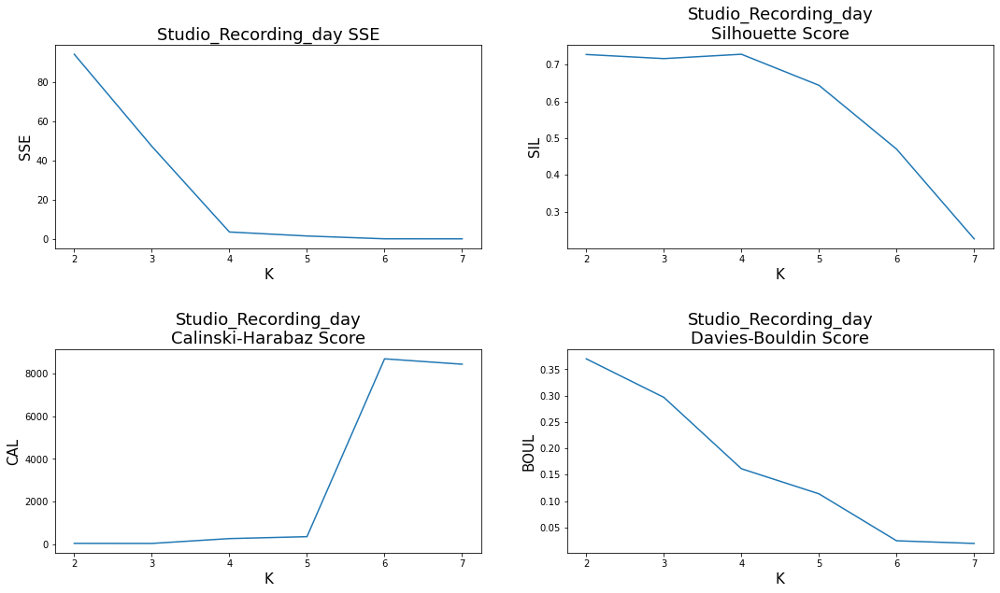

In [374]:
find_optimal_k_kmeans(7, "", F, True, album_type)

In [375]:
cluster_centers_studio_fb, dict_label_studio_fb, labels_studio_fb = run_kmeans(4, 300, 10, "", F, True)

cluster_centers_shape (4, 5)

Labels:  {0: 2, 1: 3, 2: 1, 3: 2}

SSE:  3.4993137198608184
Silhouette Score:  0.7285397978271415
Calinski - Harabaz Score:  262.00877987879124
Davies - Bouldin Score:  0.16136926583596653


<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead

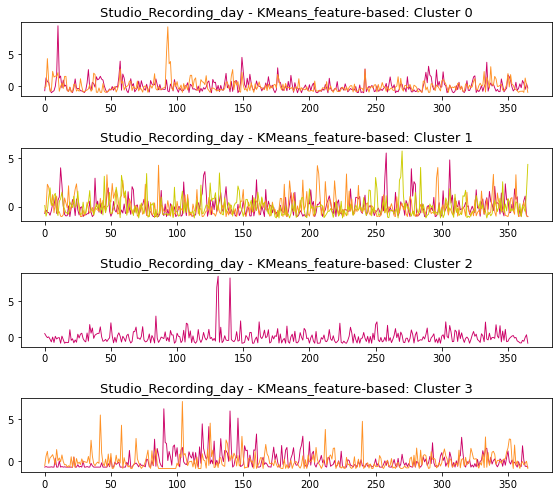

In [376]:
analyze_clusters_fb(labels_studio_fb, tss_studio_scaled, album_type, 'KMeans_feature-based', False)

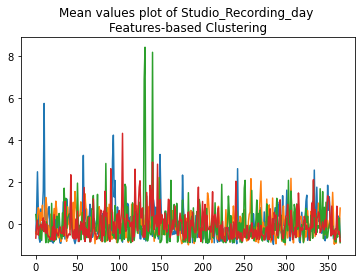

In [377]:
plot_mean_values(labels_studio_fb, tss_studio_scaled, album_type)

<h2>Compression-based Clustering</h2>

<h3>DBSCAN</h3>

In [378]:
M = pairwise_distances(tss_studio_scaled.reshape(tss_studio_scaled.shape[0], tss_studio_scaled.shape[1]), \
                       metric=cdm_dist)

In [379]:
print(tss_studio_scaled.shape, M.shape)

(8, 366, 1) (8, 8)


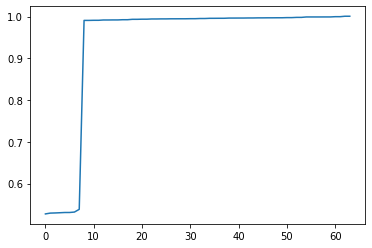

In [380]:
plt.plot(sorted(M.ravel()))
plt.show()

In [381]:
dbscan_compression_studio = DBSCAN(eps=0.99, min_samples=5, metric='precomputed')
dbscan_compression_studio.fit(M)

DBSCAN(eps=0.99, metric='precomputed')

In [382]:
dbscan_compression_studio.labels_

array([-1, -1, -1, -1, -1, -1, -1, -1])

<h2>Approximation-based Clustering</h2>

<h3>PiecewiseAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [383]:
n_paa_segments = 183
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(tss_studio_scaled)

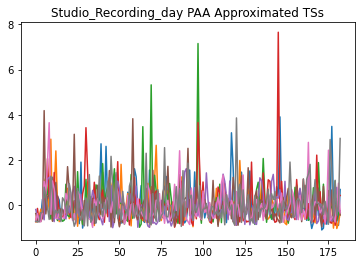

In [384]:
plt.plot(X_paa.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.title(album_type + " PAA Approximated TSs")
plt.show()

<h3>Euclidean</h3>

k:  2 SSE:  78.87915122569315 Silhouette Score:  0.05689999663393615

k:  3 SSE:  63.18373811435144 Silhouette Score:  0.04839211699049222

k:  4 SSE:  48.45357972798562 Silhouette Score:  0.040400896756929816

k:  5 SSE:  35.66522314751919 Silhouette Score:  0.02886569750394287

k:  6 SSE:  23.216229395156027 Silhouette Score:  0.02062134612784415

k:  7 SSE:  11.537149236381056 Silhouette Score:  0.004754117450493547



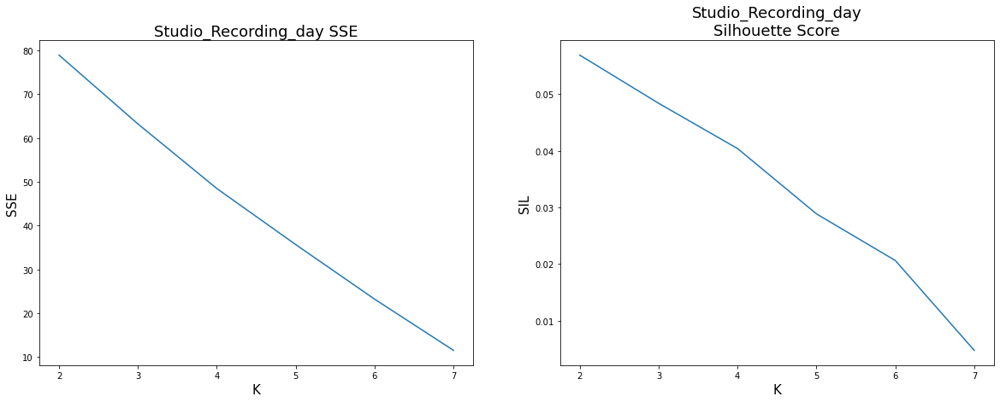

In [385]:
find_optimal_k_kmeans(7, 'euclidean', X_paa, False, album_type)

In [386]:
cluster_centers_studio_paa, dict_label_studio_paa, labels_studio_paa = run_kmeans(3, 300, 10, 'euclidean', X_paa,\
                                                                      False)

cluster_centers_shape (3, 183, 1)

Labels:  {0: 5, 1: 2, 2: 1}

SSE:  63.18373811435144
Silhouette Score:  0.04839211699049222


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.700064,-0.732497,-0.716280,-0.732497,-0.197347,-0.375730,-0.700064,-0.716280,-0.732497,-0.732497,...,-0.051397,0.548620,-0.132480,-0.181130,-0.602764,-0.327080,0.564836,-0.278430,-0.683847,0
2010_studio,-0.515517,-0.596607,-0.645260,0.198071,0.149417,0.830570,3.133514,-0.369556,-0.937183,-0.466863,...,1.527940,0.052110,-0.174941,0.733262,0.895442,-0.629042,-0.580389,0.863006,-0.969619,0
2011_studio,-0.333997,2.156354,0.548411,0.313102,0.724892,-0.569306,-1.000705,0.038575,0.136621,0.842547,...,-0.922269,-0.765396,0.881765,-0.608524,1.548473,-0.981096,-0.314388,0.117011,-0.981096,2
2012_studio,0.298327,0.643531,-0.771803,-0.771803,0.816133,5.321037,0.660791,0.470929,-0.253998,-0.495640,...,-0.426600,1.610100,0.350108,-0.599201,-0.029616,0.022165,0.315588,-0.029616,0.056685,1
2013_studio,-0.107554,2.511197,-0.734383,1.856509,1.550059,0.658570,0.226754,0.588922,0.449627,-0.469722,...,-0.037907,0.923231,1.048597,-0.121484,-0.609017,-0.873678,-0.776171,0.157107,-0.372215,1
2014_studio,-0.002041,0.424836,0.442623,0.478196,0.460410,0.193611,0.300330,-0.268840,-0.571211,-0.642357,...,0.656062,2.061200,1.420884,0.495983,-0.251053,-0.677930,-0.179907,-0.375559,-0.464492,0
2015_studio,0.304585,-0.042034,-0.495305,-0.388653,-0.095360,-0.108692,-0.375322,-0.628620,-0.761935,0.117944,...,0.197933,-0.415316,0.037955,0.024623,-0.308664,-0.735272,-0.655283,-0.335327,-0.282001,0
2016_studio,-0.425313,0.249307,1.143569,0.625838,0.484639,-0.189981,1.159258,-0.095848,-0.629268,-0.142914,...,-0.080159,0.688594,-0.346869,-0.346869,0.421884,-0.252736,-0.441002,-0.346869,2.947784,0



Cluster 0
 ['2009_studio', '2010_studio', '2014_studio', '2015_studio', '2016_studio']

Cluster 1
 ['2012_studio', '2013_studio']

Cluster 2
 ['2011_studio']




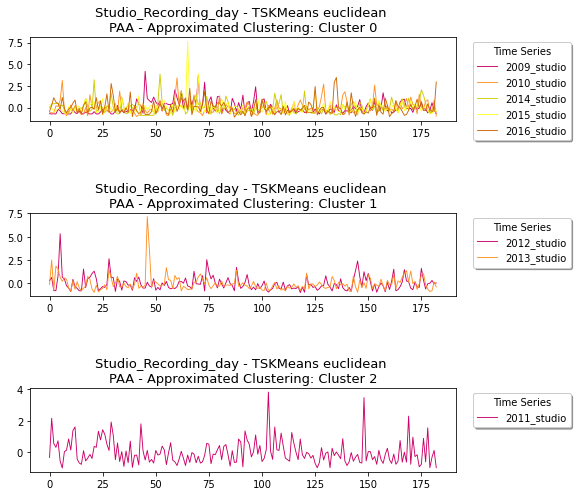

In [387]:
analyze_approximated_clusters(labels_studio_paa, X_paa, df_tss_studio_scaled, album_type, \
                               'TSKMeans euclidean \nPAA - Approximated Clustering', False)

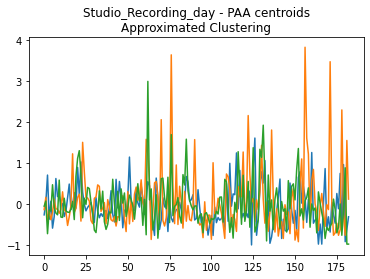

In [388]:
plot_centroids_approximated(cluster_centers_studio_paa, X_paa, album_type, 'PAA')

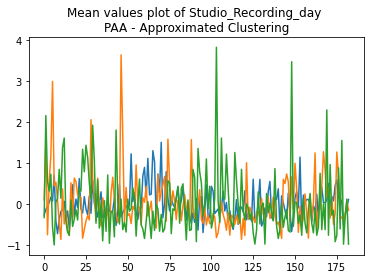

In [389]:
plot_mean_values_approximated(labels_studio_paa, X_paa, album_type, 'PAA')

<h3>DTW</h3>

k:  2 SSE:  24.776484287274556 Silhouette Score:  0.06446274257037919

k:  3 SSE:  19.317162978233306 Silhouette Score:  0.03282266164235972

k:  4 SSE:  13.162960772585862 Silhouette Score:  0.04571333584286663

k:  5 SSE:  9.316992434379813 Silhouette Score:  0.0422855820926364

k:  6 SSE:  6.063036193302622 Silhouette Score:  0.03011078470645291

k:  7 SSE:  3.035226376681178 Silhouette Score:  0.010338236980588868



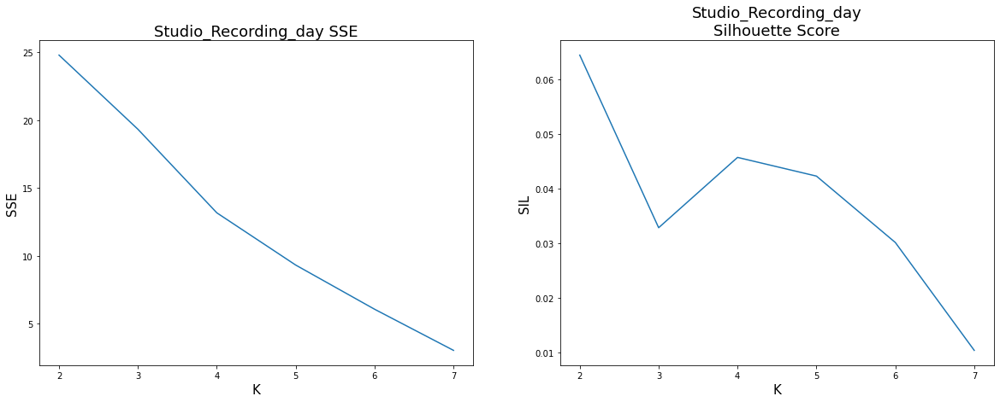

In [390]:
find_optimal_k_kmeans(7, 'dtw', X_paa, False, album_type)

In [391]:
cluster_centers_studio_paa_dtw, dict_label_studio_paa_dtw, \
labels_studio_paa_dtw = run_kmeans(4, 300, 10, 'dtw', X_paa, False)

cluster_centers_shape (4, 183, 1)

Labels:  {0: 2, 1: 2, 2: 2, 3: 2}

SSE:  13.162960772585862
Silhouette Score:  0.04571333584286663


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.700064,-0.732497,-0.716280,-0.732497,-0.197347,-0.375730,-0.700064,-0.716280,-0.732497,-0.732497,...,-0.051397,0.548620,-0.132480,-0.181130,-0.602764,-0.327080,0.564836,-0.278430,-0.683847,2
2010_studio,-0.515517,-0.596607,-0.645260,0.198071,0.149417,0.830570,3.133514,-0.369556,-0.937183,-0.466863,...,1.527940,0.052110,-0.174941,0.733262,0.895442,-0.629042,-0.580389,0.863006,-0.969619,1
2011_studio,-0.333997,2.156354,0.548411,0.313102,0.724892,-0.569306,-1.000705,0.038575,0.136621,0.842547,...,-0.922269,-0.765396,0.881765,-0.608524,1.548473,-0.981096,-0.314388,0.117011,-0.981096,0
2012_studio,0.298327,0.643531,-0.771803,-0.771803,0.816133,5.321037,0.660791,0.470929,-0.253998,-0.495640,...,-0.426600,1.610100,0.350108,-0.599201,-0.029616,0.022165,0.315588,-0.029616,0.056685,1
2013_studio,-0.107554,2.511197,-0.734383,1.856509,1.550059,0.658570,0.226754,0.588922,0.449627,-0.469722,...,-0.037907,0.923231,1.048597,-0.121484,-0.609017,-0.873678,-0.776171,0.157107,-0.372215,3
2014_studio,-0.002041,0.424836,0.442623,0.478196,0.460410,0.193611,0.300330,-0.268840,-0.571211,-0.642357,...,0.656062,2.061200,1.420884,0.495983,-0.251053,-0.677930,-0.179907,-0.375559,-0.464492,2
2015_studio,0.304585,-0.042034,-0.495305,-0.388653,-0.095360,-0.108692,-0.375322,-0.628620,-0.761935,0.117944,...,0.197933,-0.415316,0.037955,0.024623,-0.308664,-0.735272,-0.655283,-0.335327,-0.282001,3
2016_studio,-0.425313,0.249307,1.143569,0.625838,0.484639,-0.189981,1.159258,-0.095848,-0.629268,-0.142914,...,-0.080159,0.688594,-0.346869,-0.346869,0.421884,-0.252736,-0.441002,-0.346869,2.947784,0



Cluster 0
 ['2011_studio', '2016_studio']

Cluster 1
 ['2010_studio', '2012_studio']

Cluster 2
 ['2009_studio', '2014_studio']

Cluster 3
 ['2013_studio', '2015_studio']




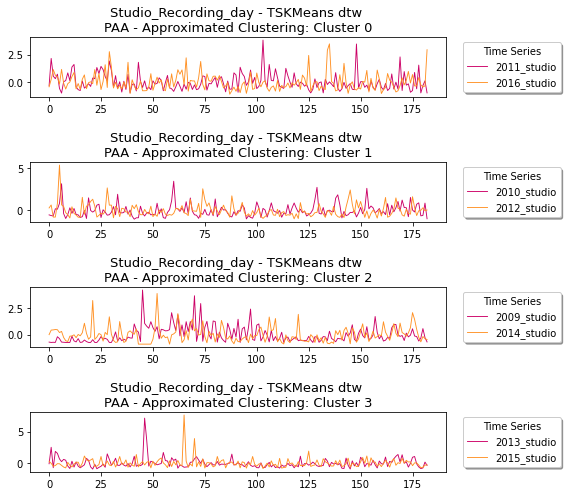

In [392]:
analyze_approximated_clusters(labels_studio_paa_dtw, X_paa, df_tss_studio_scaled, album_type, \
                               'TSKMeans dtw \nPAA - Approximated Clustering', False)

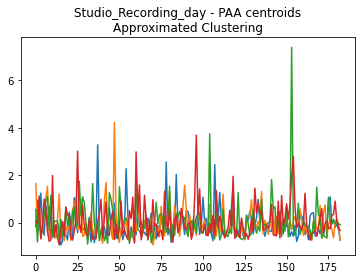

In [393]:
plot_centroids_approximated(cluster_centers_studio_paa_dtw, X_paa, album_type, 'PAA')

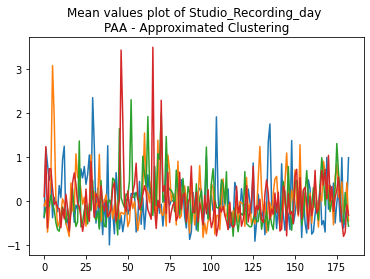

In [394]:
plot_mean_values_approximated(labels_studio_paa_dtw, X_paa, album_type, 'PAA')

<h3>OneD_SymbolicAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [395]:
n_sax1d_segments = 183
n_sax_symbols_avg = 50
#n_sax_symbols_slope = 4

one_d_sax = OneD_SymbolicAggregateApproximation(n_segments=n_sax1d_segments,\
     alphabet_size_avg=n_sax_symbols_avg)

X_sax1d = one_d_sax.fit_transform(tss_studio_scaled)
X_sax1d.shape

(8, 183, 2)

<h3>Euclidean</h3>

k:  2 SSE:  14872.699999999993 Silhouette Score:  0.050966838853215374

k:  3 SSE:  11730.04166666667 Silhouette Score:  0.04657908232154784

k:  4 SSE:  8901.125 Silhouette Score:  0.04383840556684031

k:  5 SSE:  6074.5625 Silhouette Score:  0.05405094692416774

k:  6 SSE:  3618.875 Silhouette Score:  0.05206025352844186

k:  7 SSE:  1764.1875 Silhouette Score:  0.0274434207328213



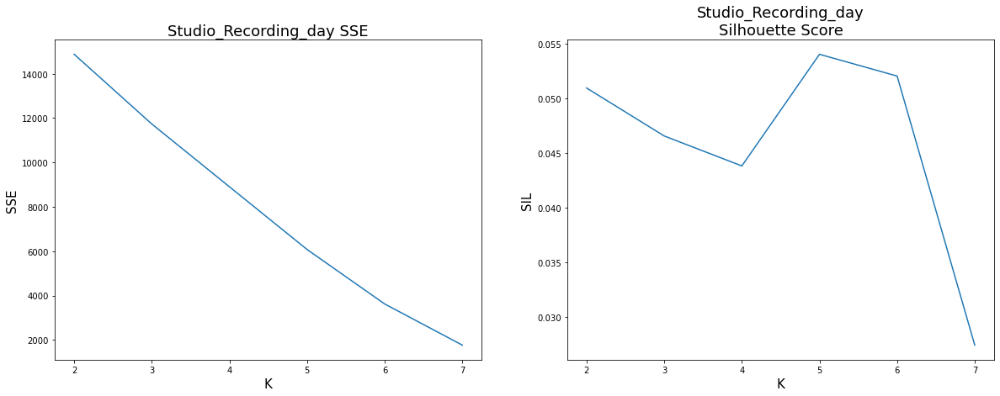

In [396]:
find_optimal_k_kmeans(7, 'euclidean', X_sax1d, False, album_type)

In [397]:
cluster_centers_studio_sax1d, dict_label_studio_sax1d, \
labels_studio_sax1d = run_kmeans(5, 1000, 10, 'euclidean', X_sax1d, False)

cluster_centers_shape (5, 183, 2)

Labels:  {0: 1, 1: 2, 2: 1, 3: 2, 4: 2}

SSE:  6074.5625
Silhouette Score:  0.05405094692416774


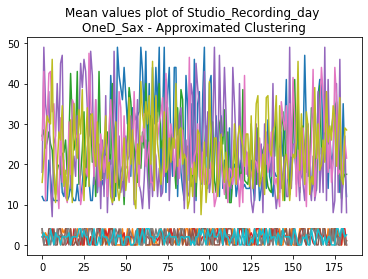

In [398]:
plot_mean_values_approximated(labels_studio_sax1d, X_sax1d, album_type, 'OneD_Sax')

<h3>DTW</h3>

k:  2 SSE:  4953.957022717621 Silhouette Score:  0.04541527415188008

k:  3 SSE:  3748.2324339199245 Silhouette Score:  0.043102206687718574

k:  4 SSE:  3055.3899381868127 Silhouette Score:  0.029087625138589063

k:  5 SSE:  2055.573214285714 Silhouette Score:  0.03605298670548643

k:  6 SSE:  1187.3261904761903 Silhouette Score:  0.042821515033992084

k:  7 SSE:  570.4053571428572 Silhouette Score:  0.0292667442192455



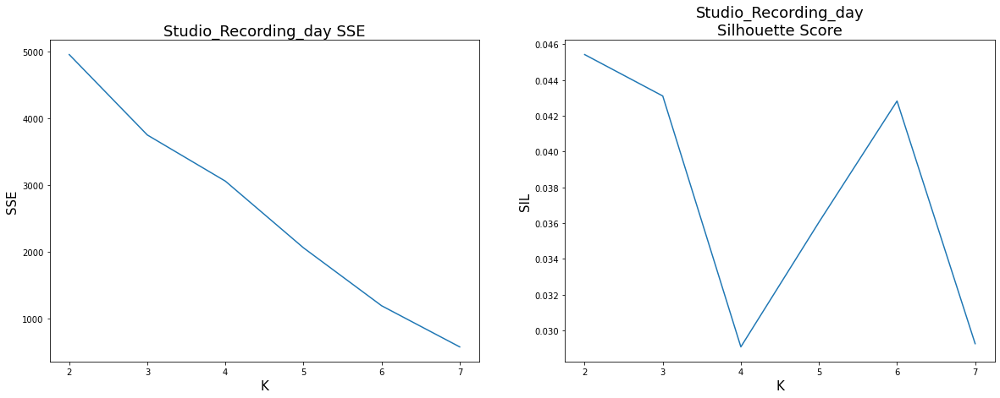

In [399]:
find_optimal_k_kmeans(7, 'dtw', X_sax1d, False, album_type)

In [400]:
cluster_centers_studio_sax1d_dtw, dict_label_studio_sax1d_dtw, \
labels_studio_sax1d_dtw = run_kmeans(3, 300, 10, 'dtw', X_sax1d, False)

cluster_centers_shape (3, 183, 2)

Labels:  {0: 2, 1: 4, 2: 2}

SSE:  3748.2324339199245
Silhouette Score:  0.043102206687718574


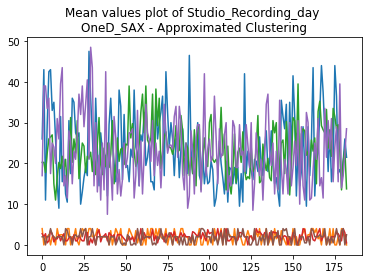

In [401]:
plot_mean_values_approximated(labels_studio_sax1d_dtw, X_sax1d, album_type, 'OneD_SAX')

<h3>SymbolicAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [402]:
n_sax_segments = 183
n_sax_symbols = 50

sax = SymbolicAggregateApproximation(n_segments=n_sax_segments, \
                                     alphabet_size_avg=n_sax_symbols)

X_sax = sax.fit_transform(tss_studio_scaled)

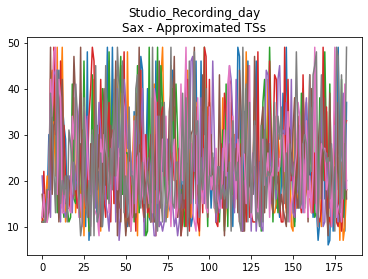

In [404]:
plt.plot(X_sax.reshape(X_sax.shape[1], X_sax.shape[0]))
plt.title(album_type + "\nSax - Approximated TSs")
plt.show()

<h3>Euclidean</h3>

k:  2 SSE:  14387.183333333342 Silhouette Score:  0.05262359343648364

k:  3 SSE:  11321.000000000002 Silhouette Score:  0.048316707162627315

k:  4 SSE:  8597.29166666667 Silhouette Score:  0.04438045973028304

k:  5 SSE:  5836.125 Silhouette Score:  0.055908595531572236

k:  6 SSE:  3458.875 Silhouette Score:  0.0542233070743556

k:  7 SSE:  1693.375 Silhouette Score:  0.027863587832749764



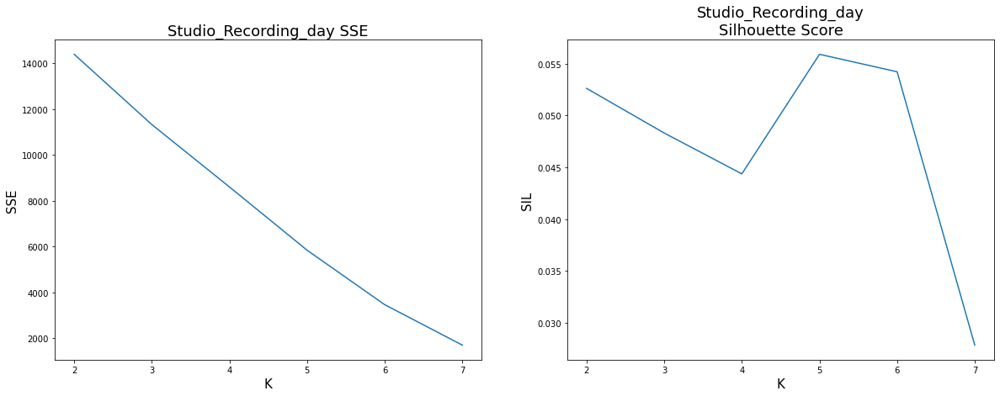

In [405]:
find_optimal_k_kmeans(7, 'euclidean', X_sax, False, album_type)

In [406]:
cluster_centers_studio_sax, dict_label_studio_sax, \
labels_studio_sax = run_kmeans(5, 1000, 10, 'euclidean', X_sax, False)

cluster_centers_shape (5, 183, 1)

Labels:  {0: 1, 1: 2, 2: 1, 3: 2, 4: 2}

SSE:  5836.125
Silhouette Score:  0.055908595531572236


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,12,11,11,11,21,17,12,11,11,11,...,23,35,22,21,13,18,35,19,12,0
2010_studio,15,13,12,28,27,39,49,17,8,16,...,46,26,21,38,40,13,14,40,8,4
2011_studio,18,49,35,31,38,14,7,25,27,40,...,8,11,40,13,46,8,18,27,8,2
2012_studio,30,37,11,11,39,49,37,34,19,15,...,16,47,31,13,24,25,31,24,26,3
2013_studio,22,49,11,48,46,37,29,36,33,15,...,24,41,42,22,13,9,10,28,17,3
2014_studio,24,33,33,34,33,28,30,19,14,13,...,37,49,46,34,20,12,21,17,16,1
2015_studio,30,24,15,17,23,22,17,13,11,27,...,28,16,25,25,18,11,12,18,19,1
2016_studio,16,29,43,36,34,21,43,23,13,22,...,23,37,18,18,33,20,16,18,49,4



Cluster 0
 ['2009_studio']

Cluster 1
 ['2014_studio', '2015_studio']

Cluster 2
 ['2011_studio']

Cluster 3
 ['2012_studio', '2013_studio']

Cluster 4
 ['2010_studio', '2016_studio']




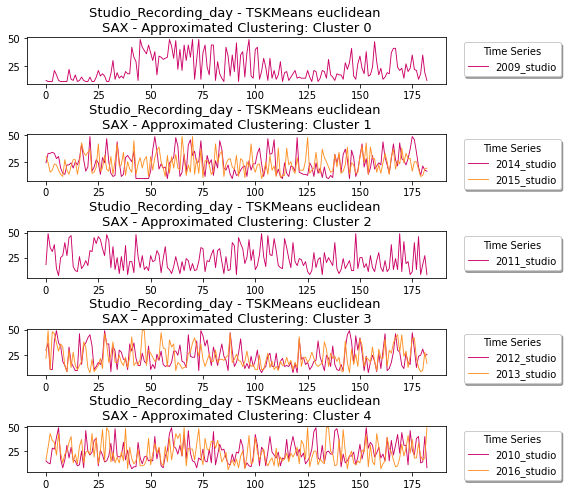

In [409]:
analyze_approximated_clusters(labels_studio_sax, X_sax, df_tss_studio_scaled, \
                              album_type, \
                              'TSKMeans euclidean \nSAX - Approximated Clustering', False)

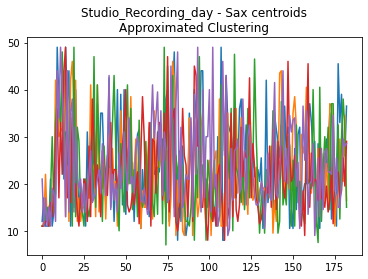

In [410]:
plot_centroids_approximated(cluster_centers_studio_sax, X_sax, album_type, 'Sax')

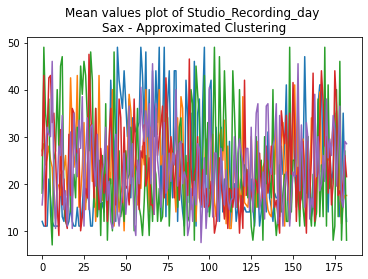

In [411]:
plot_mean_values_approximated(labels_studio_sax, X_sax, album_type, 'Sax')

<h3>DTW</h3>

k:  2 SSE:  4201.368581479795 Silhouette Score:  0.05065397119096703

k:  3 SSE:  3216.8432272588525 Silhouette Score:  0.04965914221755492

k:  4 SSE:  2514.2154897186147 Silhouette Score:  0.030247875380947503

k:  5 SSE:  1667.465192099567 Silhouette Score:  0.04249374832669359

k:  6 SSE:  1001.3302083333334 Silhouette Score:  0.05379457759740536

k:  7 SSE:  482.5589285714285 Silhouette Score:  0.0338495612669953



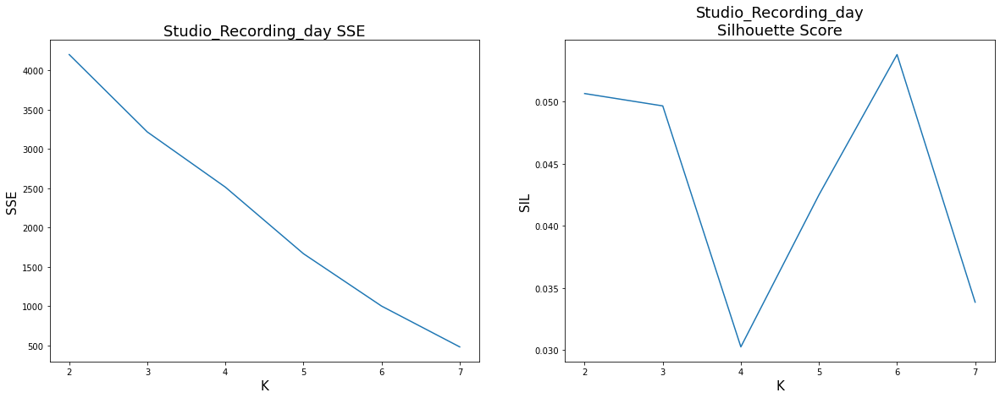

In [412]:
find_optimal_k_kmeans(7, 'dtw', X_sax, False, album_type)

In [413]:
cluster_centers_studio_sax_dtw, dict_label_studio_sax_dtw, \
labels_studio_sax_dtw = run_kmeans(6, 300, 10, 'dtw', X_sax, False)

cluster_centers_shape (6, 183, 1)

Labels:  {0: 2, 1: 2, 2: 1, 3: 1, 4: 1, 5: 1}

SSE:  1001.3302083333334
Silhouette Score:  0.05379457759740536


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,12,11,11,11,21,17,12,11,11,11,...,23,35,22,21,13,18,35,19,12,2
2010_studio,15,13,12,28,27,39,49,17,8,16,...,46,26,21,38,40,13,14,40,8,4
2011_studio,18,49,35,31,38,14,7,25,27,40,...,8,11,40,13,46,8,18,27,8,3
2012_studio,30,37,11,11,39,49,37,34,19,15,...,16,47,31,13,24,25,31,24,26,0
2013_studio,22,49,11,48,46,37,29,36,33,15,...,24,41,42,22,13,9,10,28,17,0
2014_studio,24,33,33,34,33,28,30,19,14,13,...,37,49,46,34,20,12,21,17,16,1
2015_studio,30,24,15,17,23,22,17,13,11,27,...,28,16,25,25,18,11,12,18,19,1
2016_studio,16,29,43,36,34,21,43,23,13,22,...,23,37,18,18,33,20,16,18,49,5



Cluster 0
 ['2012_studio', '2013_studio']

Cluster 1
 ['2014_studio', '2015_studio']

Cluster 2
 ['2009_studio']

Cluster 3
 ['2011_studio']

Cluster 4
 ['2010_studio']

Cluster 5
 ['2016_studio']




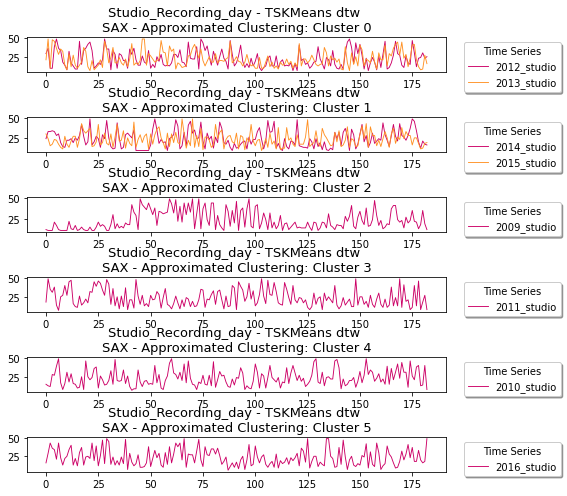

In [416]:
analyze_approximated_clusters(labels_studio_sax_dtw, X_sax, df_tss_studio_scaled, album_type, \
                               'TSKMeans dtw \nSAX - Approximated Clustering', False)

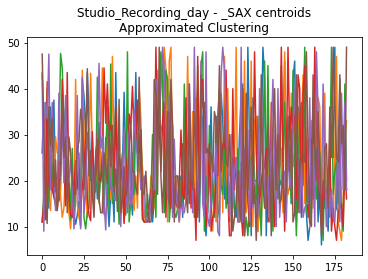

In [417]:
plot_centroids_approximated(cluster_centers_studio_sax_dtw, X_sax, album_type, '_SAX')

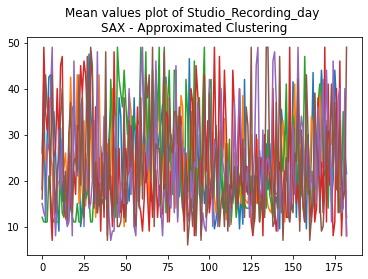

In [418]:
plot_mean_values_approximated(labels_studio_sax_dtw, X_sax, album_type, 'SAX')

**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

<h1>Live_Recording</h1>

In [419]:
album_type = "Live_Recording_day"

<h2>Shape based clustering</h2>

<h3>TimeSeriesKMeans</h3>

In [420]:
df_live

,1,2,3,4,5,6,7,8,9,10,...,357,358,359,360,361,362,363,364,365,366
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,0,128,0,0,1,11,0,0,0,0,...,0,0,0,0,1,9,0,0,0,0
2010_live,0,0,2,0,1,0,1,19,2,0,...,0,0,0,1,0,1,0,0,0,0
2011_live,4,1,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2012_live,0,0,0,8,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,0,0
2013_live,0,0,17,0,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,0,0
2014_live,0,21,0,0,0,0,0,0,7,7,...,0,0,0,0,0,0,0,0,0,0
2015_live,0,0,0,0,1,0,0,5,13,0,...,0,0,0,0,0,0,7,13,8,0
2016_live,0,0,0,0,3,1,18,1,0,0,...,3,22,0,0,0,0,2,0,0,0


In [421]:
df_live.shape

(8, 366)

In [422]:
tss_live = to_time_series_dataset(df_live.values)
tss_live

array([[[  0.],
        [128.],
        [  0.],
        ...,
        [  0.],
        [  0.],
        [  0.]],

       [[  0.],
        [  0.],
        [  2.],
        ...,
        [  0.],
        [  0.],
        [  0.]],

       [[  4.],
        [  1.],
        [  0.],
        ...,
        [  0.],
        [  0.],
        [  0.]],

       ...,

       [[  0.],
        [ 21.],
        [  0.],
        ...,
        [  0.],
        [  0.],
        [  0.]],

       [[  0.],
        [  0.],
        [  0.],
        ...,
        [ 13.],
        [  8.],
        [  0.]],

       [[  0.],
        [  0.],
        [  0.],
        ...,
        [  0.],
        [  0.],
        [  0.]]])

In [423]:
tss_live.shape

(8, 366, 1)

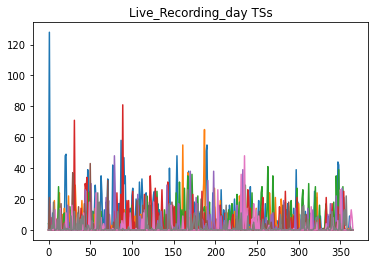

In [424]:
plt.plot(np.squeeze(tss_live).T)
plt.title(album_type + " TSs")
plt.show()

In [425]:
tss_live_scaled = TimeSeriesScalerMeanVariance().fit_transform(tss_live)
tss_live_scaled

array([[[-0.55366905],
        [ 9.48825419],
        [-0.55366905],
        ...,
        [-0.55366905],
        [-0.55366905],
        [-0.55366905]],

       [[-0.47338066],
        [-0.47338066],
        [-0.20350944],
        ...,
        [-0.47338066],
        [-0.47338066],
        [-0.47338066]],

       [[-0.08665189],
        [-0.44979605],
        [-0.57084411],
        ...,
        [-0.57084411],
        [-0.57084411],
        [-0.57084411]],

       ...,

       [[-0.27827153],
        [ 4.0425264 ],
        [-0.27827153],
        ...,
        [-0.27827153],
        [-0.27827153],
        [-0.27827153]],

       [[-0.31186708],
        [-0.31186708],
        [-0.31186708],
        ...,
        [ 2.24211496],
        [ 1.25981418],
        [-0.31186708]],

       [[-0.41196818],
        [-0.41196818],
        [-0.41196818],
        ...,
        [-0.41196818],
        [-0.41196818],
        [-0.41196818]]])

In [426]:
tss_live_scaled.shape

(8, 366, 1)

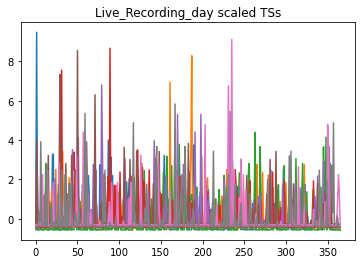

In [427]:
plt.plot(np.squeeze(tss_live_scaled).T)
plt.title(album_type + " scaled TSs")
plt.show()

**I convert scaled time series dataset to normal dataset**

In [428]:
df_tss_live_scaled = pd.DataFrame(np.squeeze(tss_live_scaled), columns = df_live.columns, \
                                    index = df_live.index)
df_tss_live_scaled

,1,2,3,4,5,6,7,8,9,10,...,357,358,359,360,361,362,363,364,365,366
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669
2010_live,-0.473381,-0.473381,-0.203509,-0.473381,-0.338445,-0.473381,-0.338445,2.090396,-0.203509,-0.473381,...,-0.473381,-0.473381,-0.473381,-0.338445,-0.473381,-0.338445,-0.473381,-0.473381,-0.473381,-0.473381
2011_live,-0.086652,-0.449796,-0.570844,-0.570844,-0.570844,-0.570844,-0.449796,-0.449796,-0.570844,-0.570844,...,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844
2012_live,-0.436938,-0.436938,-0.436938,0.463382,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,0.238302,...,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938
2013_live,-0.372436,-0.372436,2.168458,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,0.524350,...,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436
2014_live,-0.278272,4.042526,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,1.161994,1.161994,...,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272
2015_live,-0.311867,-0.311867,-0.311867,-0.311867,-0.115407,-0.311867,-0.311867,0.670434,2.242115,-0.311867,...,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,1.063354,2.242115,1.259814,-0.311867
2016_live,-0.411968,-0.411968,-0.411968,-0.411968,0.309469,-0.171489,3.916654,-0.171489,-0.411968,-0.411968,...,0.309469,4.878571,-0.411968,-0.411968,-0.411968,-0.411968,0.068990,-0.411968,-0.411968,-0.411968


<h3>Euclidean Distance</h3>

k:  2 SSE:  263.2451263183511 Silhouette Score:  0.04260488521807982

k:  3 SSE:  208.75864328979196 Silhouette Score:  0.04626989517237051

k:  4 SSE:  162.16174707761013 Silhouette Score:  0.04304531389161

k:  5 SSE:  117.60681582142252 Silhouette Score:  0.03240542186042715

k:  6 SSE:  77.38898384259747 Silhouette Score:  0.023028634160668103

k:  7 SSE:  38.04916068071605 Silhouette Score:  0.01630889757948253



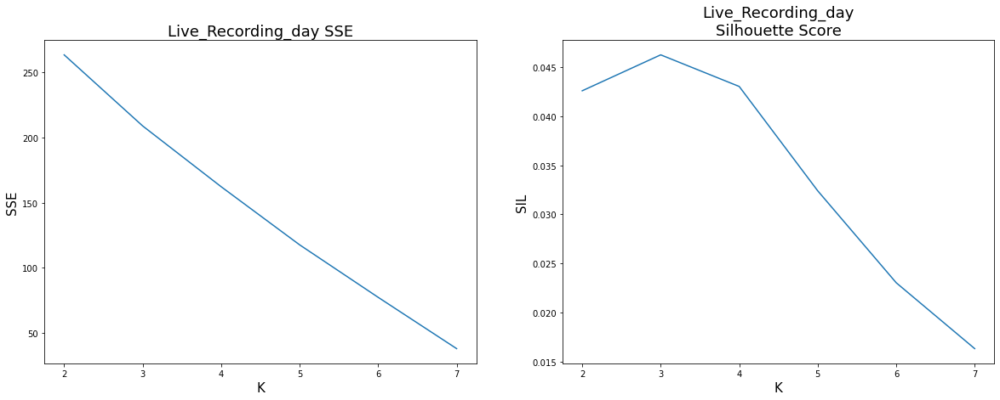

In [429]:
find_optimal_k_kmeans(7, 'euclidean', tss_live_scaled, False, album_type)

**We can see that best k is 3**

In [430]:
cluster_centers_live_eu, dict_label_live_eu, labels_live_eu = run_kmeans(3, 300, 10, 'euclidean', tss_live_scaled,\
                                                                      False)

cluster_centers_shape (3, 366, 1)

Labels:  {0: 3, 1: 3, 2: 2}

SSE:  208.75864328979196
Silhouette Score:  0.04626989517237051


In [431]:
cluster_insight(df_tss_live_scaled, labels_live_eu)

,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669,0
2010_live,-0.473381,-0.473381,-0.203509,-0.473381,-0.338445,-0.473381,-0.338445,2.090396,-0.203509,-0.473381,...,-0.473381,-0.473381,-0.338445,-0.473381,-0.338445,-0.473381,-0.473381,-0.473381,-0.473381,2
2011_live,-0.086652,-0.449796,-0.570844,-0.570844,-0.570844,-0.570844,-0.449796,-0.449796,-0.570844,-0.570844,...,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,1
2012_live,-0.436938,-0.436938,-0.436938,0.463382,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,0.238302,...,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,1
2013_live,-0.372436,-0.372436,2.168458,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,0.524350,...,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,1
2014_live,-0.278272,4.042526,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,1.161994,1.161994,...,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,0
2015_live,-0.311867,-0.311867,-0.311867,-0.311867,-0.115407,-0.311867,-0.311867,0.670434,2.242115,-0.311867,...,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,1.063354,2.242115,1.259814,-0.311867,0
2016_live,-0.411968,-0.411968,-0.411968,-0.411968,0.309469,-0.171489,3.916654,-0.171489,-0.411968,-0.411968,...,4.878571,-0.411968,-0.411968,-0.411968,-0.411968,0.068990,-0.411968,-0.411968,-0.411968,2


Cluster 0
 ['2009_live', '2014_live', '2015_live']

Cluster 1
 ['2011_live', '2012_live', '2013_live']

Cluster 2
 ['2010_live', '2016_live']



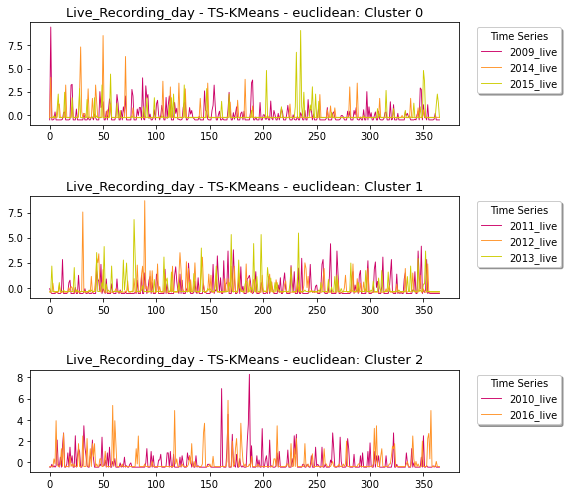

In [432]:
analyze_clusters(labels_live_eu, tss_live_scaled, df_tss_live_scaled, album_type, 'TS-KMeans - euclidean', False)

**Centroids**

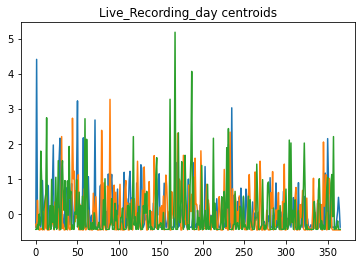

In [433]:
plot_kmeans_centroids(cluster_centers_live_eu, album_type)

<h3>DTW distance</h3>

k:  2 SSE:  60.91042224181045 Silhouette Score:  0.12071219797915594

k:  3 SSE:  46.53874806791133 Silhouette Score:  0.10791300333814832

k:  4 SSE:  35.03292916048967 Silhouette Score:  0.08880803458429862

k:  5 SSE:  22.965676081264498 Silhouette Score:  0.061463610707945746

k:  6 SSE:  13.02092078531562 Silhouette Score:  0.03338203760287489

k:  7 SSE:  6.319522632005009 Silhouette Score:  0.006470756960037709



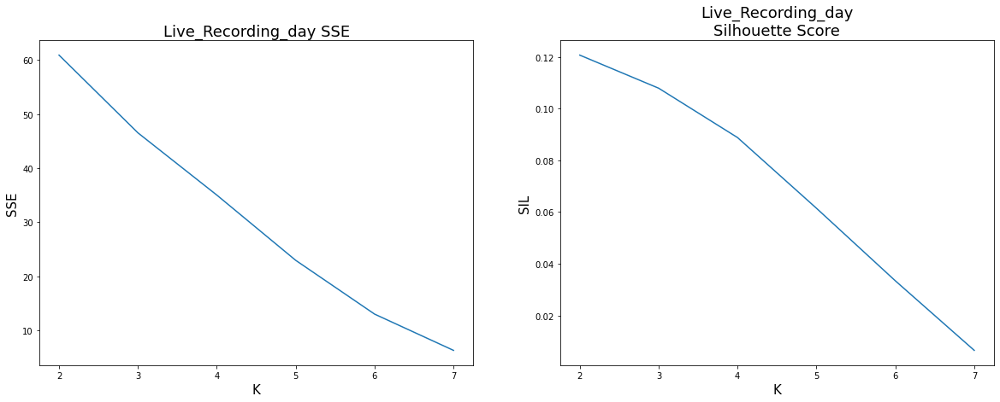

In [434]:
find_optimal_k_kmeans(7, 'dtw', tss_live_scaled, False, album_type)

**We can see that best k is 3**

In [435]:
cluster_centers_live_dtw, dict_label_live_dtw, labels_live_dtw = run_kmeans(3, 300, 10, 'dtw', tss_live_scaled,\
                                                                      False)

cluster_centers_shape (3, 366, 1)

Labels:  {0: 5, 1: 1, 2: 2}

SSE:  46.53874806791133
Silhouette Score:  0.10791300333814832


In [436]:
cluster_insight(df_tss_live_scaled, labels_live_dtw)

,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669,2
2010_live,-0.473381,-0.473381,-0.203509,-0.473381,-0.338445,-0.473381,-0.338445,2.090396,-0.203509,-0.473381,...,-0.473381,-0.473381,-0.338445,-0.473381,-0.338445,-0.473381,-0.473381,-0.473381,-0.473381,0
2011_live,-0.086652,-0.449796,-0.570844,-0.570844,-0.570844,-0.570844,-0.449796,-0.449796,-0.570844,-0.570844,...,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,1
2012_live,-0.436938,-0.436938,-0.436938,0.463382,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,0.238302,...,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,2
2013_live,-0.372436,-0.372436,2.168458,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,0.524350,...,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,0
2014_live,-0.278272,4.042526,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,1.161994,1.161994,...,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,0
2015_live,-0.311867,-0.311867,-0.311867,-0.311867,-0.115407,-0.311867,-0.311867,0.670434,2.242115,-0.311867,...,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,1.063354,2.242115,1.259814,-0.311867,0
2016_live,-0.411968,-0.411968,-0.411968,-0.411968,0.309469,-0.171489,3.916654,-0.171489,-0.411968,-0.411968,...,4.878571,-0.411968,-0.411968,-0.411968,-0.411968,0.068990,-0.411968,-0.411968,-0.411968,0


Cluster 0
 ['2010_live', '2013_live', '2014_live', '2015_live', '2016_live']

Cluster 1
 ['2011_live']

Cluster 2
 ['2009_live', '2012_live']



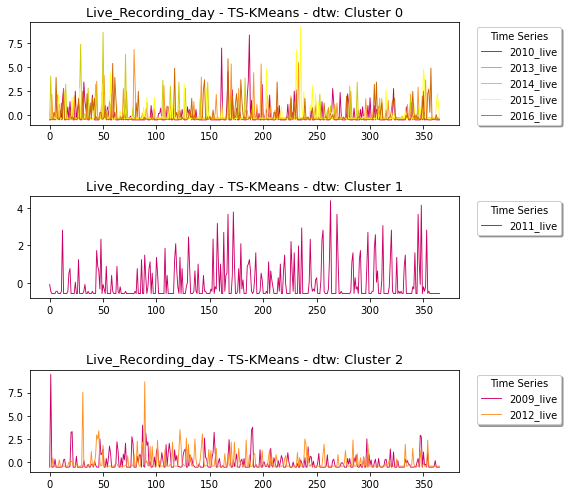

In [437]:
analyze_clusters(labels_live_dtw, tss_live_scaled, df_tss_live_scaled, album_type, 'TS-KMeans - dtw', False)

**Centroids**

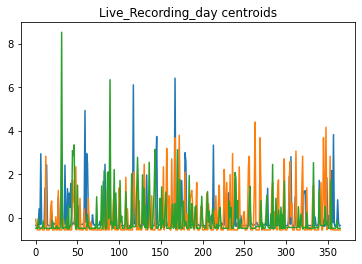

In [438]:
plot_kmeans_centroids(cluster_centers_live_dtw, album_type)

<h3>KMeans sklearn</h3>

k:  2 SSE:  2105.9610105468087 Silhouette Score:  0.042604885218079404
Calinski-Harabaz:  1.3495424570762677 Davies-Bouldin:  2.005617762746083

k:  3 SSE:  1670.069146318336 Silhouette Score:  0.046269895172370554
Calinski-Harabaz:  1.3615790984068683 Davies-Bouldin:  1.5950934272261736

k:  4 SSE:  1297.2939766208806 Silhouette Score:  0.04304531389161087
Calinski-Harabaz:  1.3179718088222816 Davies-Bouldin:  1.2339972683701337

k:  5 SSE:  940.8545265713805 Silhouette Score:  0.03240542186042772
Calinski-Harabaz:  1.3063553427814032 Davies-Bouldin:  0.9571201877213108

k:  6 SSE:  619.1118707407801 Silhouette Score:  0.023028634160668172
Calinski-Harabaz:  1.2666723836131524 Davies-Bouldin:  0.7368825394279618

k:  7 SSE:  304.3932854457288 Silhouette Score:  0.016308897579482916
Calinski-Harabaz:  1.2457832605984385 Davies-Bouldin:  0.5055499639148676



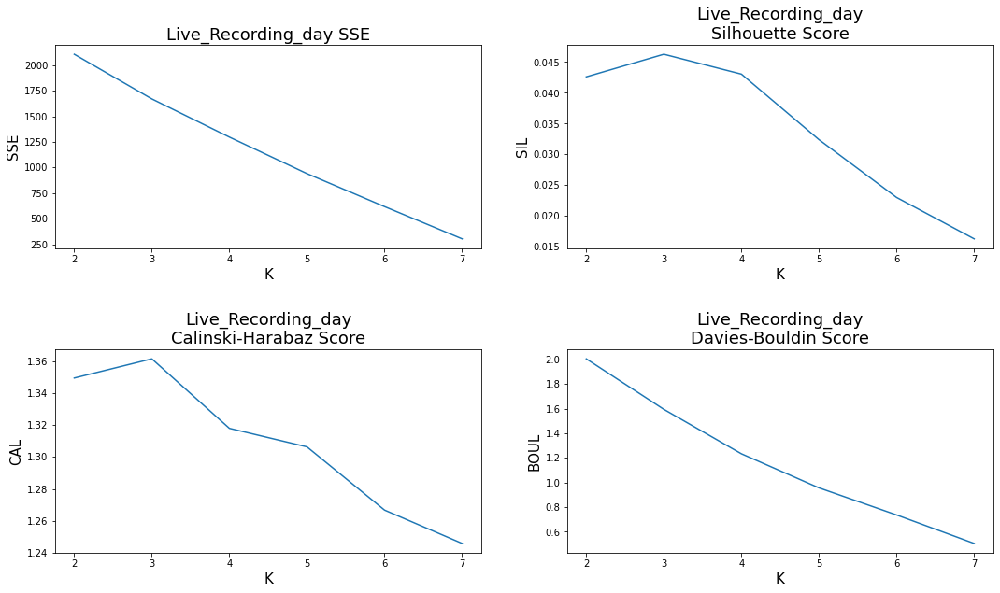

In [439]:
find_optimal_k_kmeans(7, "", df_tss_live_scaled, True, album_type)

In [440]:
cluster_centers_live_2, dict_label_live_2, labels_live_2 = run_kmeans(3, 300, 10, '', df_tss_live_scaled,\
                                                                      True)

cluster_centers_shape (3, 366)

Labels:  {0: 3, 1: 3, 2: 2}

SSE:  1670.069146318336
Silhouette Score:  0.046269895172370554
Calinski - Harabaz Score:  1.3615790984068683
Davies - Bouldin Score:  1.5950934272261736


In [441]:
cluster_insight(df_tss_live_scaled, labels_live_2)

,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669,0
2010_live,-0.473381,-0.473381,-0.203509,-0.473381,-0.338445,-0.473381,-0.338445,2.090396,-0.203509,-0.473381,...,-0.473381,-0.473381,-0.338445,-0.473381,-0.338445,-0.473381,-0.473381,-0.473381,-0.473381,2
2011_live,-0.086652,-0.449796,-0.570844,-0.570844,-0.570844,-0.570844,-0.449796,-0.449796,-0.570844,-0.570844,...,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,1
2012_live,-0.436938,-0.436938,-0.436938,0.463382,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,0.238302,...,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,1
2013_live,-0.372436,-0.372436,2.168458,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,0.524350,...,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,1
2014_live,-0.278272,4.042526,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,1.161994,1.161994,...,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,0
2015_live,-0.311867,-0.311867,-0.311867,-0.311867,-0.115407,-0.311867,-0.311867,0.670434,2.242115,-0.311867,...,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,1.063354,2.242115,1.259814,-0.311867,0
2016_live,-0.411968,-0.411968,-0.411968,-0.411968,0.309469,-0.171489,3.916654,-0.171489,-0.411968,-0.411968,...,4.878571,-0.411968,-0.411968,-0.411968,-0.411968,0.068990,-0.411968,-0.411968,-0.411968,2


Cluster 0
 ['2009_live', '2014_live', '2015_live']

Cluster 1
 ['2011_live', '2012_live', '2013_live']

Cluster 2
 ['2010_live', '2016_live']



<h2>Feature based Clustering</h2>

<h3>KMeans</h3>

In [442]:
F = [list(calculate_features(x).values())for x in tss_live_scaled]

<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead

k:  2 SSE:  112.1900974400372 Silhouette Score:  0.6150668785399793
Calinski-Harabaz:  23.561431272584727 Davies-Bouldin:  0.440220048835746

k:  3 SSE:  59.084832614992735 Silhouette Score:  0.49322235665717407
Calinski-Harabaz:  20.887980948717313 Davies-Bouldin:  0.35690880179645906

k:  4 SSE:  19.047923301944753 Silhouette Score:  0.5168482220210289
Calinski-Harabaz:  37.35854693525258 Davies-Bouldin:  0.33457414124457346

k:  5 SSE:  8.76041150562571 Silhouette Score:  0.4009391299292413
Calinski-Harabaz:  46.57226124321435 Davies-Bouldin:  0.21080647148135467

k:  6 SSE:  0.4781907546724271 Silhouette Score:  0.41210896963988763
Calinski-Harabaz:  461.9677646814301 Davies-Bouldin:  0.08384069142307253

k:  7 SSE:  0.15690493464193175 Silhouette Score:  0.21670720091874926
Calinski-Harabaz:  586.9722667310788 Davies-Bouldin:  0.038656527309367736



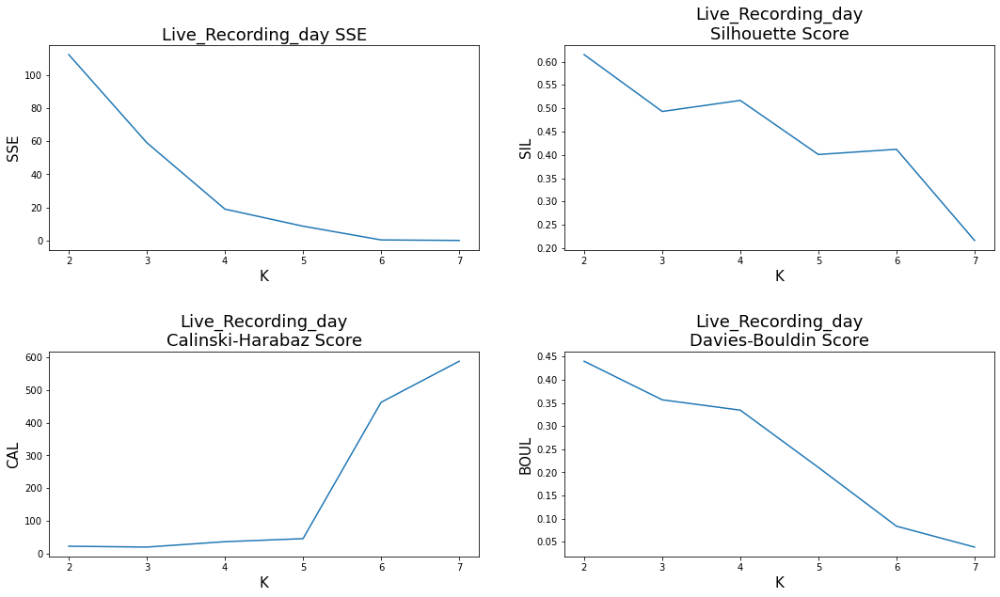

In [443]:
find_optimal_k_kmeans(7, "", F, True, album_type)

In [444]:
cluster_centers_live_fb, dict_label_live_fb, labels_live_fb = run_kmeans(4, 300, 10, "", F, True)

cluster_centers_shape (4, 5)

Labels:  {0: 2, 1: 2, 2: 1, 3: 3}

SSE:  19.047923301944753
Silhouette Score:  0.5168482220210289
Calinski - Harabaz Score:  37.35854693525258
Davies - Bouldin Score:  0.33457414124457346


<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead

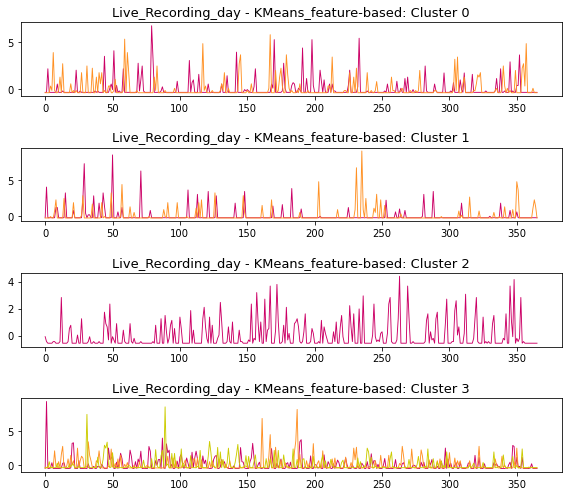

In [445]:
analyze_clusters_fb(labels_live_fb, tss_live_scaled, album_type, 'KMeans_feature-based', False)

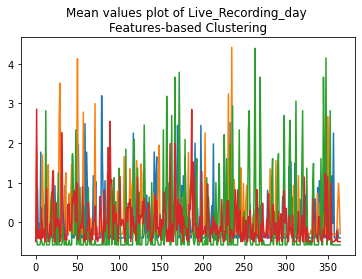

In [446]:
plot_mean_values(labels_live_fb, tss_live_scaled, album_type)

<h2>Compression-based Clustering</h2>

<h3>DBSCAN</h3>

In [447]:
M = pairwise_distances(tss_live_scaled.reshape(tss_live_scaled.shape[0], tss_live_scaled.shape[1]), \
                       metric=cdm_dist)

In [448]:
print(tss_live_scaled.shape, M.shape)

(8, 366, 1) (8, 8)


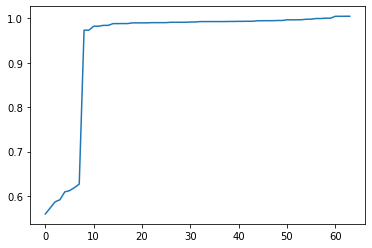

In [449]:
plt.plot(sorted(M.ravel()))
plt.show()

In [450]:
dbscan_compression_live = DBSCAN(eps=0.97, min_samples=5, metric='precomputed')
dbscan_compression_live.fit(M)

DBSCAN(eps=0.97, metric='precomputed')

In [451]:
dbscan_compression_live.labels_

array([-1, -1, -1, -1, -1, -1, -1, -1])

<h2>Approximation-based Clustering</h2>

<h3>PiecewiseAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [452]:
n_paa_segments = 183
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(tss_live_scaled)

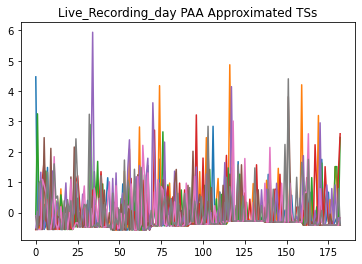

In [453]:
plt.plot(X_paa.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.title(album_type + " PAA Approximated TSs")
plt.show()

k:  2 SSE:  69.44133367512669 Silhouette Score:  0.06385845958488073

k:  3 SSE:  54.556437425747816 Silhouette Score:  0.058575323256446044

k:  4 SSE:  43.034503510666426 Silhouette Score:  0.03186215283635521

k:  5 SSE:  31.36649904304672 Silhouette Score:  0.028343962377284926

k:  6 SSE:  20.33873455276333 Silhouette Score:  0.019409051777909577

k:  7 SSE:  9.895968684762394 Silhouette Score:  0.005351170099599351



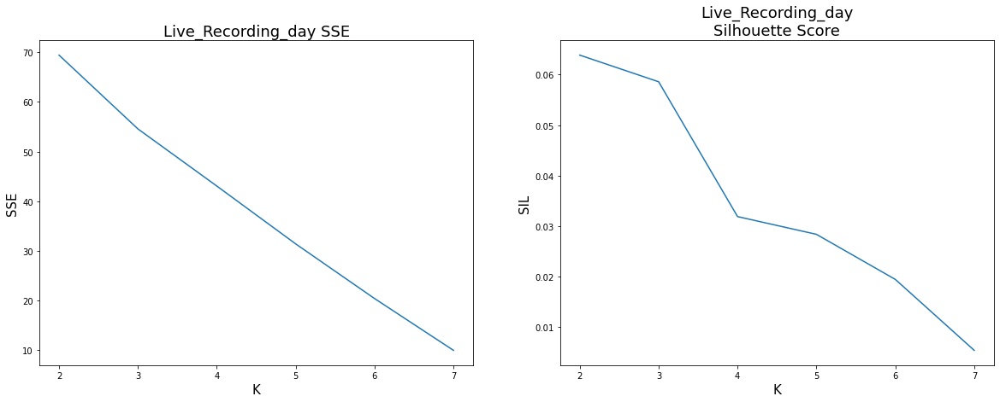

In [454]:
find_optimal_k_kmeans(7, 'euclidean', X_paa, False, album_type)

In [455]:
cluster_centers_live_paa, dict_label_live_paa, labels_live_paa = run_kmeans(3, 300, 10, 'euclidean', X_paa,\
                                                                      False)

cluster_centers_shape (3, 183, 1)

Labels:  {0: 3, 1: 3, 2: 2}

SSE:  54.556437425747816
Silhouette Score:  0.058575323256446044


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,4.467293,-0.553669,-0.082954,-0.553669,-0.553669,-0.553669,-0.122180,-0.122180,-0.553669,-0.514443,...,1.093834,0.387761,-0.396764,0.270082,-0.553669,-0.553669,-0.161406,-0.553669,-0.553669,1
2010_live,-0.473381,-0.338445,-0.405913,0.875975,-0.338445,-0.001106,2.157864,-0.473381,0.336233,0.471169,...,-0.001106,1.010911,-0.405913,-0.473381,-0.473381,-0.405913,-0.405913,-0.473381,-0.473381,0
2011_live,-0.268224,-0.570844,-0.570844,-0.449796,-0.570844,-0.510320,1.123829,-0.570844,-0.510320,0.639636,...,1.789593,-0.328748,1.305401,-0.510320,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,0
2012_live,-0.436938,0.013222,-0.436938,-0.436938,-0.099318,-0.436938,-0.436938,-0.436938,-0.436938,-0.155588,...,-0.436938,-0.268128,-0.436938,0.969812,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,2
2013_live,-0.372436,0.898011,-0.372436,-0.372436,0.075957,-0.372436,-0.297704,-0.372436,-0.372436,-0.372436,...,-0.372436,0.374886,1.645333,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,2
2014_live,1.882127,-0.278272,-0.278272,-0.278272,1.161994,-0.278272,-0.278272,1.470623,-0.278272,-0.278272,...,-0.278272,0.133233,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,1
2015_live,-0.311867,-0.311867,-0.213637,0.179283,0.965124,-0.311867,-0.311867,1.063354,-0.311867,-0.311867,...,-0.311867,4.206717,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,1.652734,0.473974,1
2016_live,-0.411968,-0.411968,0.068990,1.872583,-0.411968,0.549948,1.151146,-0.411968,-0.411968,0.068990,...,0.790427,-0.411968,-0.411968,2.473780,2.594020,-0.411968,-0.411968,-0.171489,-0.411968,0



Cluster 0
 ['2010_live', '2011_live', '2016_live']

Cluster 1
 ['2009_live', '2014_live', '2015_live']

Cluster 2
 ['2012_live', '2013_live']




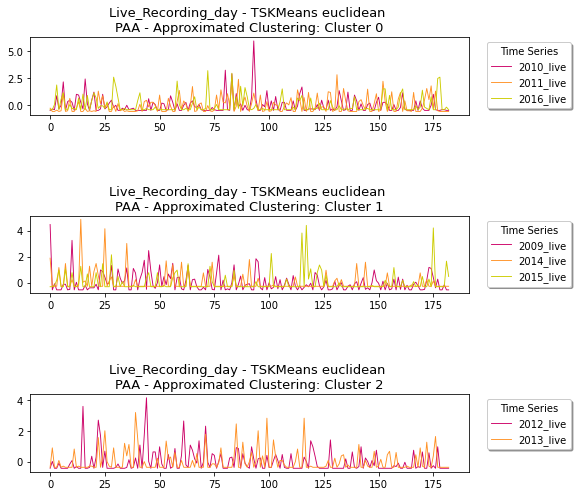

In [457]:
analyze_approximated_clusters(labels_live_paa, X_paa, df_tss_live_scaled, album_type, \
                               'TSKMeans euclidean \nPAA - Approximated Clustering', False)

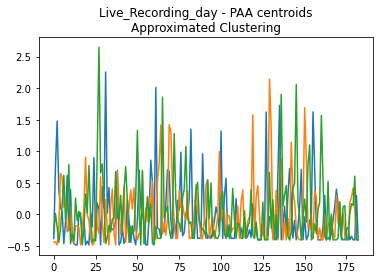

In [458]:
plot_centroids_approximated(cluster_centers_live_paa, X_paa, album_type, 'PAA')

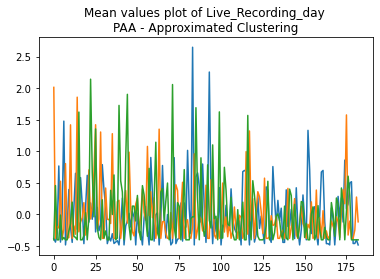

In [459]:
plot_mean_values_approximated(labels_live_paa, X_paa, album_type, 'PAA')

<h3>DTW</h3>

k:  2 SSE:  20.436772128131953 Silhouette Score:  0.05114053527599628

k:  3 SSE:  16.253629229758943 Silhouette Score:  0.0413533309548368

k:  4 SSE:  12.563016348713845 Silhouette Score:  0.039778579171675085

k:  5 SSE:  8.2629577871459 Silhouette Score:  0.02552470414986644

k:  6 SSE:  4.934289943105085 Silhouette Score:  -0.007494094961906844

k:  7 SSE:  1.683247034588307 Silhouette Score:  0.03327663840829312



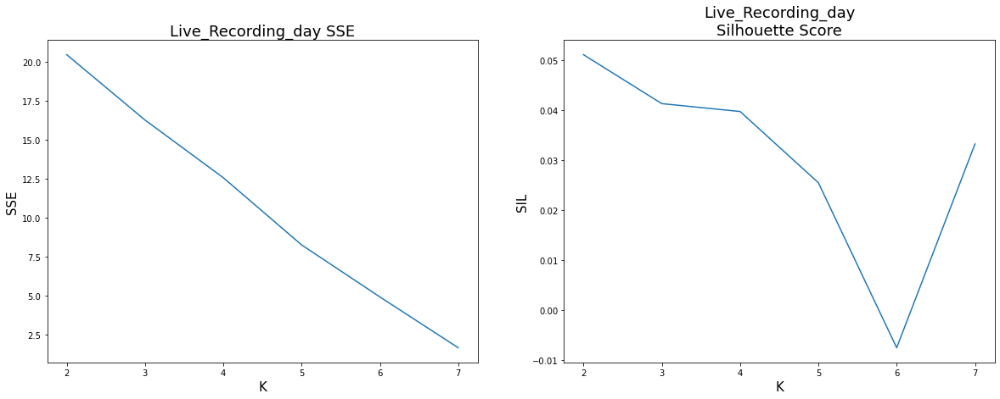

In [460]:
find_optimal_k_kmeans(7, 'dtw', X_paa, False, album_type)

In [461]:
cluster_centers_live_paa_dtw, dict_label_live_paa_dtw, labels_live_paa_dtw = run_kmeans(3, 300, 10, 'dtw', X_paa,\
                                                                      False)

cluster_centers_shape (3, 183, 1)

Labels:  {0: 5, 1: 1, 2: 2}

SSE:  16.253629229758943
Silhouette Score:  0.0413533309548368


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,4.467293,-0.553669,-0.082954,-0.553669,-0.553669,-0.553669,-0.122180,-0.122180,-0.553669,-0.514443,...,1.093834,0.387761,-0.396764,0.270082,-0.553669,-0.553669,-0.161406,-0.553669,-0.553669,2
2010_live,-0.473381,-0.338445,-0.405913,0.875975,-0.338445,-0.001106,2.157864,-0.473381,0.336233,0.471169,...,-0.001106,1.010911,-0.405913,-0.473381,-0.473381,-0.405913,-0.405913,-0.473381,-0.473381,0
2011_live,-0.268224,-0.570844,-0.570844,-0.449796,-0.570844,-0.510320,1.123829,-0.570844,-0.510320,0.639636,...,1.789593,-0.328748,1.305401,-0.510320,-0.570844,-0.570844,-0.570844,-0.570844,-0.570844,0
2012_live,-0.436938,0.013222,-0.436938,-0.436938,-0.099318,-0.436938,-0.436938,-0.436938,-0.436938,-0.155588,...,-0.436938,-0.268128,-0.436938,0.969812,-0.436938,-0.436938,-0.436938,-0.436938,-0.436938,0
2013_live,-0.372436,0.898011,-0.372436,-0.372436,0.075957,-0.372436,-0.297704,-0.372436,-0.372436,-0.372436,...,-0.372436,0.374886,1.645333,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,-0.372436,0
2014_live,1.882127,-0.278272,-0.278272,-0.278272,1.161994,-0.278272,-0.278272,1.470623,-0.278272,-0.278272,...,-0.278272,0.133233,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,-0.278272,2
2015_live,-0.311867,-0.311867,-0.213637,0.179283,0.965124,-0.311867,-0.311867,1.063354,-0.311867,-0.311867,...,-0.311867,4.206717,-0.311867,-0.311867,-0.311867,-0.311867,-0.311867,1.652734,0.473974,1
2016_live,-0.411968,-0.411968,0.068990,1.872583,-0.411968,0.549948,1.151146,-0.411968,-0.411968,0.068990,...,0.790427,-0.411968,-0.411968,2.473780,2.594020,-0.411968,-0.411968,-0.171489,-0.411968,0



Cluster 0
 ['2010_live', '2011_live', '2012_live', '2013_live', '2016_live']

Cluster 1
 ['2015_live']

Cluster 2
 ['2009_live', '2014_live']




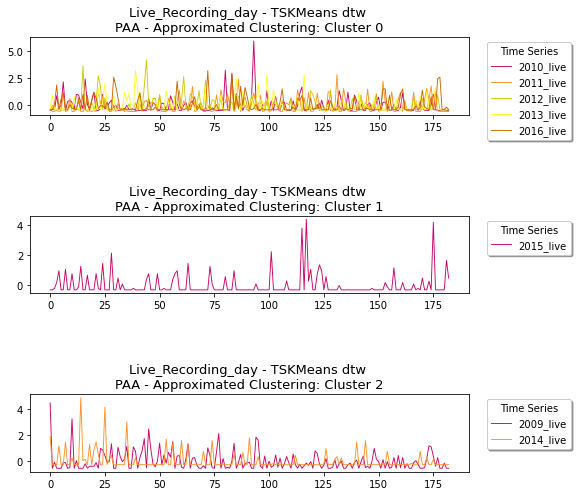

In [462]:
analyze_approximated_clusters(labels_live_paa_dtw, X_paa, df_tss_live_scaled, album_type, \
                               'TSKMeans dtw \nPAA - Approximated Clustering', False)

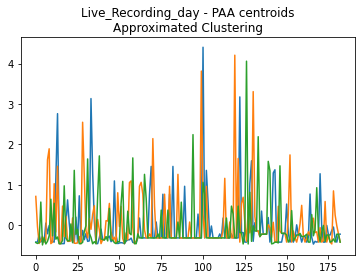

In [463]:
plot_centroids_approximated(cluster_centers_live_paa_dtw, X_paa, album_type, 'PAA')

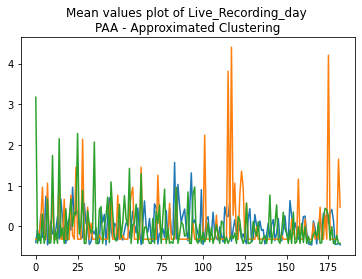

In [464]:
plot_mean_values_approximated(labels_live_paa_dtw, X_paa, album_type, 'PAA')

<h3>OneD_SymbolicAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [469]:
n_sax1d_segments = 183
n_sax_symbols_avg = 50
#n_sax_symbols_slope = 4

one_d_sax = OneD_SymbolicAggregateApproximation(n_segments=n_sax1d_segments,\
     alphabet_size_avg=n_sax_symbols_avg)#, alphabet_size_slope=n_sax_symbols_slope)

X_sax1d = one_d_sax.fit_transform(tss_live_scaled)

<h3>EUCLIDEAN</h3>

k:  2 SSE:  12764.999999999993 Silhouette Score:  0.07183068708617454

k:  3 SSE:  9778.58333333333 Silhouette Score:  0.0791288399046421

k:  4 SSE:  7308.458333333329 Silhouette Score:  0.07070962574171072

k:  5 SSE:  5323.6875 Silhouette Score:  0.04836466450406786

k:  6 SSE:  3361.8125 Silhouette Score:  0.0352204502718078

k:  7 SSE:  1524.8125000000002 Silhouette Score:  0.01659722729208787



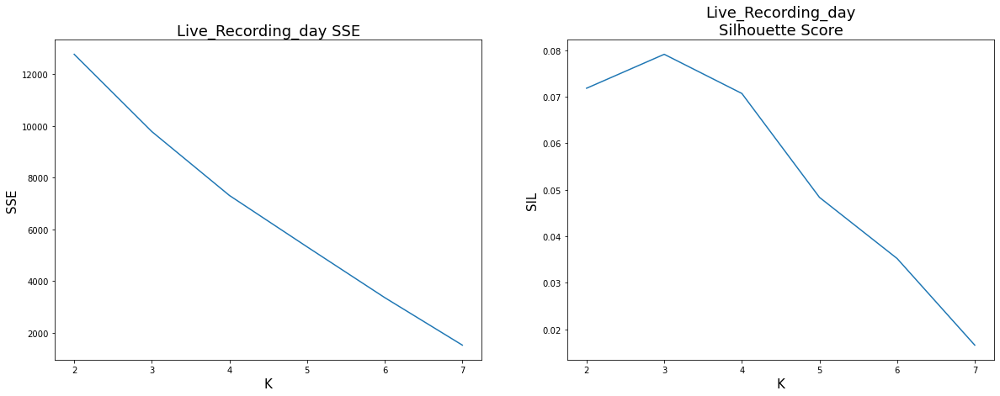

In [470]:
find_optimal_k_kmeans(7, 'euclidean', X_sax1d, False, album_type)

In [471]:
cluster_centers_live_sax1d, dict_label_live_sax1d, \
labels_live_sax1d = run_kmeans(3, 1000, 10, 'euclidean', X_sax1d, False)

cluster_centers_shape (3, 183, 2)

Labels:  {0: 2, 1: 3, 2: 3}

SSE:  9778.58333333333
Silhouette Score:  0.0791288399046421


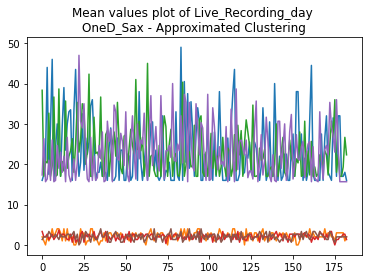

In [472]:
plot_mean_values_approximated(labels_live_sax1d, X_sax1d, album_type, 'OneD_Sax')

<h3>DTW</h3>

k:  2 SSE:  3002.5324276411593 Silhouette Score:  0.13008729159800123

k:  3 SSE:  2309.2692474401892 Silhouette Score:  0.1085759091989371

k:  4 SSE:  1645.923362225709 Silhouette Score:  0.04739475366737255

k:  5 SSE:  1114.421186391223 Silhouette Score:  0.032778296992892704

k:  6 SSE:  727.3513947245565 Silhouette Score:  0.00585431564667471

k:  7 SSE:  305.59563492063495 Silhouette Score:  0.007655590609983217



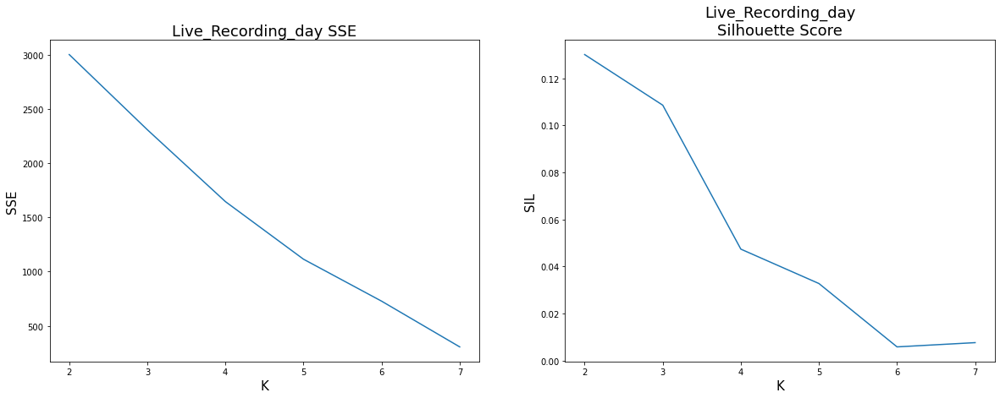

In [473]:
find_optimal_k_kmeans(7, 'dtw', X_sax1d, False, album_type)

In [474]:
cluster_centers_live_sax1d_dtw, dict_label_live_sax1d_dtw, \
labels_live_sax1d_dtw = run_kmeans(3, 300, 10, 'dtw', X_sax1d, False)

cluster_centers_shape (3, 183, 2)

Labels:  {0: 6, 1: 1, 2: 1}

SSE:  2309.2692474401892
Silhouette Score:  0.1085759091989371


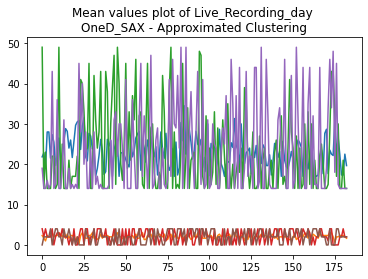

In [475]:
plot_mean_values_approximated(labels_live_sax1d_dtw, X_sax1d, album_type, 'OneD_SAX')

<h3>SymbolicAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [476]:
n_sax_segments = 183
n_sax_symbols = 50

sax = SymbolicAggregateApproximation(n_segments=n_sax_segments, \
                                     alphabet_size_avg=n_sax_symbols)

X_sax = sax.fit_transform(tss_live_scaled)

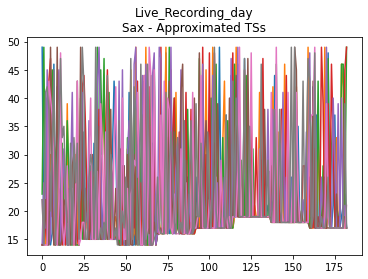

In [477]:
plt.plot(X_sax.reshape(X_sax.shape[1], X_sax.shape[0]))
plt.title(album_type + "\nSax - Approximated TSs")
plt.show()

<h3>EUCLIDEAN</h3>

k:  2 SSE:  12524.43333333333 Silhouette Score:  0.07241112974716035

k:  3 SSE:  9582.916666666664 Silhouette Score:  0.0802457115817335

k:  4 SSE:  7165.958333333332 Silhouette Score:  0.07130152067812395

k:  5 SSE:  5220.6875 Silhouette Score:  0.0489033672598417

k:  6 SSE:  3298.3125 Silhouette Score:  0.03561089168093082

k:  7 SSE:  1502.3125000000002 Silhouette Score:  0.016246827449184646



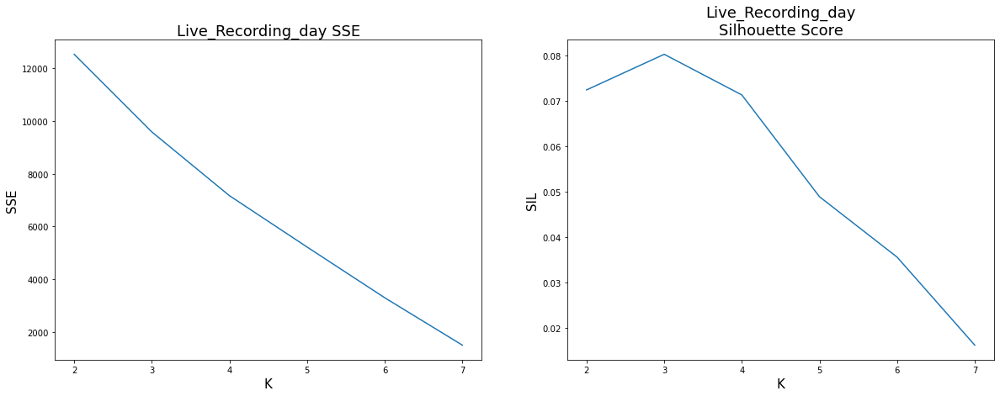

In [478]:
find_optimal_k_kmeans(7, 'euclidean', X_sax, False, album_type)

In [479]:
cluster_centers_live_sax, dict_label_live_sax, \
labels_live_sax = run_kmeans(3, 1000, 10, 'euclidean', X_sax, False)

cluster_centers_shape (3, 183, 1)

Labels:  {0: 2, 1: 3, 2: 3}

SSE:  9582.916666666664
Silhouette Score:  0.0802457115817335


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,49,14,23,14,14,14,22,22,14,15,...,43,32,17,30,14,14,21,14,14,1
2010_live,15,18,17,40,18,24,49,15,31,34,...,24,42,17,15,15,17,17,15,15,0
2011_live,19,14,14,16,14,15,43,14,15,36,...,48,18,45,15,14,14,14,14,14,2
2012_live,16,25,16,16,23,16,16,16,16,21,...,16,19,16,41,16,16,16,16,16,2
2013_live,17,40,17,17,26,17,19,17,17,17,...,17,32,47,17,17,17,17,17,17,2
2014_live,48,19,19,19,43,19,19,46,19,19,...,19,27,19,19,19,19,19,19,19,1
2015_live,18,18,20,28,41,18,18,42,18,18,...,18,49,18,18,18,18,18,47,34,1
2016_live,17,17,26,48,17,35,43,17,17,26,...,39,17,17,49,49,17,17,21,17,0



Cluster 0
 ['2010_live', '2016_live']

Cluster 1
 ['2009_live', '2014_live', '2015_live']

Cluster 2
 ['2011_live', '2012_live', '2013_live']




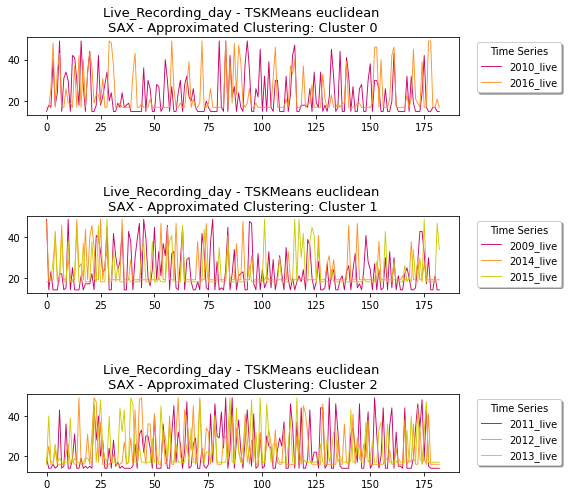

In [480]:
analyze_approximated_clusters(labels_live_sax, X_sax, df_tss_live_scaled, \
                              album_type, \
                              'TSKMeans euclidean \nSAX - Approximated Clustering', False)

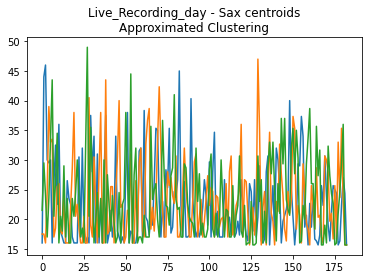

In [481]:
plot_centroids_approximated(cluster_centers_live_sax, X_sax, album_type, 'Sax')

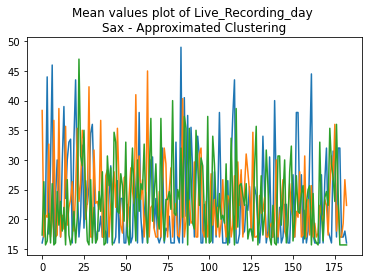

In [482]:
plot_mean_values_approximated(labels_live_sax, X_sax, album_type, 'Sax')

<h3>DTW</h3>

k:  2 SSE:  2744.1126826619866 Silhouette Score:  0.13041322517041248

k:  3 SSE:  2100.346400901174 Silhouette Score:  0.10819355449257825

k:  4 SSE:  1461.7852095368403 Silhouette Score:  0.04149737764315906

k:  5 SSE:  1047.7253005368812 Silhouette Score:  0.028759619834802373

k:  6 SSE:  648.1383333333334 Silhouette Score:  0.013197313010163676

k:  7 SSE:  273.96250000000003 Silhouette Score:  0.009013547500397262



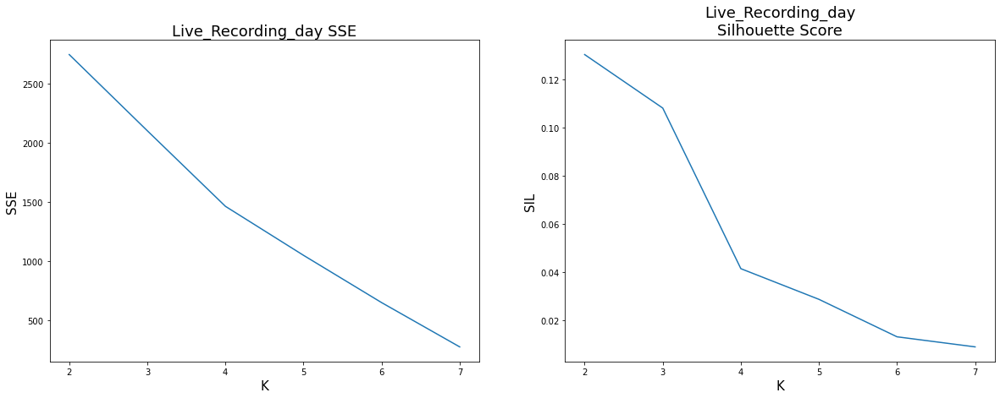

In [483]:
find_optimal_k_kmeans(7, 'dtw', X_sax, False, album_type)

In [484]:
cluster_centers_live_sax_dtw, dict_label_live_sax_dtw, \
labels_live_sax_dtw = run_kmeans(3, 300, 10, 'dtw', X_sax, False)

cluster_centers_shape (3, 183, 1)

Labels:  {0: 6, 1: 1, 2: 1}

SSE:  2100.346400901174
Silhouette Score:  0.10819355449257825


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_live,49,14,23,14,14,14,22,22,14,15,...,43,32,17,30,14,14,21,14,14,1
2010_live,15,18,17,40,18,24,49,15,31,34,...,24,42,17,15,15,17,17,15,15,0
2011_live,19,14,14,16,14,15,43,14,15,36,...,48,18,45,15,14,14,14,14,14,2
2012_live,16,25,16,16,23,16,16,16,16,21,...,16,19,16,41,16,16,16,16,16,0
2013_live,17,40,17,17,26,17,19,17,17,17,...,17,32,47,17,17,17,17,17,17,0
2014_live,48,19,19,19,43,19,19,46,19,19,...,19,27,19,19,19,19,19,19,19,0
2015_live,18,18,20,28,41,18,18,42,18,18,...,18,49,18,18,18,18,18,47,34,0
2016_live,17,17,26,48,17,35,43,17,17,26,...,39,17,17,49,49,17,17,21,17,0



Cluster 0
 ['2010_live', '2012_live', '2013_live', '2014_live', '2015_live', '2016_live']

Cluster 1
 ['2009_live']

Cluster 2
 ['2011_live']




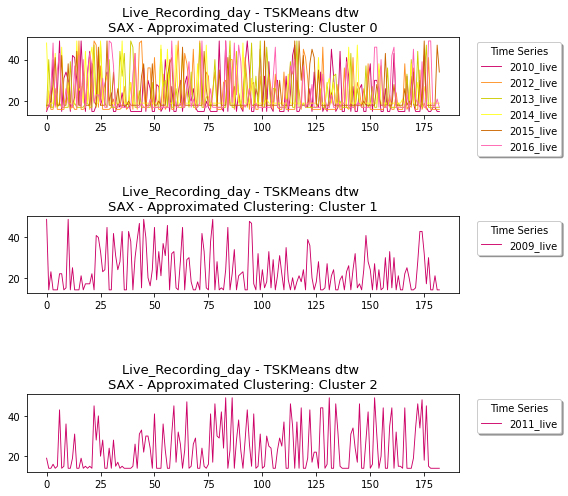

In [485]:
analyze_approximated_clusters(labels_live_sax_dtw, X_sax, df_tss_live_scaled, album_type, \
                               'TSKMeans dtw \nSAX - Approximated Clustering', False)

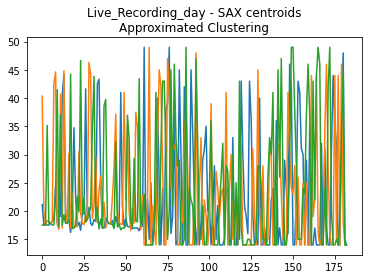

In [486]:
plot_centroids_approximated(cluster_centers_live_sax_dtw, X_sax, album_type, 'SAX')

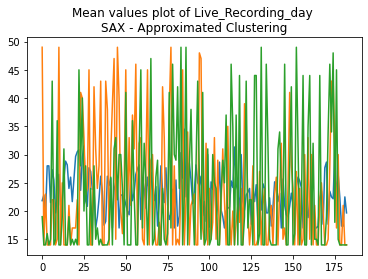

In [487]:
plot_mean_values_approximated(labels_live_sax_dtw, X_sax, album_type, 'SAX')

**--------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

<h1>Studio_Recording and Live_Recording</h1>

In [488]:
album_type = "Studio_Recording_day - Live_Recording_day"

<h2>Shape based clustering</h2>

<h3>TimeSeriesKMeans</h3>

In [489]:
df_studio_live

,1,2,3,4,5,6,7,8,9,10,...,357,358,359,360,361,362,363,364,365,366
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,0,2,0,0,0,1,0,0,33,0,...,8,0,20,5,2,78,25,3,3,0
2010_studio,10,21,13,13,4,19,41,34,62,10,...,55,63,1,23,1,26,51,65,3,0
2011_studio,12,23,85,77,51,29,58,10,35,54,...,110,21,0,2,9,27,38,20,2,0
2012_studio,9,67,50,46,14,0,5,9,29,77,...,47,10,20,40,22,55,42,15,41,21
2013_studio,28,33,188,61,6,10,117,85,91,89,...,16,9,0,6,6,7,0,80,42,0
2014_studio,9,41,57,17,35,40,46,31,13,63,...,11,25,12,0,17,23,12,17,24,0
2015_studio,50,38,29,33,21,7,32,4,36,22,...,30,12,8,2,1,15,10,30,44,0
2016_studio,41,6,22,68,99,48,41,73,81,24,...,53,48,11,47,4,42,31,21,86,176
2009_live,0,128,0,0,1,11,0,0,0,0,...,0,0,0,0,1,9,0,0,0,0


In [490]:
df_studio_live.shape

(16, 366)

In [491]:
tss_studio_live = to_time_series_dataset(df_studio_live.values)
tss_studio_live

array([[[ 0.],
        [ 2.],
        [ 0.],
        ...,
        [ 3.],
        [ 3.],
        [ 0.]],

       [[10.],
        [21.],
        [13.],
        ...,
        [65.],
        [ 3.],
        [ 0.]],

       [[12.],
        [23.],
        [85.],
        ...,
        [20.],
        [ 2.],
        [ 0.]],

       ...,

       [[ 0.],
        [21.],
        [ 0.],
        ...,
        [ 0.],
        [ 0.],
        [ 0.]],

       [[ 0.],
        [ 0.],
        [ 0.],
        ...,
        [13.],
        [ 8.],
        [ 0.]],

       [[ 0.],
        [ 0.],
        [ 0.],
        ...,
        [ 0.],
        [ 0.],
        [ 0.]]])

In [492]:
tss_studio_live.shape

(16, 366, 1)

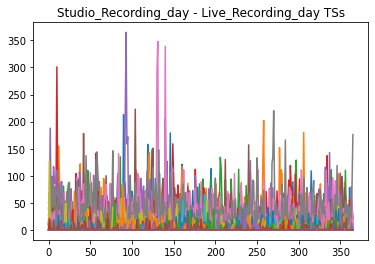

In [493]:
plt.plot(np.squeeze(tss_studio_live).T)
plt.title(album_type + " TSs")
plt.show()

In [494]:
tss_studio_live_scaled = TimeSeriesScalerMeanVariance().fit_transform(tss_studio_live)
tss_studio_live_scaled

array([[[-0.73249705],
        [-0.66763038],
        [-0.73249705],
        ...,
        [-0.63519705],
        [-0.63519705],
        [-0.73249705]],

       [[-0.693914  ],
        [-0.3371199 ],
        [-0.59660652],
        ...,
        [ 1.09005647],
        [-0.92096479],
        [-1.01827227]],

       [[-0.54969667],
        [-0.1182973 ],
        [ 2.31322646],
        ...,
        [-0.23595167],
        [-0.94187792],
        [-1.02031417]],

       ...,

       [[-0.27827153],
        [ 4.0425264 ],
        [-0.27827153],
        ...,
        [-0.27827153],
        [-0.27827153],
        [-0.27827153]],

       [[-0.31186708],
        [-0.31186708],
        [-0.31186708],
        ...,
        [ 2.24211496],
        [ 1.25981418],
        [-0.31186708]],

       [[-0.41196818],
        [-0.41196818],
        [-0.41196818],
        ...,
        [-0.41196818],
        [-0.41196818],
        [-0.41196818]]])

In [495]:
tss_studio_live_scaled.shape

(16, 366, 1)

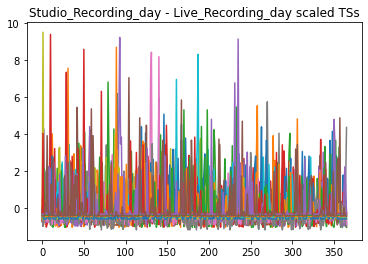

In [496]:
plt.plot(np.squeeze(tss_studio_live_scaled).T)
plt.title(album_type + " scaled TSs")
plt.show()

**I convert scaled time series dataset to normal dataset**

In [497]:
df_tss_studio_live_scaled = pd.DataFrame(np.squeeze(tss_studio_live_scaled), columns = df_studio_live.columns, \
                                    index = df_studio_live.index)
df_tss_studio_live_scaled

,1,2,3,4,5,6,7,8,9,10,...,357,358,359,360,361,362,363,364,365,366
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.473030,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,0.765698,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,3.293680,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,0.609011,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.511510,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.500065,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.068697,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.500328,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669


<h3>Euclidean Distance</h3>

k:  2 SSE:  310.999081299587 Silhouette Score:  0.02779575614235491

k:  3 SSE:  283.0629883606862 Silhouette Score:  0.029004534391193604

k:  4 SSE:  255.33012980352467 Silhouette Score:  0.029088971978164672

k:  5 SSE:  230.18935220653483 Silhouette Score:  0.032109276125757966

k:  6 SSE:  206.69731920706937 Silhouette Score:  0.02934231055565613

k:  7 SSE:  182.0127486164238 Silhouette Score:  0.04258805579049403

k:  8 SSE:  161.12445475483887 Silhouette Score:  0.030954854494876765

k:  9 SSE:  137.5780723521592 Silhouette Score:  0.035199558432756115

k:  10 SSE:  117.10713780352219 Silhouette Score:  0.02733404334530145

k:  11 SSE:  95.80903658636474 Silhouette Score:  0.028286799168322024

k:  12 SSE:  75.8679097751774 Silhouette Score:  0.02163692947585381

k:  13 SSE:  56.17695162098728 Silhouette Score:  0.01671277992938695

k:  14 SSE:  36.79919754120208 Silhouette Score:  0.015962352348077434

k:  15 SSE:  17.77461720084406 Silhouette Score:  0.010402480208665129



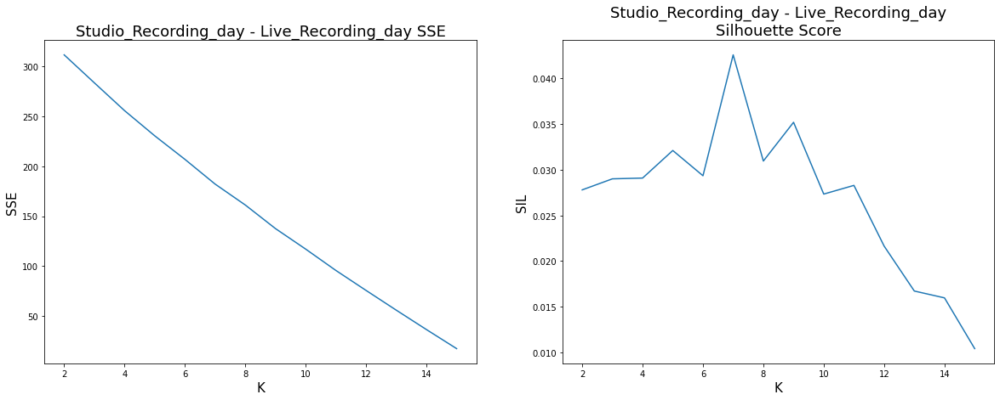

In [498]:
find_optimal_k_kmeans(15, 'euclidean', tss_studio_live_scaled, False, album_type)

**We can see that best k is 7**

In [499]:
cluster_centers_studio_live_eu, dict_label_studio_live_eu, labels_studio_live_eu = run_kmeans(7, 1000, 10, \
                                                            'euclidean', tss_studio_live_scaled, False)

cluster_centers_shape (7, 366, 1)

Labels:  {0: 2, 1: 2, 2: 4, 3: 2, 4: 2, 5: 2, 6: 2}

SSE:  182.0127486164238
Silhouette Score:  0.04258805579049403


In [500]:
cluster_insight_studio_live(df_tss_studio_live_scaled, labels_studio_live_eu)

Dataset con le labels associate


,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497,4
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272,2
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314,0
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518,3
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255,3
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369,5
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587,4
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778,5
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669,1


Cluster 0
 ['2011_studio', '2013_live']

Cluster 1
 ['2009_live', '2014_live']

Cluster 2
 ['2010_studio', '2010_live', '2015_live', '2016_live']

Cluster 3
 ['2012_studio', '2013_studio']

Cluster 4
 ['2009_studio', '2015_studio']

Cluster 5
 ['2014_studio', '2016_studio']

Cluster 6
 ['2011_live', '2012_live']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,1,1,2,1.0000,0.5000
Cluster 1,0,2,2,-0.0000,1.0000
Cluster 2,1,3,4,0.8113,0.7500
Cluster 3,2,0,2,-0.0000,1.0000
Cluster 4,2,0,2,-0.0000,1.0000
Cluster 5,2,0,2,-0.0000,1.0000
Cluster 6,0,2,2,-0.0000,1.0000
Total,8,8,16,0.3278,0.8750


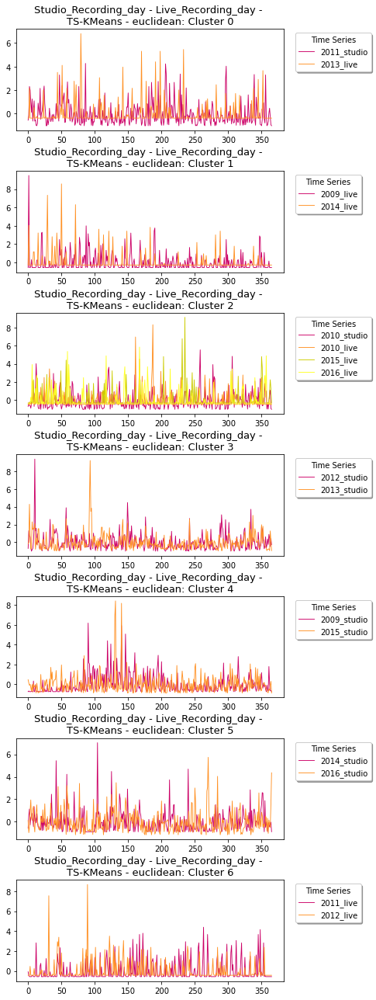

In [502]:
analyze_clusters(labels_studio_live_eu, tss_studio_live_scaled, df_tss_studio_live_scaled, album_type, \
                 '\nTS-KMeans - euclidean', True)

**Centroids**

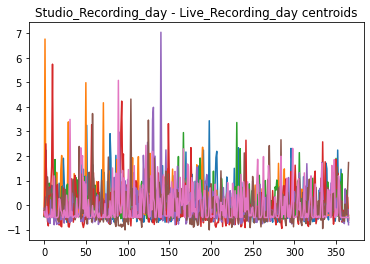

In [503]:
plot_kmeans_centroids(cluster_centers_studio_live_eu, album_type)

<h3>DTW distance</h3>

k:  2 SSE:  86.81586533270197 Silhouette Score:  0.07510672328771928

k:  3 SSE:  76.95115218918912 Silhouette Score:  0.04985259879568014

k:  4 SSE:  66.83195961184917 Silhouette Score:  0.07168483970189306

k:  5 SSE:  59.806489249926145 Silhouette Score:  0.057075918731656655

k:  6 SSE:  52.33389064686993 Silhouette Score:  0.04649855707628788

k:  7 SSE:  45.873075168588244 Silhouette Score:  0.03959966280042603

k:  8 SSE:  38.64103845146703 Silhouette Score:  0.0563687820973422

k:  9 SSE:  31.131134546246624 Silhouette Score:  0.05382576946391663

k:  10 SSE:  25.826740362250167 Silhouette Score:  0.027403982424793118

k:  11 SSE:  20.41810697280347 Silhouette Score:  0.03433864366439918

k:  12 SSE:  15.329509676198228 Silhouette Score:  0.023936036524820067

k:  13 SSE:  11.30875951644444 Silhouette Score:  0.02609672894468824

k:  14 SSE:  6.6113555680379505 Silhouette Score:  0.022349436101099254

k:  15 SSE:  3.1597613160025046 Silhouette Score:  0.0032353784800188547



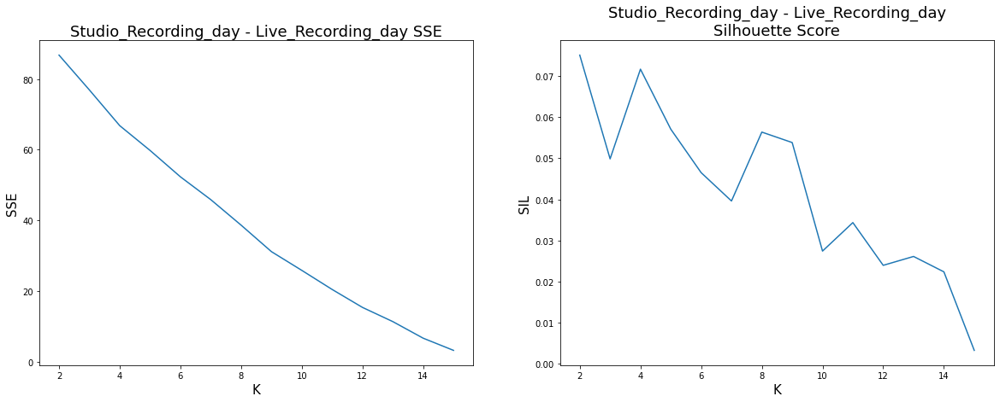

In [504]:
find_optimal_k_kmeans(15, 'dtw', tss_studio_live_scaled, False, album_type)

**We can see that best k is 4**

In [505]:
cluster_centers_studio_live_dtw, dict_label_studio_live_dtw, labels_studio_live_dtw = run_kmeans(4, 1000, 10, 'dtw',\
                                                                    tss_studio_live_scaled, False)

cluster_centers_shape (4, 366, 1)

Labels:  {0: 6, 1: 3, 2: 3, 3: 4}

SSE:  66.83195961184917
Silhouette Score:  0.07168483970189306


In [506]:
cluster_insight_studio_live(df_tss_studio_live_scaled, labels_studio_live_dtw)

Dataset con le labels associate


,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497,3
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272,2
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314,2
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518,1
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255,3
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369,3
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587,3
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778,2
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669,1


Cluster 0
 ['2010_live', '2011_live', '2013_live', '2014_live', '2015_live', '2016_live']

Cluster 1
 ['2012_studio', '2009_live', '2012_live']

Cluster 2
 ['2010_studio', '2011_studio', '2016_studio']

Cluster 3
 ['2009_studio', '2013_studio', '2014_studio', '2015_studio']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,0,6,6,-0.0000,1.0000
Cluster 1,1,2,3,0.9183,0.6667
Cluster 2,3,0,3,-0.0000,1.0000
Cluster 3,4,0,4,-0.0000,1.0000
Total,8,8,16,0.1722,0.9375


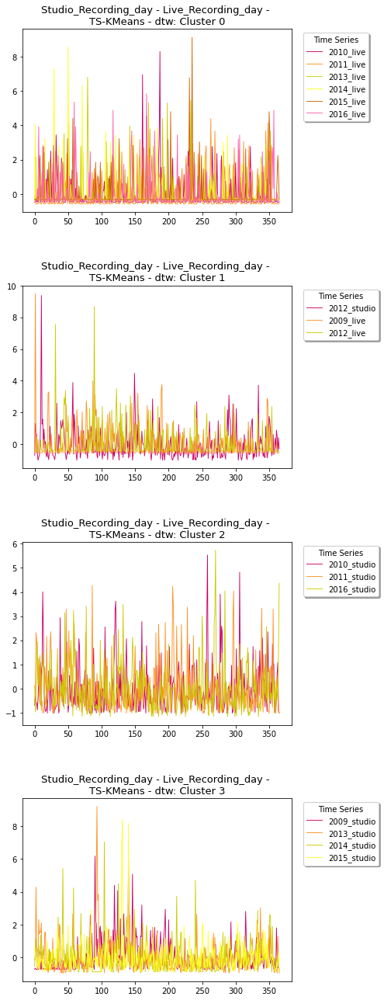

In [508]:
analyze_clusters(labels_studio_live_dtw, tss_studio_live_scaled, df_tss_studio_live_scaled, album_type, \
                 '\nTS-KMeans - dtw', True)

**Centroids**

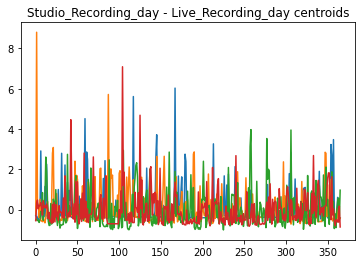

In [509]:
plot_kmeans_centroids(cluster_centers_studio_live_dtw, album_type)

<h3>KMeans sklearn</h3>

k:  2 SSE:  4975.985300793392 Silhouette Score:  0.02779575614235467
Calinski-Harabaz:  1.4566038057043913 Davies-Bouldin:  3.0720861442022587

k:  3 SSE:  4529.007813770979 Silhouette Score:  0.029004534391193604
Calinski-Harabaz:  1.3845228240693477 Davies-Bouldin:  2.5252299474029223

k:  4 SSE:  4085.282076856395 Silhouette Score:  0.029088971978164888
Calinski-Harabaz:  1.3790189053170625 Davies-Bouldin:  2.1581482322684384

k:  5 SSE:  3683.029635304558 Silhouette Score:  0.032109276125757785
Calinski-Harabaz:  1.3519712151089232 Davies-Bouldin:  1.8897880106274632

k:  6 SSE:  3307.1571073131095 Silhouette Score:  0.02934231055565629
Calinski-Harabaz:  1.3223110986125597 Davies-Bouldin:  1.6934580239171757

k:  7 SSE:  2912.203977862781 Silhouette Score:  0.04258805579049401
Calinski-Harabaz:  1.329662219577394 Davies-Bouldin:  1.579737115322457

k:  8 SSE:  2577.991276077422 Silhouette Score:  0.03095485449487696
Calinski-Harabaz:  1.2925727460622618 Davies-Bouldin:  1.30831767

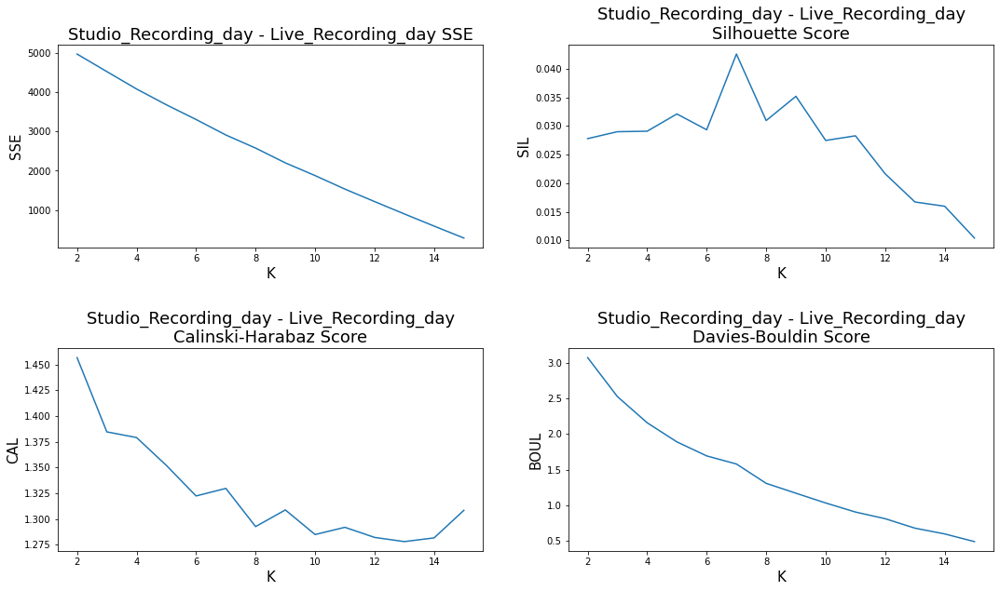

In [510]:
find_optimal_k_kmeans(15, "", df_tss_studio_live_scaled, True, album_type)

In [511]:
cluster_centers_studio_live_2, dict_label_studio_live_2, labels_studio_live_2 = run_kmeans(7, 1000, 10, '', \
                                                                        df_tss_studio_live_scaled, True)

cluster_centers_shape (7, 366)

Labels:  {0: 2, 1: 2, 2: 4, 3: 2, 4: 2, 5: 2, 6: 2}

SSE:  2912.203977862781
Silhouette Score:  0.04258805579049401
Calinski - Harabaz Score:  1.329662219577394
Davies - Bouldin Score:  1.579737115322457


In [512]:
cluster_insight_studio_live(df_tss_studio_live_scaled, labels_studio_live_2)

Dataset con le labels associate


,1,2,3,4,5,6,7,8,9,10,...,358,359,360,361,362,363,364,365,366,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.732497,-0.667630,-0.732497,-0.732497,-0.732497,-0.700064,-0.732497,-0.732497,0.337803,-0.732497,...,-0.732497,-0.083830,-0.570330,-0.667630,1.797303,0.078336,-0.635197,-0.635197,-0.732497,4
2010_studio,-0.693914,-0.337120,-0.596607,-0.596607,-0.888529,-0.401992,0.311597,0.084546,0.992749,-0.693914,...,1.025185,-0.985836,-0.272248,-0.985836,-0.174941,0.635955,1.090056,-0.920965,-1.018272,2
2011_studio,-0.549697,-0.118297,2.313226,1.999481,0.979810,0.117011,1.254337,-0.628133,0.352320,1.097465,...,-0.196734,-1.020314,-0.941878,-0.667351,0.038575,0.469975,-0.235952,-0.941878,-1.020314,0
2012_studio,-0.702763,1.299417,0.712572,0.574490,-0.530161,-1.013446,-0.840844,-0.702763,-0.012356,1.644621,...,-0.668242,-0.323039,0.367368,-0.253998,0.885173,0.436409,-0.495640,0.401888,-0.288518,3
2013_studio,-0.177202,-0.037907,4.280247,0.742147,-0.790101,-0.678665,2.302254,1.410764,1.577919,1.522200,...,-0.706524,-0.957255,-0.790101,-0.790101,-0.762242,-0.957255,1.271469,0.212825,-0.957255,3
2014_studio,-0.571211,0.567129,1.136299,-0.286626,0.353690,0.531556,0.744995,0.211398,-0.428919,1.349738,...,-0.002041,-0.464492,-0.891369,-0.286626,-0.073187,-0.464492,-0.286626,-0.037614,-0.891369,5
2015_studio,0.464563,0.144607,-0.095360,0.011292,-0.308664,-0.681946,-0.015371,-0.761935,0.091281,-0.282001,...,-0.548631,-0.655283,-0.815261,-0.841924,-0.468642,-0.601957,-0.068697,0.304585,-0.868587,4
2016_studio,0.123796,-0.974422,-0.472379,0.970992,1.943699,0.343439,0.123796,1.127881,1.378902,-0.409624,...,0.343439,-0.817533,0.312062,-1.037177,0.155174,-0.189981,-0.503757,1.535790,4.359778,5
2009_live,-0.553669,9.488254,-0.553669,-0.553669,-0.475217,0.309309,-0.553669,-0.553669,-0.553669,-0.553669,...,-0.553669,-0.553669,-0.553669,-0.475217,0.152404,-0.553669,-0.553669,-0.553669,-0.553669,1


Cluster 0
 ['2011_studio', '2013_live']

Cluster 1
 ['2009_live', '2014_live']

Cluster 2
 ['2010_studio', '2010_live', '2015_live', '2016_live']

Cluster 3
 ['2012_studio', '2013_studio']

Cluster 4
 ['2009_studio', '2015_studio']

Cluster 5
 ['2014_studio', '2016_studio']

Cluster 6
 ['2011_live', '2012_live']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,1,1,2,1.0000,0.5000
Cluster 1,0,2,2,-0.0000,1.0000
Cluster 2,1,3,4,0.8113,0.7500
Cluster 3,2,0,2,-0.0000,1.0000
Cluster 4,2,0,2,-0.0000,1.0000
Cluster 5,2,0,2,-0.0000,1.0000
Cluster 6,0,2,2,-0.0000,1.0000
Total,8,8,16,0.3278,0.8750


<h2>Feature based Clustering</h2>

<h3>KMeans</h3>

In [513]:
F = [list(calculate_features(x).values())for x in tss_studio_live_scaled]

<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead

k:  2 SSE:  222.87309344740422 Silhouette Score:  0.7002611295480954
Calinski-Harabaz:  72.51218638085128 Davies-Bouldin:  0.40226396134051323

k:  3 SSE:  111.87371745691722 Silhouette Score:  0.6930138900676273
Calinski-Harabaz:  73.51882693292468 Davies-Bouldin:  0.3515451637062426

k:  4 SSE:  30.255402230253306 Silhouette Score:  0.7240904365847158
Calinski-Harabaz:  178.0807164368987 Davies-Bouldin:  0.3147259369887154

k:  5 SSE:  15.497119547055856 Silhouette Score:  0.6965228545124558
Calinski-Harabaz:  241.64291069495135 Davies-Bouldin:  0.2424747254576137

k:  6 SSE:  8.274107995450857 Silhouette Score:  0.6601132524690194
Calinski-Harabaz:  330.90146304591974 Davies-Bouldin:  0.29578560891443245

k:  7 SSE:  6.144214280577649 Silhouette Score:  0.6312126047729844
Calinski-Harabaz:  334.72639095522015 Davies-Bouldin:  0.2915581574153495

k:  8 SSE:  4.225847703994512 Silhouette Score:  0.5751639771669903
Calinski-Harabaz:  371.3217396536429 Davies-Bouldin:  0.267752422180964

/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to d

k:  9 SSE:  2.3401489071634494 Silhouette Score:  0.576417441841717
Calinski-Harabaz:  514.082577608009 Davies-Bouldin:  0.20319537399564092

k:  10 SSE:  1.043530840781914 Silhouette Score:  0.4958353722837505
Calinski-Harabaz:  879.1867915603467 Davies-Bouldin:  0.21721642001737407

k:  11 SSE:  0.7222450207514187 Silhouette Score:  0.4234149321526567
Calinski-Harabaz:  952.9377454827608 Davies-Bouldin:  0.16299937234387232

k:  12 SSE:  0.4034587810350173 Silhouette Score:  0.3710693572375449
Calinski-Harabaz:  1240.9314245905637 Davies-Bouldin:  0.10896656641430928



/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  return f(*args, **kwargs)
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to d

k:  13 SSE:  0.18866802456698362 Silhouette Score:  0.30054022310714
Calinski-Harabaz:  1824.6900391291529 Davies-Bouldin:  0.06395696984546978

k:  14 SSE:  0.03176308992505185 Silhouette Score:  0.21730145658816463
Calinski-Harabaz:  6670.536673965202 Davies-Bouldin:  0.036067385510629255

k:  15 SSE:  0.01363032324014006 Silhouette Score:  0.1076828098851484
Calinski-Harabaz:  7217.194412548228 Davies-Bouldin:  0.018150041047641795



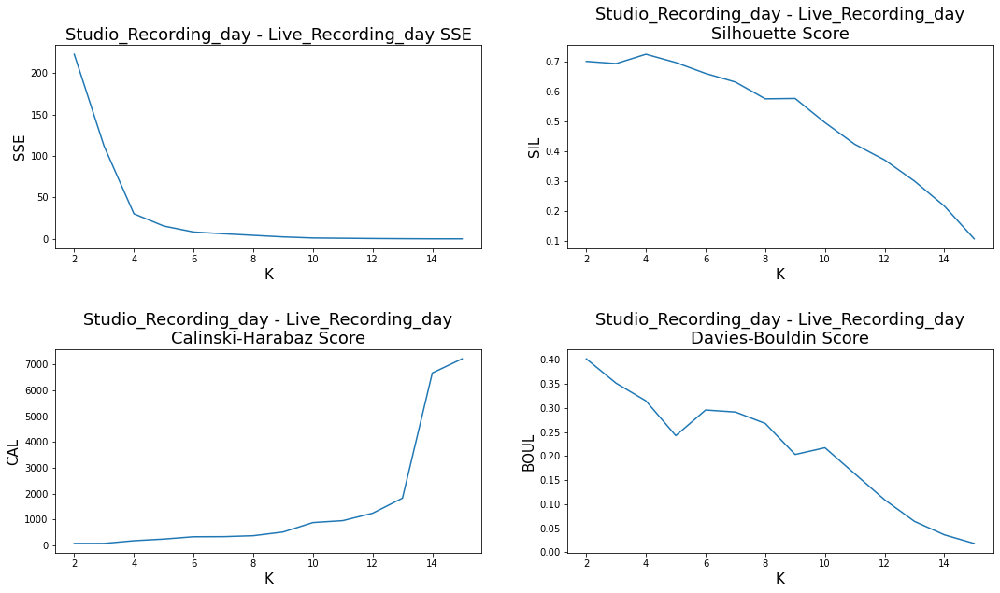

In [514]:
find_optimal_k_kmeans(15, "", F, True, album_type)

In [515]:
cluster_centers_studio_live_fb, dict_label_studio_live_fb, labels_studio_live_fb = run_kmeans(4, 1000, 10, "", F, \
                                                                                              True)

cluster_centers_shape (4, 5)

Labels:  {0: 4, 1: 3, 2: 4, 3: 5}

SSE:  30.255402230253306
Silhouette Score:  0.7240904365847158
Calinski - Harabaz Score:  178.0807164368987
Davies - Bouldin Score:  0.3147259369887154


<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead

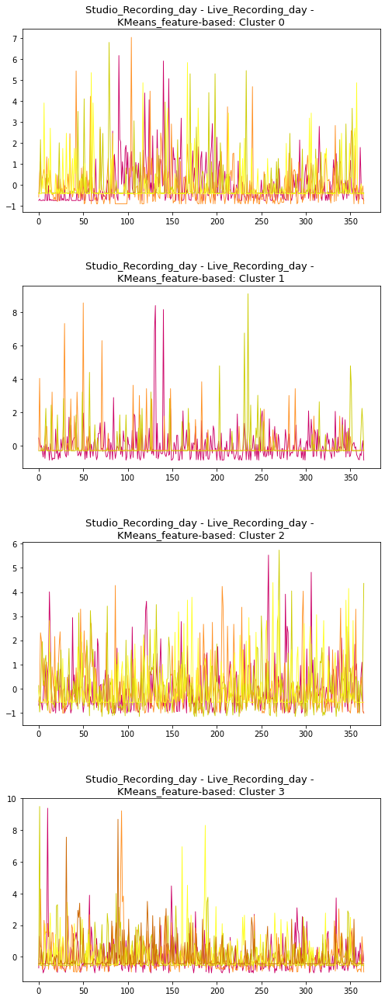

In [517]:
analyze_clusters_fb(labels_studio_live_fb, tss_studio_live_scaled, album_type, '\nKMeans_feature-based', True)

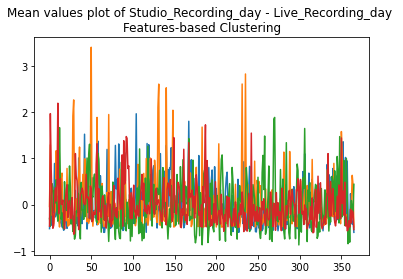

In [518]:
plot_mean_values(labels_studio_live_fb, tss_studio_live_scaled, album_type)

<h2>Compression-based Clustering</h2>

<h3>DBSCAN</h3>

In [519]:
M = pairwise_distances(tss_studio_live_scaled.reshape(tss_studio_live_scaled.shape[0], \
                                        tss_studio_live_scaled.shape[1]), metric=cdm_dist)

In [520]:
print(tss_studio_live_scaled.shape, M.shape)

(16, 366, 1) (16, 16)


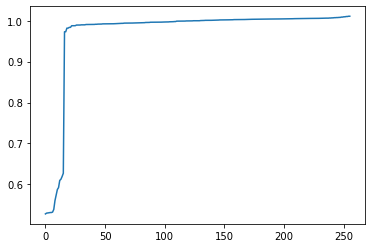

In [521]:
plt.plot(sorted(M.ravel()))
plt.show()

In [522]:
dbscan_compression_studio_live = DBSCAN(eps=0.99, min_samples=5, metric='precomputed')
dbscan_compression_studio_live.fit(M)

DBSCAN(eps=0.99, metric='precomputed')

In [523]:
dbscan_compression_studio_live.labels_

array([-1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1,  0,  0,  0,  0,  0])

<h2>Approximation-based Clustering</h2>

<h3>PiecewiseAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [524]:
n_paa_segments = 183
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(tss_studio_live_scaled)

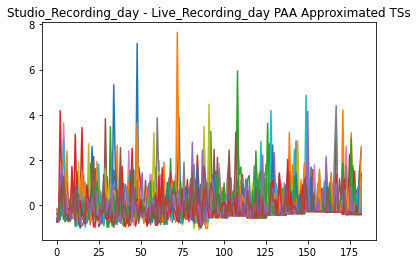

In [525]:
plt.plot(X_paa.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.title(album_type + " PAA Approximated TSs")
plt.show()

<h3>EUCLIDEAN</h3>

k:  2 SSE:  89.60995973868624 Silhouette Score:  0.03070427904540038

k:  3 SSE:  80.52220844518381 Silhouette Score:  0.0408520993052285

k:  4 SSE:  71.83991007433522 Silhouette Score:  0.037522170519602265

k:  5 SSE:  64.50510339142434 Silhouette Score:  0.04225009917451871

k:  6 SSE:  57.92287880844195 Silhouette Score:  0.031067388677166193

k:  7 SSE:  51.26766946100503 Silhouette Score:  0.02679725755792023

k:  8 SSE:  44.03839214406827 Silhouette Score:  0.03729817169677418

k:  9 SSE:  38.683959701318074 Silhouette Score:  0.0224724519432544

k:  10 SSE:  32.30874209009192 Silhouette Score:  0.01847894808693401

k:  11 SSE:  26.80759125088723 Silhouette Score:  0.016326725295287805

k:  12 SSE:  20.885121230358962 Silhouette Score:  0.015954882256097435

k:  13 SSE:  15.663738296358492 Silhouette Score:  0.007772225716279483

k:  14 SSE:  10.169367276381665 Silhouette Score:  0.00943443278433622

k:  15 SSE:  4.947984342381197 Silhouette Score:  0.0026755850497996755



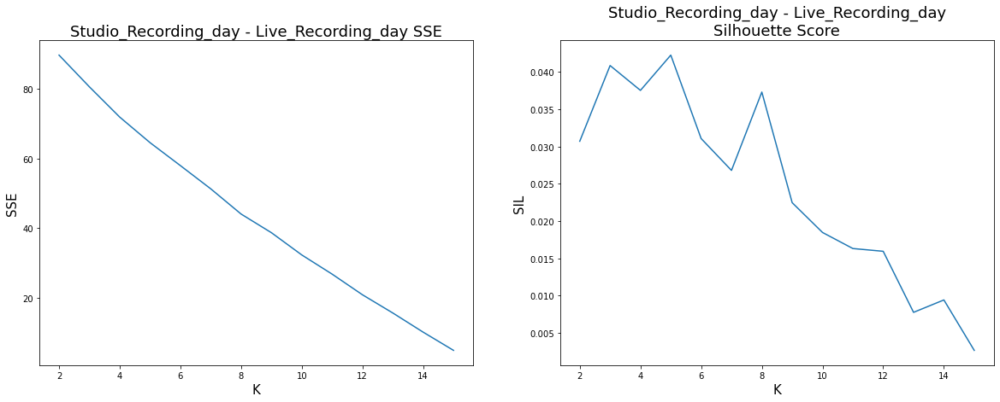

In [526]:
find_optimal_k_kmeans(15, 'euclidean', X_paa, False, album_type)

In [527]:
cluster_centers_studio_live_paa, dict_label_studio_live_paa, labels_studio_live_paa = run_kmeans(5, 1000, 10, \
                                                                'euclidean', X_paa, False)

cluster_centers_shape (5, 183, 1)

Labels:  {0: 6, 1: 4, 2: 2, 3: 2, 4: 2}

SSE:  64.50510339142434
Silhouette Score:  0.04225009917451871


Dataset con le labels associate


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.700064,-0.732497,-0.716280,-0.732497,-0.197347,-0.375730,-0.700064,-0.716280,-0.732497,-0.732497,...,-0.051397,0.548620,-0.132480,-0.181130,-0.602764,-0.327080,0.564836,-0.278430,-0.683847,2
2010_studio,-0.515517,-0.596607,-0.645260,0.198071,0.149417,0.830570,3.133514,-0.369556,-0.937183,-0.466863,...,1.527940,0.052110,-0.174941,0.733262,0.895442,-0.629042,-0.580389,0.863006,-0.969619,0
2011_studio,-0.333997,2.156354,0.548411,0.313102,0.724892,-0.569306,-1.000705,0.038575,0.136621,0.842547,...,-0.922269,-0.765396,0.881765,-0.608524,1.548473,-0.981096,-0.314388,0.117011,-0.981096,1
2012_studio,0.298327,0.643531,-0.771803,-0.771803,0.816133,5.321037,0.660791,0.470929,-0.253998,-0.495640,...,-0.426600,1.610100,0.350108,-0.599201,-0.029616,0.022165,0.315588,-0.029616,0.056685,3
2013_studio,-0.107554,2.511197,-0.734383,1.856509,1.550059,0.658570,0.226754,0.588922,0.449627,-0.469722,...,-0.037907,0.923231,1.048597,-0.121484,-0.609017,-0.873678,-0.776171,0.157107,-0.372215,3
2014_studio,-0.002041,0.424836,0.442623,0.478196,0.460410,0.193611,0.300330,-0.268840,-0.571211,-0.642357,...,0.656062,2.061200,1.420884,0.495983,-0.251053,-0.677930,-0.179907,-0.375559,-0.464492,0
2015_studio,0.304585,-0.042034,-0.495305,-0.388653,-0.095360,-0.108692,-0.375322,-0.628620,-0.761935,0.117944,...,0.197933,-0.415316,0.037955,0.024623,-0.308664,-0.735272,-0.655283,-0.335327,-0.282001,4
2016_studio,-0.425313,0.249307,1.143569,0.625838,0.484639,-0.189981,1.159258,-0.095848,-0.629268,-0.142914,...,-0.080159,0.688594,-0.346869,-0.346869,0.421884,-0.252736,-0.441002,-0.346869,2.947784,0
2009_live,4.467293,-0.553669,-0.082954,-0.553669,-0.553669,-0.553669,-0.122180,-0.122180,-0.553669,-0.514443,...,1.093834,0.387761,-0.396764,0.270082,-0.553669,-0.553669,-0.161406,-0.553669,-0.553669,2


Cluster 0
 ['2010_studio', '2014_studio', '2016_studio', '2010_live', '2015_live', '2016_live']

Cluster 1
 ['2011_studio', '2011_live', '2012_live', '2013_live']

Cluster 2
 ['2009_studio', '2009_live']

Cluster 3
 ['2012_studio', '2013_studio']

Cluster 4
 ['2015_studio', '2014_live']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,3,3,6,1.0000,0.5000
Cluster 1,1,3,4,0.8113,0.7500
Cluster 2,1,1,2,1.0000,0.5000
Cluster 3,2,0,2,-0.0000,1.0000
Cluster 4,1,1,2,1.0000,0.5000
Total,8,8,16,0.8278,0.6250


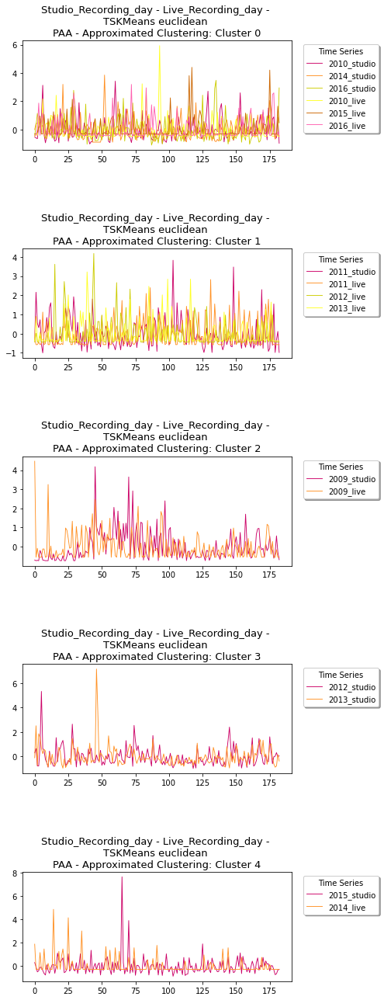

In [528]:
analyze_approximated_clusters(labels_studio_live_paa, X_paa, df_tss_studio_live_scaled, album_type, \
                               '\nTSKMeans euclidean \nPAA - Approximated Clustering', True)

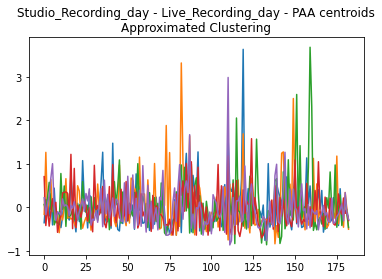

In [529]:
plot_centroids_approximated(cluster_centers_studio_live_paa, X_paa, album_type, 'PAA')

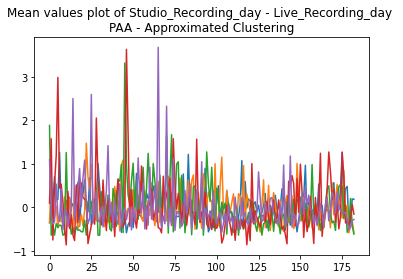

In [530]:
plot_mean_values_approximated(labels_studio_live_paa, X_paa, album_type, 'PAA')

<h3>DTW</h3>

k:  2 SSE:  27.338418908016504 Silhouette Score:  0.060123461678237

k:  3 SSE:  25.035919688607553 Silhouette Score:  0.021217705279049696

k:  4 SSE:  21.71771859578158 Silhouette Score:  0.02413699530455913

k:  5 SSE:  19.350466213721027 Silhouette Score:  0.04792278449780484

k:  6 SSE:  17.08088493574623 Silhouette Score:  0.022192134917378623

k:  7 SSE:  14.593843525279748 Silhouette Score:  0.05026808439468684

k:  8 SSE:  12.208388945389636 Silhouette Score:  0.03189180561592596

k:  9 SSE:  10.994507022249902 Silhouette Score:  0.022113787115971045

k:  10 SSE:  8.960600259792791 Silhouette Score:  0.012511556005629735

k:  11 SSE:  7.209499167912922 Silhouette Score:  0.01770338544276644

k:  12 SSE:  5.268637029421186 Silhouette Score:  0.015210600428113584

k:  13 SSE:  3.6298466243092005 Silhouette Score:  0.016369110103943013

k:  14 SSE:  2.056641223661019 Silhouette Score:  0.023411554175300265

k:  15 SSE:  0.8416235172941535 Silhouette Score:  0.01663831920414656



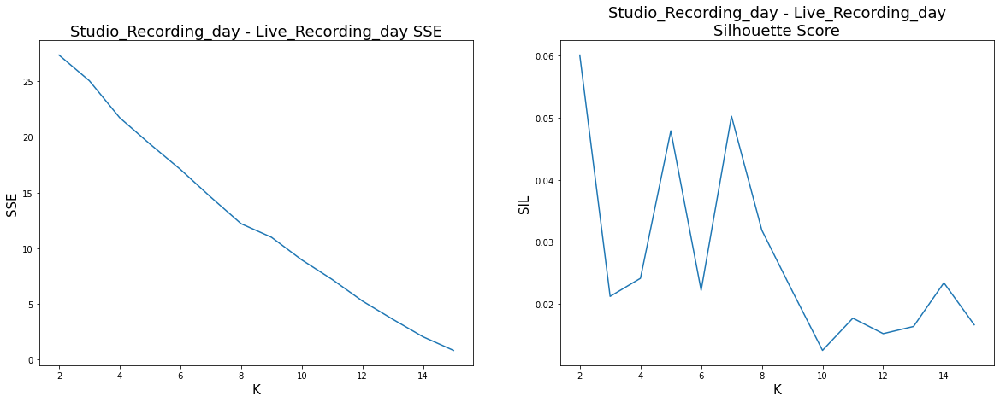

In [531]:
find_optimal_k_kmeans(15, 'dtw', X_paa, False, album_type)

In [532]:
cluster_centers_studio_live_paa_dtw, dict_label_studio_live_paa_dtw, \
labels_studio_live_paa_dtw = run_kmeans(7, 1000, 10, 'dtw', X_paa, False)

cluster_centers_shape (7, 183, 1)

Labels:  {0: 2, 1: 2, 2: 1, 3: 4, 4: 4, 5: 1, 6: 2}

SSE:  14.593843525279748
Silhouette Score:  0.05026808439468684


Dataset con le labels associate


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,-0.700064,-0.732497,-0.716280,-0.732497,-0.197347,-0.375730,-0.700064,-0.716280,-0.732497,-0.732497,...,-0.051397,0.548620,-0.132480,-0.181130,-0.602764,-0.327080,0.564836,-0.278430,-0.683847,3
2010_studio,-0.515517,-0.596607,-0.645260,0.198071,0.149417,0.830570,3.133514,-0.369556,-0.937183,-0.466863,...,1.527940,0.052110,-0.174941,0.733262,0.895442,-0.629042,-0.580389,0.863006,-0.969619,3
2011_studio,-0.333997,2.156354,0.548411,0.313102,0.724892,-0.569306,-1.000705,0.038575,0.136621,0.842547,...,-0.922269,-0.765396,0.881765,-0.608524,1.548473,-0.981096,-0.314388,0.117011,-0.981096,0
2012_studio,0.298327,0.643531,-0.771803,-0.771803,0.816133,5.321037,0.660791,0.470929,-0.253998,-0.495640,...,-0.426600,1.610100,0.350108,-0.599201,-0.029616,0.022165,0.315588,-0.029616,0.056685,5
2013_studio,-0.107554,2.511197,-0.734383,1.856509,1.550059,0.658570,0.226754,0.588922,0.449627,-0.469722,...,-0.037907,0.923231,1.048597,-0.121484,-0.609017,-0.873678,-0.776171,0.157107,-0.372215,6
2014_studio,-0.002041,0.424836,0.442623,0.478196,0.460410,0.193611,0.300330,-0.268840,-0.571211,-0.642357,...,0.656062,2.061200,1.420884,0.495983,-0.251053,-0.677930,-0.179907,-0.375559,-0.464492,3
2015_studio,0.304585,-0.042034,-0.495305,-0.388653,-0.095360,-0.108692,-0.375322,-0.628620,-0.761935,0.117944,...,0.197933,-0.415316,0.037955,0.024623,-0.308664,-0.735272,-0.655283,-0.335327,-0.282001,6
2016_studio,-0.425313,0.249307,1.143569,0.625838,0.484639,-0.189981,1.159258,-0.095848,-0.629268,-0.142914,...,-0.080159,0.688594,-0.346869,-0.346869,0.421884,-0.252736,-0.441002,-0.346869,2.947784,2
2009_live,4.467293,-0.553669,-0.082954,-0.553669,-0.553669,-0.553669,-0.122180,-0.122180,-0.553669,-0.514443,...,1.093834,0.387761,-0.396764,0.270082,-0.553669,-0.553669,-0.161406,-0.553669,-0.553669,1


Cluster 0
 ['2011_studio', '2011_live']

Cluster 1
 ['2009_live', '2014_live']

Cluster 2
 ['2016_studio']

Cluster 3
 ['2009_studio', '2010_studio', '2014_studio', '2012_live']

Cluster 4
 ['2010_live', '2013_live', '2015_live', '2016_live']

Cluster 5
 ['2012_studio']

Cluster 6
 ['2013_studio', '2015_studio']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,1,1,2,1.0000,0.5000
Cluster 1,0,2,2,-0.0000,1.0000
Cluster 2,1,0,1,-0.0000,1.0000
Cluster 3,3,1,4,0.8113,0.7500
Cluster 4,0,4,4,-0.0000,1.0000
Cluster 5,1,0,1,-0.0000,1.0000
Cluster 6,2,0,2,-0.0000,1.0000
Total,8,8,16,0.3278,0.8750


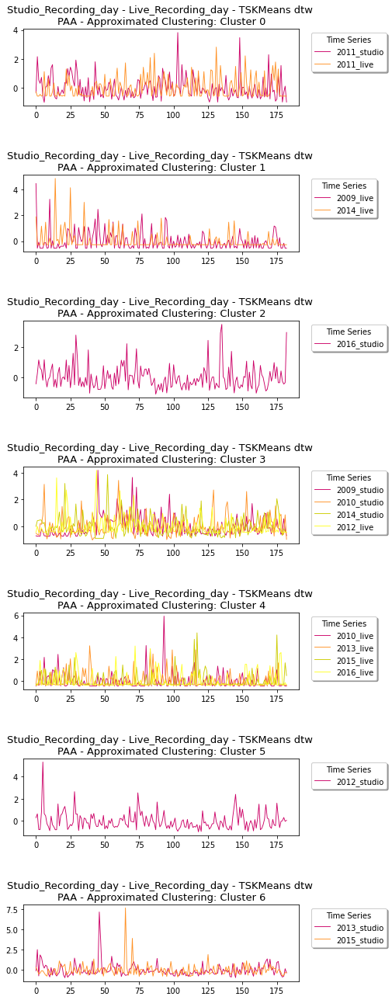

In [533]:
analyze_approximated_clusters(labels_studio_live_paa_dtw, X_paa, df_tss_studio_live_scaled, album_type, \
                               'TSKMeans dtw \nPAA - Approximated Clustering', True)

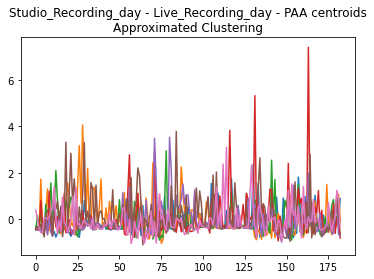

In [534]:
plot_centroids_approximated(cluster_centers_studio_live_paa_dtw, X_paa, album_type, 'PAA')

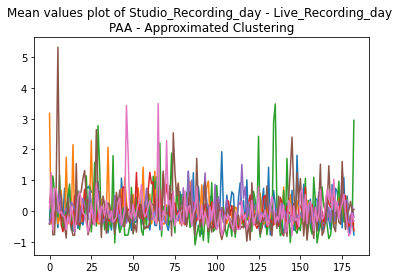

In [535]:
plot_mean_values_approximated(labels_studio_live_paa_dtw, X_paa, album_type, 'PAA')

<h3>OneD_SymbolicAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [536]:
n_sax1d_segments = 183
n_sax_symbols_avg = 50
#n_sax_symbols_slope = 4

one_d_sax = OneD_SymbolicAggregateApproximation(n_segments=n_sax1d_segments,\
     alphabet_size_avg=n_sax_symbols_avg)#, alphabet_size_slope=n_sax_symbols_slope)

X_sax1d = one_d_sax.fit_transform(tss_studio_live_scaled)

<h3>EUCLIDEAN</h3>

k:  2 SSE:  16619.317708333336 Silhouette Score:  0.05551361260443133

k:  3 SSE:  14899.909375000001 Silhouette Score:  0.051537471287417994

k:  4 SSE:  13377.434895833334 Silhouette Score:  0.04427710781134053

k:  5 SSE:  11770.000000000007 Silhouette Score:  0.04882645585247683

k:  6 SSE:  10397.286458333338 Silhouette Score:  0.04782495485113421

k:  7 SSE:  8969.89375 Silhouette Score:  0.053009600791303076

k:  8 SSE:  7852.963541666666 Silhouette Score:  0.041586965714868904

k:  9 SSE:  6520.416666666664 Silhouette Score:  0.050364361324748225

k:  10 SSE:  5539.479166666664 Silhouette Score:  0.04304229541146088

k:  11 SSE:  4482.729166666664 Silhouette Score:  0.037753838075700576

k:  12 SSE:  3490.34375 Silhouette Score:  0.026745545266545594

k:  13 SSE:  2542.0937499999973 Silhouette Score:  0.018859684843487812

k:  14 SSE:  1644.5 Silhouette Score:  0.016707889078543495

k:  15 SSE:  762.4062500000001 Silhouette Score:  0.005847439368869959



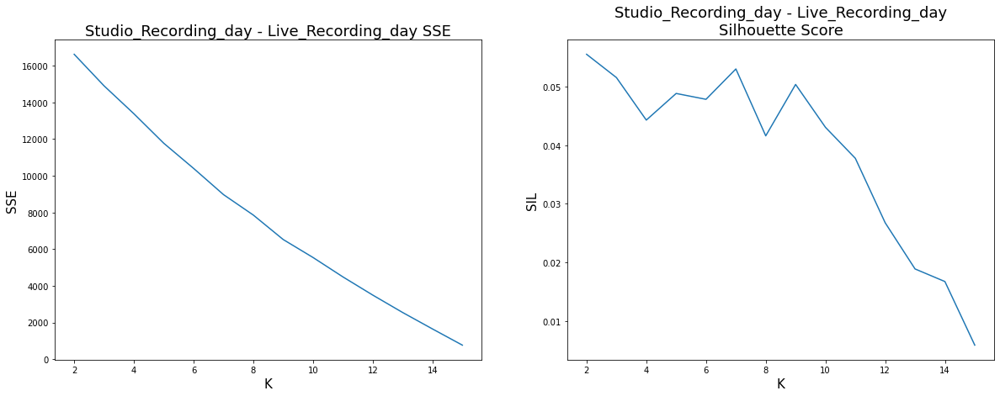

In [537]:
find_optimal_k_kmeans(15, 'euclidean', X_sax1d, False, album_type)

In [538]:
cluster_centers_studio_live_sax1d, dict_label_studio_live_sax1d, \
labels_studio_live_sax1d = run_kmeans(7, 1000, 10, 'euclidean', X_sax1d, False)

cluster_centers_shape (7, 183, 2)

Labels:  {0: 1, 1: 3, 2: 5, 3: 1, 4: 2, 5: 1, 6: 3}

SSE:  8969.89375
Silhouette Score:  0.053009600791303076


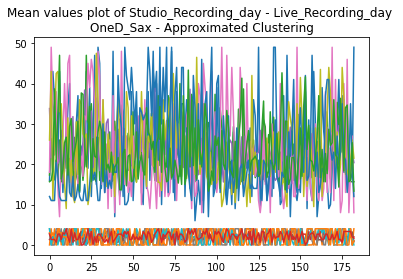

In [539]:
plot_mean_values_approximated(labels_studio_live_sax1d, X_sax1d, album_type, 'OneD_Sax')

<h3>DTW</h3>

k:  2 SSE:  5023.432037874376 Silhouette Score:  0.05474241751284163

k:  3 SSE:  4382.3602971064975 Silhouette Score:  0.06654118503671316

k:  4 SSE:  3948.2823439262243 Silhouette Score:  0.0647556834255085

k:  5 SSE:  3413.756651311834 Silhouette Score:  0.06466630118271874

k:  6 SSE:  3041.486886594022 Silhouette Score:  0.0631690279222685

k:  7 SSE:  2668.912959651651 Silhouette Score:  0.047454808715027434

k:  8 SSE:  2190.3572132335057 Silhouette Score:  0.05700541614860505

k:  9 SSE:  1765.71551693801 Silhouette Score:  0.06251179101957806

k:  10 SSE:  1412.4977922239657 Silhouette Score:  0.04716827533645929

k:  11 SSE:  1160.5926711972666 Silhouette Score:  0.014131962863291745

k:  12 SSE:  822.9616811128545 Silhouette Score:  0.023697376833686275

k:  13 SSE:  557.2105931956115 Silhouette Score:  0.016389148496446352

k:  14 SSE:  353.6297275641025 Silhouette Score:  0.0028451490688940983

k:  15 SSE:  152.79781746031748 Silhouette Score:  0.0038277953049916085



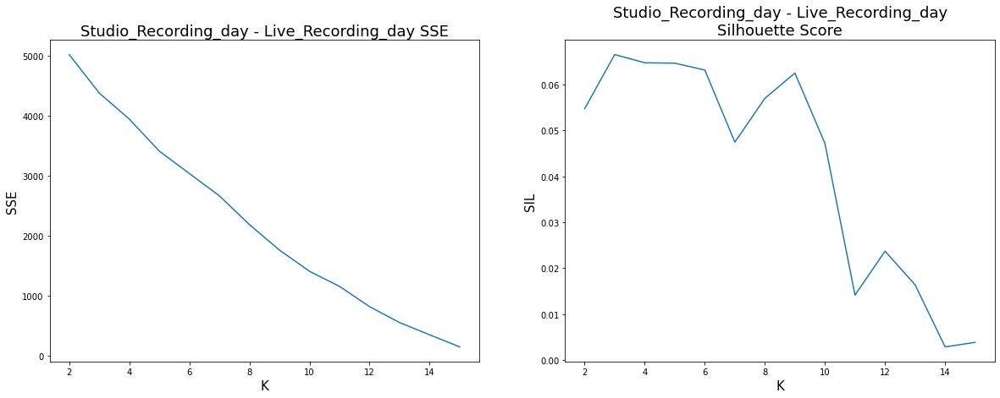

In [540]:
find_optimal_k_kmeans(15, 'dtw', X_sax1d, False, album_type)

In [541]:
cluster_centers_studio_live_sax1d_dtw, dict_label_studio_live_sax1d_dtw, \
labels_studio_live_sax1d_dtw = run_kmeans(3, 1000, 10, 'dtw', X_sax1d, False)

cluster_centers_shape (3, 183, 2)

Labels:  {0: 11, 1: 2, 2: 3}

SSE:  4382.3602971064975
Silhouette Score:  0.06654118503671316


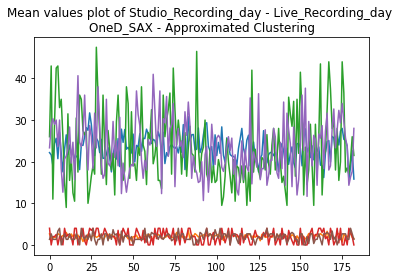

In [542]:
plot_mean_values_approximated(labels_studio_live_sax1d_dtw, X_sax1d, album_type, 'OneD_SAX')

<h3>SymbolicAggregateApproximation</h3>

<h3>TimeSeriesKMeans</h3>

In [543]:
n_sax_segments = 183
n_sax_symbols = 50

sax = SymbolicAggregateApproximation(n_segments=n_sax_segments, \
                                     alphabet_size_avg=n_sax_symbols)

X_sax = sax.fit_transform(tss_studio_live_scaled)

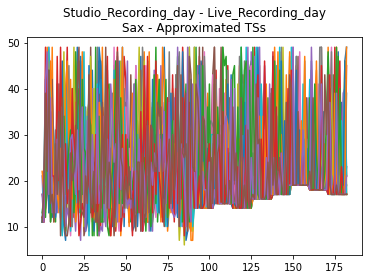

In [544]:
plt.plot(X_sax.reshape(X_sax.shape[1], X_sax.shape[0]))
plt.title(album_type + "\nSax - Approximated TSs")
plt.show()

<h3>EUCLIDEAN</h3>

k:  2 SSE:  16193.828125000004 Silhouette Score:  0.05700215698346006

k:  3 SSE:  14516.834374999999 Silhouette Score:  0.05193081642684244

k:  4 SSE:  13017.703125 Silhouette Score:  0.04516594645926082

k:  5 SSE:  11453.750000000004 Silhouette Score:  0.04966301327197371

k:  6 SSE:  10116.677083333336 Silhouette Score:  0.04836940487705274

k:  7 SSE:  8886.822916666666 Silhouette Score:  0.05008161024121242

k:  8 SSE:  7627.906249999999 Silhouette Score:  0.04273956133842141

k:  9 SSE:  6344.083333333333 Silhouette Score:  0.04776562709037512

k:  10 SSE:  5382.895833333333 Silhouette Score:  0.042893816596815224

k:  11 SSE:  4353.28125 Silhouette Score:  0.028000300359365883

k:  12 SSE:  3378.59375 Silhouette Score:  0.028639333147478033

k:  13 SSE:  2463.937499999999 Silhouette Score:  0.019327381690114845

k:  14 SSE:  1582.84375 Silhouette Score:  0.016546069321291674

k:  15 SSE:  736.15625 Silhouette Score:  0.0060521538294667976



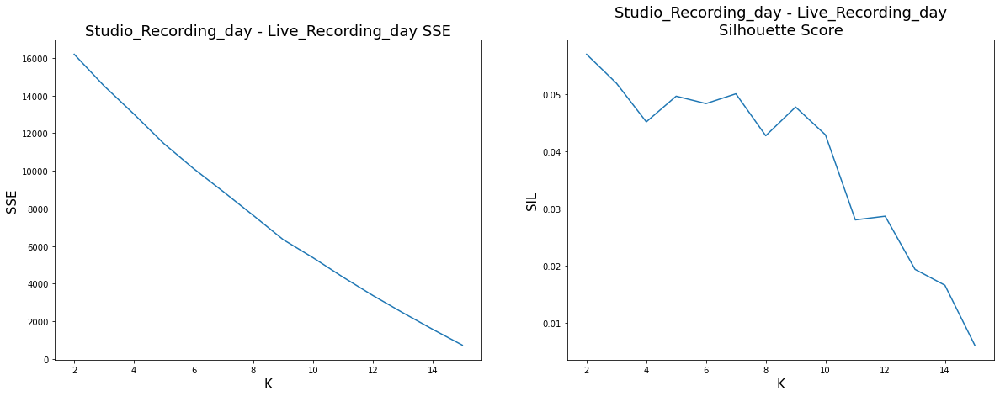

In [545]:
find_optimal_k_kmeans(15, 'euclidean', X_sax, False, album_type)

In [546]:
cluster_centers_studio_live_sax, dict_label_studio_live_sax, \
labels_studio_live_sax = run_kmeans(3, 1000, 10, 'euclidean', X_sax, False)

cluster_centers_shape (3, 183, 1)

Labels:  {0: 4, 1: 2, 2: 10}

SSE:  14516.834374999999
Silhouette Score:  0.05193081642684244


Dataset con le labels associate


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,12,11,11,11,21,17,12,11,11,11,...,23,35,22,21,13,18,35,19,12,2
2010_studio,15,13,12,28,27,39,49,17,8,16,...,46,26,21,38,40,13,14,40,8,2
2011_studio,18,49,35,31,38,14,7,25,27,40,...,8,11,40,13,46,8,18,27,8,0
2012_studio,30,37,11,11,39,49,37,34,19,15,...,16,47,31,13,24,25,31,24,26,1
2013_studio,22,49,11,48,46,37,29,36,33,15,...,24,41,42,22,13,9,10,28,17,1
2014_studio,24,33,33,34,33,28,30,19,14,13,...,37,49,46,34,20,12,21,17,16,2
2015_studio,30,24,15,17,23,22,17,13,11,27,...,28,16,25,25,18,11,12,18,19,2
2016_studio,16,29,43,36,34,21,43,23,13,22,...,23,37,18,18,33,20,16,18,49,2
2009_live,49,14,23,14,14,14,22,22,14,15,...,43,32,17,30,14,14,21,14,14,2


Cluster 0
 ['2011_studio', '2011_live', '2012_live', '2013_live']

Cluster 1
 ['2012_studio', '2013_studio']

Cluster 2
 ['2009_studio', '2010_studio', '2014_studio', '2015_studio', '2016_studio', '2009_live', '2010_live', '2014_live', '2015_live', '2016_live']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,1,3,4,0.8113,0.7500
Cluster 1,2,0,2,-0.0000,1.0000
Cluster 2,5,5,10,1.0000,0.5000
Total,8,8,16,0.8278,0.6250


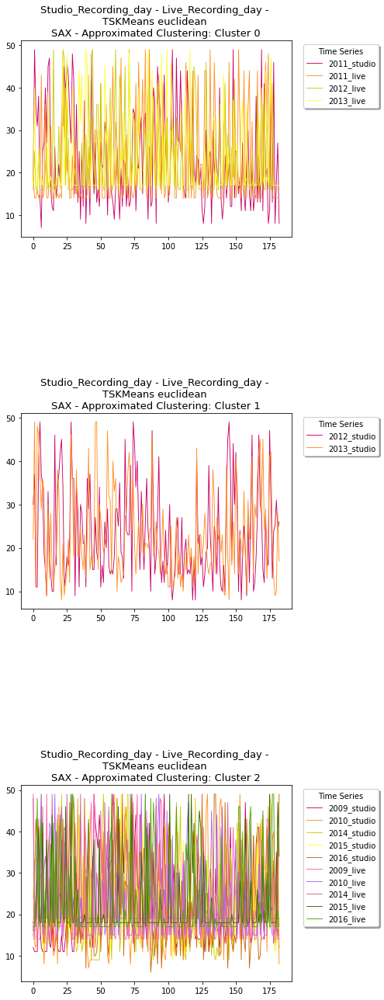

In [547]:
analyze_approximated_clusters(labels_studio_live_sax, X_sax, df_tss_studio_live_scaled, \
                              album_type, \
                              '\nTSKMeans euclidean \nSAX - Approximated Clustering', True)

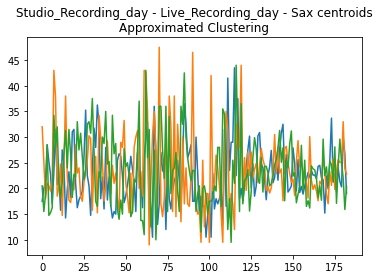

In [548]:
plot_centroids_approximated(cluster_centers_studio_live_sax, X_sax, album_type, 'Sax')

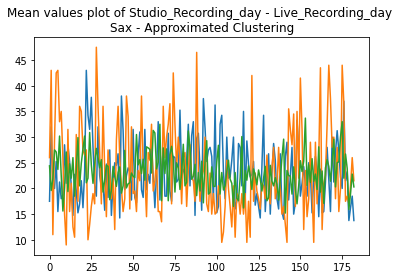

In [549]:
plot_mean_values_approximated(labels_studio_live_sax, X_sax, album_type, 'Sax')

<h3>DTW</h3>

k:  2 SSE:  4477.148225913136 Silhouette Score:  0.04707982144815402

k:  3 SSE:  3940.514854337905 Silhouette Score:  0.03996738090845938

k:  4 SSE:  3436.719139487117 Silhouette Score:  0.051209628973770904

k:  5 SSE:  3013.217105522748 Silhouette Score:  0.05913232939543767

k:  6 SSE:  2638.427670998938 Silhouette Score:  0.0465424197412137

k:  7 SSE:  2228.69920926704 Silhouette Score:  0.0503069354733756

k:  8 SSE:  1901.6243909267778 Silhouette Score:  0.06937333985320678

k:  9 SSE:  1572.7971657862947 Silhouette Score:  0.0647363152769361

k:  10 SSE:  1214.18010476842 Silhouette Score:  0.030548768119230203

k:  11 SSE:  978.7978131017534 Silhouette Score:  0.031000393067505988

k:  12 SSE:  730.8926047684201 Silhouette Score:  0.02074868882157953

k:  13 SSE:  523.8626502684406 Silhouette Score:  0.014379809917401187

k:  14 SSE:  316.76039186507944 Silhouette Score:  0.008938223845245936

k:  15 SSE:  136.98125000000002 Silhouette Score:  0.004506773750198631



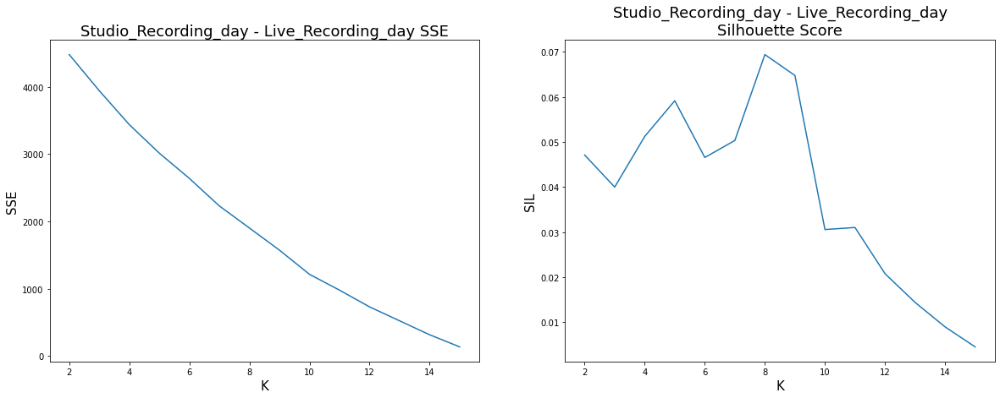

In [550]:
find_optimal_k_kmeans(15, 'dtw', X_sax, False, album_type)

In [551]:
cluster_centers_studio_live_sax_dtw, dict_label_studio_live_sax_dtw, \
labels_studio_live_sax_dtw = run_kmeans(8, 1000, 10, 'dtw', X_sax, False)

cluster_centers_shape (8, 183, 1)

Labels:  {0: 1, 1: 6, 2: 3, 3: 2, 4: 1, 5: 1, 6: 1, 7: 1}

SSE:  1901.6243909267778
Silhouette Score:  0.06937333985320678


Dataset con le labels associate


,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,Labels
track_date_created,,,,,,,,,,,,,,,,,,,,,
2009_studio,12,11,11,11,21,17,12,11,11,11,...,23,35,22,21,13,18,35,19,12,4
2010_studio,15,13,12,28,27,39,49,17,8,16,...,46,26,21,38,40,13,14,40,8,7
2011_studio,18,49,35,31,38,14,7,25,27,40,...,8,11,40,13,46,8,18,27,8,5
2012_studio,30,37,11,11,39,49,37,34,19,15,...,16,47,31,13,24,25,31,24,26,3
2013_studio,22,49,11,48,46,37,29,36,33,15,...,24,41,42,22,13,9,10,28,17,3
2014_studio,24,33,33,34,33,28,30,19,14,13,...,37,49,46,34,20,12,21,17,16,2
2015_studio,30,24,15,17,23,22,17,13,11,27,...,28,16,25,25,18,11,12,18,19,2
2016_studio,16,29,43,36,34,21,43,23,13,22,...,23,37,18,18,33,20,16,18,49,6
2009_live,49,14,23,14,14,14,22,22,14,15,...,43,32,17,30,14,14,21,14,14,2


Cluster 0
 ['2011_live']

Cluster 1
 ['2010_live', '2012_live', '2013_live', '2014_live', '2015_live', '2016_live']

Cluster 2
 ['2014_studio', '2015_studio', '2009_live']

Cluster 3
 ['2012_studio', '2013_studio']

Cluster 4
 ['2009_studio']

Cluster 5
 ['2011_studio']

Cluster 6
 ['2016_studio']

Cluster 7
 ['2010_studio']



,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,0,1,1,-0.0000,1.0000
Cluster 1,0,6,6,-0.0000,1.0000
Cluster 2,2,1,3,0.9183,0.6667
Cluster 3,2,0,2,-0.0000,1.0000
Cluster 4,1,0,1,-0.0000,1.0000
Cluster 5,1,0,1,-0.0000,1.0000
Cluster 6,1,0,1,-0.0000,1.0000
Cluster 7,1,0,1,-0.0000,1.0000
Total,8,8,16,0.1722,0.9375


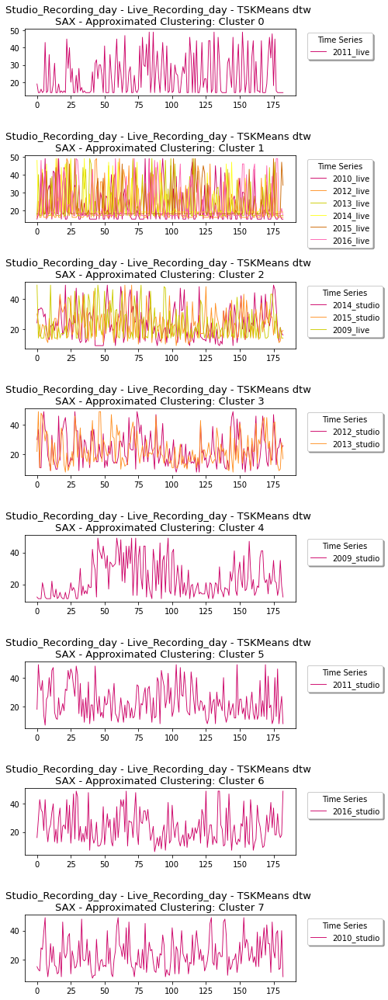

In [552]:
analyze_approximated_clusters(labels_studio_live_sax_dtw, X_sax, df_tss_studio_live_scaled, album_type, \
                               'TSKMeans dtw \nSAX - Approximated Clustering', True)

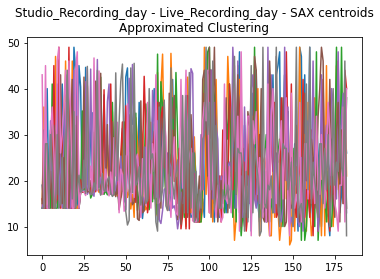

In [553]:
plot_centroids_approximated(cluster_centers_studio_live_sax_dtw, X_sax, album_type, 'SAX')

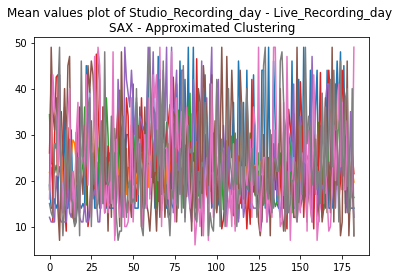

In [554]:
plot_mean_values_approximated(labels_studio_live_sax_dtw, X_sax, album_type, 'SAX')